# Your first neural network

In this project, you'll build your first neural network and use it to predict daily bike rental ridership. We've provided some of the code, but left the implementation of the neural network up to you (for the most part). After you've submitted this project, feel free to explore the data and the model more.



In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

## Load and prepare the data

A critical step in working with neural networks is preparing the data correctly. Variables on different scales make it difficult for the network to efficiently learn the correct weights. Below, we've written the code to load and prepare the data. You'll learn more about this soon!

In [2]:
data_path = 'Bike-Sharing-Dataset/hour.csv'

rides = pd.read_csv(data_path)

In [3]:
rides.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


## Checking out the data

This dataset has the number of riders for each hour of each day from January 1 2011 to December 31 2012. The number of riders is split between casual and registered, summed up in the `cnt` column. You can see the first few rows of the data above.

Below is a plot showing the number of bike riders over the first 10 days or so in the data set. (Some days don't have exactly 24 entries in the data set, so it's not exactly 10 days.) You can see the hourly rentals here. This data is pretty complicated! The weekends have lower over all ridership and there are spikes when people are biking to and from work during the week. Looking at the data above, we also have information about temperature, humidity, and windspeed, all of these likely affecting the number of riders. You'll be trying to capture all this with your model.

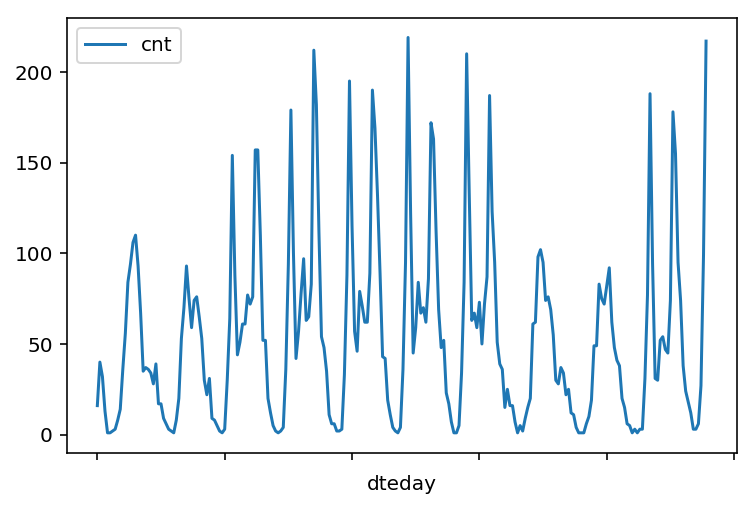

In [4]:
rides[:24*10].plot(x='dteday', y='cnt')

### Dummy variables
Here we have some categorical variables like season, weather, month. To include these in our model, we'll need to make binary dummy variables. This is simple to do with Pandas thanks to `get_dummies()`.

In [5]:
dummy_fields = ['season', 'weathersit', 'mnth', 'hr', 'weekday']
for each in dummy_fields:
    dummies = pd.get_dummies(rides[each], prefix=each, drop_first=False)
    rides = pd.concat([rides, dummies], axis=1)

fields_to_drop = ['instant', 'dteday', 'season', 'weathersit', 
                  'weekday', 'atemp', 'mnth', 'workingday', 'hr']
data = rides.drop(fields_to_drop, axis=1)
data.head()

,yr,holiday,temp,hum,windspeed,casual,registered,cnt,season_1,season_2,...,hr_21,hr_22,hr_23,weekday_0,weekday_1,weekday_2,weekday_3,weekday_4,weekday_5,weekday_6
0,0,0,0.24,0.81,0.0,3,13,16,1,0,...,0,0,0,0,0,0,0,0,0,1
1,0,0,0.22,0.80,0.0,8,32,40,1,0,...,0,0,0,0,0,0,0,0,0,1
2,0,0,0.22,0.80,0.0,5,27,32,1,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0.24,0.75,0.0,3,10,13,1,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0.24,0.75,0.0,0,1,1,1,0,...,0,0,0,0,0,0,0,0,0,1


### Scaling target variables
To make training the network easier, we'll standardize each of the continuous variables. That is, we'll shift and scale the variables such that they have zero mean and a standard deviation of 1.

The scaling factors are saved so we can go backwards when we use the network for predictions.

In [6]:
quant_features = ['casual', 'registered', 'cnt', 'temp', 'hum', 'windspeed']
# Store scalings in a dictionary so we can convert back later
scaled_features = {}
for each in quant_features:
    mean, std = data[each].mean(), data[each].std()
    scaled_features[each] = [mean, std]
    data.loc[:, each] = (data[each] - mean)/std

### Splitting the data into training, testing, and validation sets

We'll save the data for the last approximately 21 days to use as a test set after we've trained the network. We'll use this set to make predictions and compare them with the actual number of riders.

In [7]:
# Save data for approximately the last 21 days 
test_data = data[-21*24:]

# Now remove the test data from the data set 
data = data[:-21*24]

# Separate the data into features and targets
target_fields = ['cnt', 'casual', 'registered']
features, targets = data.drop(target_fields, axis=1), data[target_fields]
test_features, test_targets = test_data.drop(target_fields, axis=1), test_data[target_fields]

We'll split the data into two sets, one for training and one for validating as the network is being trained. Since this is time series data, we'll train on historical data, then try to predict on future data (the validation set).

In [8]:
# Hold out the last 60 days or so of the remaining data as a validation set
train_features, train_targets = features[:-60*24], targets[:-60*24]
val_features, val_targets = features[-60*24:], targets[-60*24:]

## Time to build the network

Below you'll build your network. We've built out the structure. You'll implement both the forward pass and backwards pass through the network. You'll also set the hyperparameters: the learning rate, the number of hidden units, and the number of training passes.

<img src="assets/neural_network.png" width=300px>

The network has two layers, a hidden layer and an output layer. The hidden layer will use the sigmoid function for activations. The output layer has only one node and is used for the regression, the output of the node is the same as the input of the node. That is, the activation function is $f(x)=x$. A function that takes the input signal and generates an output signal, but takes into account the threshold, is called an activation function. We work through each layer of our network calculating the outputs for each neuron. All of the outputs from one layer become inputs to the neurons on the next layer. This process is called *forward propagation*.

We use the weights to propagate signals forward from the input to the output layers in a neural network. We use the weights to also propagate error backwards from the output back into the network to update our weights. This is called *backpropagation*.

> **Hint:** You'll need the derivative of the output activation function ($f(x) = x$) for the backpropagation implementation. If you aren't familiar with calculus, this function is equivalent to the equation $y = x$. What is the slope of that equation? That is the derivative of $f(x)$.

Below, you have these tasks:
1. Implement the sigmoid function to use as the activation function. Set `self.activation_function` in `__init__` to your sigmoid function.
2. Implement the forward pass in the `train` method.
3. Implement the backpropagation algorithm in the `train` method, including calculating the output error.
4. Implement the forward pass in the `run` method.
  

In [9]:
#############
# In the my_answers.py file, fill out the TODO sections as specified
#############

from my_answers import NeuralNetwork

In [10]:
def MSE(y, Y):
    return np.mean((y-Y)**2)

## Unit tests

Run these unit tests to check the correctness of your network implementation. This will help you be sure your network was implemented correctly befor you starting trying to train it. These tests must all be successful to pass the project.

In [11]:
import unittest

inputs = np.array([[0.5, -0.2, 0.1]])
targets = np.array([[0.4]])
test_w_i_h = np.array([[0.1, -0.2],
                       [0.4, 0.5],
                       [-0.3, 0.2]])
test_w_h_o = np.array([[0.3],
                       [-0.1]])

class TestMethods(unittest.TestCase):
    
    ##########
    # Unit tests for data loading
    ##########
    
    def test_data_path(self):
        # Test that file path to dataset has been unaltered
        self.assertTrue(data_path.lower() == 'bike-sharing-dataset/hour.csv')
        
    def test_data_loaded(self):
        # Test that data frame loaded
        self.assertTrue(isinstance(rides, pd.DataFrame))
    
    ##########
    # Unit tests for network functionality
    ##########

    def test_activation(self):
        network = NeuralNetwork(3, 2, 1, 0.5)
        # Test that the activation function is a sigmoid
        self.assertTrue(np.all(network.activation_function(0.5) == 1/(1+np.exp(-0.5))))

    def test_train(self):
        # Test that weights are updated correctly on training
        network = NeuralNetwork(3, 2, 1, 0.5)
        network.weights_input_to_hidden = test_w_i_h.copy()
        network.weights_hidden_to_output = test_w_h_o.copy()
        
        network.train(inputs, targets)
        self.assertTrue(np.allclose(network.weights_hidden_to_output, 
                                    np.array([[ 0.37275328], 
                                              [-0.03172939]])))
        self.assertTrue(np.allclose(network.weights_input_to_hidden,
                                    np.array([[ 0.10562014, -0.20185996], 
                                              [0.39775194, 0.50074398], 
                                              [-0.29887597, 0.19962801]])))

    def test_run(self):
        # Test correctness of run method
        network = NeuralNetwork(3, 2, 1, 0.5)
        network.weights_input_to_hidden = test_w_i_h.copy()
        network.weights_hidden_to_output = test_w_h_o.copy()

        self.assertTrue(np.allclose(network.run(inputs), 0.09998924))

suite = unittest.TestLoader().loadTestsFromModule(TestMethods())
unittest.TextTestRunner().run(suite)

.....

output_error_term:
[ 0.30001076]


weights_hidden_to_output:
[[ 0.3]
 [-0.1]]


hiddenError:
[[ 0.09000323]
 [-0.03000108]]


hidden_outputs[:,None]:
[[ 0.4850045 ]
 [ 0.45512111]]


hidden_error_term:
[[ 0.02248057]
 [-0.00743984]]


delta_weights_h_o:
[[ 0.]
 [ 0.]]


output_error_term * hidden_outputs[:,None]
[[ 0.14550657]
 [ 0.13654123]]


delta_weights_i_h:
[[ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]]


X:
[ 0.5 -0.2  0.1]


(hidden_error_term * X).T :
[[ 0.01124028 -0.00371992]
 [-0.00449611  0.00148797]
 [ 0.00224806 -0.00074398]]





----------------------------------------------------------------------
Ran 5 tests in 0.021s

OK


<unittest.runner.TextTestResult run=5 errors=0 failures=0>

## Training the network

Here you'll set the hyperparameters for the network. The strategy here is to find hyperparameters such that the error on the training set is low, but you're not overfitting to the data. If you train the network too long or have too many hidden nodes, it can become overly specific to the training set and will fail to generalize to the validation set. That is, the loss on the validation set will start increasing as the training set loss drops.

You'll also be using a method know as Stochastic Gradient Descent (SGD) to train the network. The idea is that for each training pass, you grab a random sample of the data instead of using the whole data set. You use many more training passes than with normal gradient descent, but each pass is much faster. This ends up training the network more efficiently. You'll learn more about SGD later.

### Choose the number of iterations
This is the number of batches of samples from the training data we'll use to train the network. The more iterations you use, the better the model will fit the data. However, this process can have sharply diminishing returns and can waste computational resources if you use too many iterations.  You want to find a number here where the network has a low training loss, and the validation loss is at a minimum. The ideal number of iterations would be a level that stops shortly after the validation loss is no longer decreasing.

### Choose the learning rate
This scales the size of weight updates. If this is too big, the weights tend to explode and the network fails to fit the data. Normally a good choice to start at is 0.1; however, if you effectively divide the learning rate by n_records, try starting out with a learning rate of 1. In either case, if the network has problems fitting the data, try reducing the learning rate. Note that the lower the learning rate, the smaller the steps are in the weight updates and the longer it takes for the neural network to converge.

### Choose the number of hidden nodes
In a model where all the weights are optimized, the more hidden nodes you have, the more accurate the predictions of the model will be.  (A fully optimized model could have weights of zero, after all.) However, the more hidden nodes you have, the harder it will be to optimize the weights of the model, and the more likely it will be that suboptimal weights will lead to overfitting. With overfitting, the model will memorize the training data instead of learning the true pattern, and won't generalize well to unseen data.  

Try a few different numbers and see how it affects the performance. You can look at the losses dictionary for a metric of the network performance. If the number of hidden units is too low, then the model won't have enough space to learn and if it is too high there are too many options for the direction that the learning can take. The trick here is to find the right balance in number of hidden units you choose.  You'll generally find that the best number of hidden nodes to use ends up being between the number of input and output nodes.

In [12]:
import sys

####################
### Set the hyperparameters in you myanswers.py file ###
####################

from my_answers import iterations, learning_rate, hidden_nodes, output_nodes


N_i = train_features.shape[1]
network = NeuralNetwork(N_i, hidden_nodes, output_nodes, learning_rate)

losses = {'train':[], 'validation':[]}
for ii in range(iterations):
    # Go through a random batch of 128 records from the training data set
    batch = np.random.choice(train_features.index, size=128)
    X, y = train_features.ix[batch].values, train_targets.ix[batch]['cnt']
                             
    network.train(X, y)
    
    # Printing out the training progress
    train_loss = MSE(network.run(train_features).T, train_targets['cnt'].values)
    val_loss = MSE(network.run(val_features).T, val_targets['cnt'].values)
    sys.stdout.write("\rProgress: {:2.1f}".format(100 * ii/float(iterations)) \
                     + "% ... Training loss: " + str(train_loss)[:5] \
                     + " ... Validation loss: " + str(val_loss)[:5])
    sys.stdout.flush()
    
    losses['train'].append(train_loss)
    losses['validation'].append(val_loss)

C:\Users\hooman\Anaconda3\envs\hsPython3Env\lib\site-packages\ipykernel_launcher.py:17: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


output_error_term:
[-0.01921626]


weights_hidden_to_output:
[[ 0.37107834]
 [-0.75749602]]


hiddenError:
[[-0.00713074]
 [ 0.01455624]]


hidden_outputs[:,None]:
[[ 0.37235077]
 [ 0.41513755]]


hidden_error_term:
[[-0.00166649]
 [ 0.00353423]]


delta_weights_h_o:
[[ 0.]
 [ 0.]]


output_error_term * hidden_outputs[:,None]
[[-0.00715519]
 [-0.00797739]]


delta_weights_i_h:
[[ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]]


X

 [-0.38094782]]


delta_weights_h_o:
[[-1.45472373]
 [ 0.36350054]]


output_error_term * hidden_outputs[:,None]
[[ 0.71230567]
 [ 0.93251146]]


delta_weights_i_h:
[[  3.55775655e-02  -6.82659792e-02]
 [  0.00000000e+00   0.00000000e+00]
 [  9.75416850e-01  -2.19655234e+00]
 [ -5.89062724e-01   1.20914084e+00]
 [  1.60197962e-02   8.19765106e-05]
 [ -3.15279135e-01   7.42696870e-01]
 [ -1.03098620e-01   2.08072740e-01]
 [  3.14091526e-01  -6.87271158e-01]
 [  1.57223241e-01  -3.27111968e-01]
 [  4.46012318e-01  -9.02887144e-01]
 [ -1.84231487e-01   4.06994521e-01]
 [ -2.08843819e-01   4.32279107e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -2.41662793e-01   5.76154126e-01]
 [ -4.29026912e-02   7.73687011e-02]
 [ -9.93468090e-02   2.35861916e-01]
 [  1.19477452e-01  -2.43908974e-01]
 [ -1.53942914e-01   3.05293841e-01]
 [  0.00000000e+00   0.00000000e+00]
 [  3.14091526e-01  -6.87271158e-01]
 [  0.00000000e+00   0.00000000e+00]
 [  0.00000000e+00   0.00000000e+00]
 [  3.87396101e-03  -

 [ -2.11894892e-02   1.07827586e-01]]


X:
[ 0.          0.          0.22337816 -0.14113338  0.51988127  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]


(hidden_error_term * X).T :
[[-0.          0.        ]
 [-0.          0.        ]
 [-0.01777945  0.03647854]
 [ 0.0112333  -0.02304764]
 [-0.04137917  0.08489866]
 [-0.          0.        ]
 [-0.0795935   0.16330395]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.0795935   0.16330395]
 [-0.          0.        ]
 [-0.

[[ 0.16433608 -0.35884029]
 [ 0.         -0.        ]
 [ 0.25860483 -0.56468323]
 [-0.14244418  0.31103767]
 [ 0.00524197 -0.01144624]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.16433608 -0.35884029]
 [ 0.         -0.        ]
 [ 0.16433608 -0.35884029]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.16433608 -0.35884029]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 

 [-0.07291739  0.14615384]]


output_error_term:
[-0.42492791]


weights_hidden_to_output:
[[ 0.37107834]
 [-0.75749602]]


hiddenError:
[[-0.15768154]
 [ 0.3218812 ]]


hidden_outputs[:,None]:
[[ 0.78894787]
 [ 0.39657629]]


hidden_error_term:
[[-0.02625542]
 [ 0.07702731]]


delta_weights_h_o:
[[ 1.95880198]
 [ 4.44030611]]


output_error_term * hidden_outputs[:,None]
[[-0.33524597]
 [-0.16851633]]


delta_weights_i_h:
[[ 0.87193213 -1.75560064]
 [-0.07382683  0.16098981]
 [ 2.81449413 -6.37074802]
 [-2.16561928  4.58007398]
 [ 1.92816537 -3.9793526 ]
 [-0.43191441  1.13339   ]
 [ 0.18980119 -0.42436934]
 [ 0.6900851  -1.50826637]
 [ 0.49729822 -1.03264042]
 [ 0.89779761 -1.82490037]
 [ 0.29757623 -0.58083521]
 [-0.25010374  0.57384945]
 [ 0.          0.        ]
 [-0.49106662  1.21282191]
 [-0.19613127  0.43877646]
 [ 0.37071527 -0.73659692]
 [ 0.19844749 -0.40786549]
 [-0.20671849  0.41584084]
 [ 0.08264041 -0.21395614]
 [ 0.66148054 -1.4513383 ]
 [-0.11835009  0.24494668]
 [ 0.39

 [ 0.02887669]]


delta_weights_h_o:
[[ 0.12615297]
 [ 3.92463795]]


output_error_term * hidden_outputs[:,None]
[[-0.10371645]
 [-0.05989485]]


delta_weights_i_h:
[[ 1.16549116 -2.27608714]
 [-0.07382683  0.16098981]
 [ 3.44781717 -7.97056325]
 [-2.53149688  5.217522  ]
 [ 1.76659375 -3.36668009]
 [-0.77599686  2.0102332 ]
 [ 0.44072146 -0.93595136]
 [ 0.63508395 -1.39700539]
 [ 0.57377512 -1.18879539]
 [ 0.87162125 -1.57596654]
 [ 0.28176211 -0.54807173]
 [-0.2797997   0.61251932]
 [ 0.          0.        ]
 [-0.58915942  1.47334436]
 [-0.29020468  0.73350813]
 [ 0.21879902 -0.41500784]
 [ 0.27771784 -0.56962055]
 [-0.01925446  0.03325041]
 [ 0.06682629 -0.18119266]
 [ 0.66148054 -1.4513383 ]
 [-0.19129245  0.39048992]
 [ 0.4939809  -1.0111222 ]
 [ 0.15998923 -0.34698538]
 [ 0.09765279 -0.19516414]
 [-0.01295195  0.02831932]
 [-0.1869413   0.39863118]
 [-0.06542516  0.13363182]
 [-0.26844763  0.58876435]
 [-0.2724504   0.63120871]
 [-0.53242598  1.14533597]
 [-0.4120446   0.93539299

output_error_term:
[-0.78715902]


weights_hidden_to_output:
[[ 0.37107834]
 [-0.75749602]]


hiddenError:
[[-0.29209767]
 [ 0.59626983]]


hidden_outputs[:,None]:
[[ 0.64599803]
 [ 0.48153934]]


hidden_error_term:
[[-0.06679823]
 [ 0.14886425]]


delta_weights_h_o:
[[-0.21576514]
 [ 4.27656368]]


output_error_term * hidden_outputs[:,None]
[[-0.50850318]
 [-0.37904804]]


delta_weights_i_h:
[[ 1.64612137 -3.22050064]
 [ 0.0972716  -0.1795932 ]
 [ 4.30025586 -9.80550338]
 [-3.10840229  6.45999302]
 [ 1.68372908 -3.18253703]
 [-0.88715417  2.29215798]
 [ 0.33876565 -0.69979598]
 [ 0.80122371 -1.7234552 ]
 [ 0.73507323 -1.51992904]
 [ 1.07566615 -1.95646487]
 [ 0.28687275 -0.52498767]
 [-0.37463047  0.8304303 ]
 [ 0.          0.        ]
 [-0.61087346  1.54055119]
 [-0.38805359  0.96681579]
 [ 0.05692224 -0.05819883]
 [ 0.27771784 -0.56962055]
 [-0.01925446  0.03325041]
 [ 0.05814374 -0.16306708]
 [ 0.66148054 -1.4513383 ]
 [-0.12794938  0.2652422 ]
 [ 0.83508489 -1.70082685]
 [ 0.15998

[[  1.50842643  -2.91678886]
 [  0.04086304  -0.05479812]
 [  4.39276144 -10.02945636]
 [ -3.29791477   6.86453835]
 [  1.74287991  -3.29448847]
 [ -0.88715417   2.29215798]
 [  0.13900802  -0.24493386]
 [  0.66125513  -1.43771975]
 [  0.63570352  -1.31618851]
 [  0.78761297  -1.34294847]
 [  0.20286104  -0.3293558 ]
 [ -0.44166151   0.96562014]
 [  0.           0.        ]
 [ -0.61087346   1.54055119]
 [ -0.38805359   0.96681579]
 [ -0.01750652   0.11817424]
 [  0.15238898  -0.29113151]
 [ -0.01925446   0.03325041]
 [  0.05814374  -0.16306708]
 [  0.52591348  -1.17454362]
 [ -0.12794938   0.2652422 ]
 [  0.7983447   -1.62333539]
 [  0.15998923  -0.34698538]
 [  0.09765279  -0.19516414]
 [ -0.07998299   0.16350916]
 [ -0.1869413    0.39863118]
 [ -0.25559984   0.56923516]
 [ -0.26844763   0.58876435]
 [ -0.2724504    0.63120871]
 [ -0.68979224   1.47634603]
 [ -0.4912031    1.08739258]
 [ -0.15966882   0.3867155 ]
 [  0.14948317  -0.30577147]
 [  0.23754172  -0.47096048]
 [  0.14550526

[ 0.          0.          1.7813655  -1.12594737  0.76428167  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]


(hidden_error_term * X).T :
[[ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.01839793 -0.04442365]
 [-0.01162877  0.02807885]
 [ 0.00789349 -0.01905964]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.01032799 -0.02493798]
 [ 0.         -0.        ]
 [ 0.01032799 -0.02493798]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.    

Progress: 0.0% ... Training loss: 1.011 ... Validation loss: 1.484output_error_term:
[-0.3337403]


weights_hidden_to_output:
[[ 0.36704409]
 [-0.75649826]]


hiddenError:
[[-0.1224974 ]
 [ 0.25247396]]


hidden_outputs[:,None]:
[[ 0.42556091]
 [ 0.52659761]]


hidden_error_term:
[[-0.02994557]
 [ 0.06293988]]


delta_weights_h_o:
[[ 0.]
 [ 0.]]


output_error_term * hidden_outputs[:,None]
[[-0.14202683]
 [-0.17574684]]


delta_weights_i_h:
[[ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.

 [-0.02615566  0.0726318 ]]


X:
[ 0.          0.         -0.81528007  0.94734524 -0.45608552  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]


(hidden_error_term * X).T :
[[-0.          0.        ]
 [-0.          0.        ]
 [ 0.05556029 -0.11897521]
 [-0.06456036  0.13824771]
 [ 0.03108164 -0.06655734]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.06814872  0.14593171]
 [-0.06814872  0.14593171]
 [-0.          0.        ]
 [-0.          



delta_weights_h_o:
[[ 1.42599198]
 [ 1.13745591]]


output_error_term * hidden_outputs[:,None]
[[-0.38032734]
 [-0.3211584 ]]


delta_weights_i_h:
[[ 0.61871788 -1.31668986]
 [ 0.          0.        ]
 [ 0.07588709 -0.1985734 ]
 [-0.78882145  1.73862357]
 [ 0.31882949 -0.68969631]
 [ 0.02086556  0.00582563]
 [ 0.33390344 -0.7402899 ]
 [-0.05122095  0.12070753]
 [-0.08440114  0.18771379]
 [ 0.51666397 -1.1061797 ]
 [-0.29751706  0.68013676]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.07290457  0.19759647]
 [ 0.17819254 -0.36644145]
 [ 0.39375385 -0.87645187]
 [-0.08199706  0.18438176]
 [ 0.02214665 -0.04821978]
 [ 0.07858119 -0.15136776]
 [-0.05925363  0.12233401]
 [ 0.02029566 -0.04365171]
 [-0.02994557  0.06293988]
 [-0.07257173  0.15509701]
 [-0.1571504   0.3377405 ]
 [-0.05925363  0.12233401]
 [-0.11932064  0.28006168]
 [-0.07272799  0.1630699 ]
 [ 0.          0.        ]
 [-0.0705485   0.14974129]
 [ 0.          0.        ]
 [-0.14209386 

 [-0.39719545]]


output_error_term * hidden_outputs[:,None]
[[ 0.28506073]
 [ 0.12831731]]


delta_weights_i_h:
[[ 0.63596563 -1.38602336]
 [ 0.          0.        ]
 [ 0.38852452 -0.84283227]
 [-1.1160811   2.40371198]
 [ 0.39856144 -0.81378555]
 [-0.09100983  0.24157088]
 [ 0.19876592 -0.48534797]
 [-0.04303696  0.10466664]
 [-0.17351307  0.37115594]
 [ 0.43379314 -0.92925667]
 [-0.42080684  0.90757588]
 [-0.12178023  0.25372628]
 [ 0.          0.        ]
 [-0.14370433  0.31452002]
 [ 0.01484558  0.01268465]
 [ 0.12227132 -0.26030439]
 [ 0.40648778 -0.92392547]
 [-0.22986851  0.48679727]
 [ 0.02214665 -0.04821978]
 [ 0.07858119 -0.15136776]
 [-0.05925363  0.12233401]
 [ 0.02847965 -0.05969261]
 [-0.1190575   0.24638203]
 [-0.07257173  0.15509701]
 [-0.1571504   0.3377405 ]
 [-0.28570338  0.58042476]
 [-0.19304814  0.42621264]
 [-0.07272799  0.1630699 ]
 [ 0.          0.        ]
 [-0.0705485   0.14974129]
 [-0.07414395  0.15626456]
 [-0.2210557   0.46559859]
 [ 0.          0.      

 [ 0.15873071]]


delta_weights_h_o:
[[-0.08276794]
 [-0.10059227]]


output_error_term * hidden_outputs[:,None]
[[-0.45960351]
 [-0.40716636]]


delta_weights_i_h:
[[ 0.70330005 -1.53702654]
 [ 0.          0.        ]
 [ 0.48831478 -1.04299058]
 [-1.14574999  2.45159352]
 [ 0.46315244 -0.95441983]
 [-0.12408514  0.30474818]
 [ 0.2867567  -0.67380027]
 [-0.04303696  0.10466664]
 [-0.17351307  0.37115594]
 [ 0.43336785 -0.93414246]
 [-0.3880889   0.84053619]
 [-0.09915742  0.20037676]
 [ 0.          0.        ]
 [-0.13171067  0.28390605]
 [ 0.01484558  0.01268465]
 [ 0.07720236 -0.16651312]
 [ 0.46399378 -1.05006954]
 [-0.22986851  0.48679727]
 [ 0.05263143 -0.110528  ]
 [ 0.07858119 -0.15136776]
 [-0.05925363  0.12233401]
 [ 0.02847965 -0.05969261]
 [-0.1190575   0.24638203]
 [-0.07257173  0.15509701]
 [-0.1571504   0.3377405 ]
 [-0.28570338  0.58042476]
 [-0.19304814  0.42621264]
 [-0.15051491  0.32390086]
 [ 0.          0.        ]
 [-0.0705485   0.14974129]
 [-0.07414395  0.15626456

output_error_term:
[-0.73135075]


weights_hidden_to_output:
[[ 0.36704409]
 [-0.75649826]]


hiddenError:
[[-0.26843797]
 [ 0.55326557]]


hidden_outputs[:,None]:
[[ 0.43417387]
 [ 0.42057632]]


hidden_error_term:
[[-0.06594633]
 [ 0.13482633]]


delta_weights_h_o:
[[-1.2407635 ]
 [-0.84572397]]


output_error_term * hidden_outputs[:,None]
[[-0.31753338]
 [-0.30758881]]


delta_weights_i_h:
[[  6.97911622e-01  -1.54395109e+00]
 [  0.00000000e+00   0.00000000e+00]
 [  7.96211141e-01  -1.76403512e+00]
 [ -1.55331944e+00   3.29220460e+00]
 [  4.50330752e-01  -8.95668373e-01]
 [ -1.47514322e-01   3.73780124e-01]
 [  4.56133551e-01  -1.02161365e+00]
 [ -8.02089519e-02   1.68006085e-01]
 [ -3.81926024e-01   8.30368588e-01]
 [  4.10133394e-01  -8.49102521e-01]
 [ -4.64491723e-01   9.99266910e-01]
 [ -9.91574177e-02   2.00376760e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -1.74710303e-01   3.97147934e-01]
 [  1.48455849e-02   1.26846460e-02]
 [  9.67728021e-02  -2.10723059e-01]
 [  6.064190

 [ -9.90401269e-02   2.46000506e-01]]


X:
[ 1.          0.          0.63884145  0.32535746  0.03189788  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]


(hidden_error_term * X).T :
[[ 0.10441993 -0.21269427]
 [ 0.         -0.        ]
 [ 0.06670778 -0.13587791]
 [ 0.0339738  -0.06920167]
 [ 0.00333077 -0.0067845 ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.10441993 -0.21269427]
 [ 0.         -0.        ]
 [ 0.10441993 -0.21269427]
 [ 0.         -0.        ]
 [ 0.

 [-0.56216882]]


output_error_term * hidden_outputs[:,None]
[[-0.19947636]
 [-0.14015671]]


delta_weights_i_h:
[[  7.67072720e-01  -1.72250982e+00]
 [  6.66979851e-02  -1.43510989e-01]
 [  7.32469414e-01  -1.63304430e+00]
 [ -1.91569867e+00   3.99435694e+00]
 [  5.98795688e-01  -1.19021054e+00]
 [ -2.47989945e-01   5.59860584e-01]
 [  3.41330985e-01  -7.90411634e-01]
 [  1.68801888e-01  -3.75331095e-01]
 [ -4.14605449e-01   8.99424827e-01]
 [  7.44793910e-01  -1.55783869e+00]
 [ -6.72496270e-01   1.40069272e+00]
 [ -2.24760160e-01   4.50688651e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -1.74710303e-01   3.97147934e-01]
 [  1.48455849e-02   1.26846460e-02]
 [ -6.18061298e-02   9.03009887e-02]
 [  6.73117043e-01  -1.48528493e+00]
 [ -3.53265748e-01   7.46566688e-01]
 [  7.48766844e-02  -1.57873452e-01]
 [  4.90197176e-02  -1.11350919e-01]
 [ -1.37090925e-01   2.81291764e-01]
 [  2.68379341e-01  -5.72705996e-01]
 [ -1.89095440e-01   3.91628777e-01]
 [ -1.36298017e-01   3.13343647e-01]

 [ 0.08902802 -0.20044738]]


output_error_term:
[-0.34833459]


weights_hidden_to_output:
[[ 0.36704409]
 [-0.75649826]]


hiddenError:
[[-0.12785415]
 [ 0.26351451]]


hidden_outputs[:,None]:
[[ 0.46767005]
 [ 0.39655978]]


hidden_error_term:
[[-0.0318299 ]
 [ 0.06305905]]


delta_weights_h_o:
[[-2.42702398]
 [-1.45534066]]


output_error_term * hidden_outputs[:,None]
[[-0.16290566]
 [-0.13813549]]


delta_weights_i_h:
[[  7.22760640e-01  -1.66025983e+00]
 [  6.66979851e-02  -1.43510989e-01]
 [  1.22666209e+00  -2.80386120e+00]
 [ -1.95172466e+00   4.09467280e+00]
 [  6.94716159e-01  -1.39913290e+00]
 [ -4.61256506e-01   1.04909824e+00]
 [  3.41330985e-01  -7.90411634e-01]
 [  2.31237582e-01  -5.49162941e-01]
 [ -4.31123290e-01   9.34525788e-01]
 [  6.31670652e-01  -1.34457181e+00]
 [ -7.26721720e-01   1.53793262e+00]
 [ -2.24760160e-01   4.50688651e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -2.50575909e-01   5.64501412e-01]
 [ -1.22555369e-01   3.34568829e-01]
 [ -6.18061298e-02 

 [  2.70089937e-02  -2.30992308e-02]]


X:
[ 0.          0.          0.95043892 -1.59243821 -0.69966852  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]


(hidden_error_term * X).T :
[[ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.03145794 -0.07097071]
 [-0.05270704  0.11890977]
 [-0.02315786  0.05224531]
 [ 0.         -0.        ]
 [ 0.03309833 -0.07467152]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.03309833 -0.07467152]
 [ 0.         -0.        ]
 [ 0.

 [  1.66371893e-01  -2.62313697e-01]]


X:
[ 0.          0.         -1.8539383  -0.65945653  0.03189788  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]


(hidden_error_term * X).T :
[[-0.          0.        ]
 [-0.          0.        ]
 [ 0.08140683 -0.22597159]
 [ 0.02895688 -0.0803794 ]
 [-0.00140064  0.00388795]
 [-0.04391021  0.12188733]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.04391021  0.12188733]
 [-0.          0.        ]
 [-0.

 [  3.50745757e-02   9.37026925e-03]]


X:
[ 0.          0.         -0.39981678 -0.45212727  0.03189788  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]


(hidden_error_term * X).T :
[[-0.          0.        ]
 [-0.          0.        ]
 [ 0.03005852 -0.06394605]
 [ 0.03399126 -0.0723125 ]
 [-0.00239811  0.00510169]
 [-0.          0.        ]
 [-0.07518074  0.15993838]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.07518074  0.15993838]
 [-0.

[[-0.01532033]
 [ 0.03157605]]


hidden_outputs[:,None]:
[[ 0.55206458]
 [ 0.43468308]]


hidden_error_term:
[[-0.00378855]
 [ 0.0077593 ]]


delta_weights_h_o:
[[-4.61750366]
 [-1.11848509]]


output_error_term * hidden_outputs[:,None]
[[-0.02304304]
 [-0.01814357]]


delta_weights_i_h:
[[  1.47384308e+00  -3.20215503e+00]
 [  6.66979851e-02  -1.43510989e-01]
 [  3.44937449e+00  -7.73858653e+00]
 [ -3.46479927e+00   7.04123423e+00]
 [  1.35958899e+00  -2.66349527e+00]
 [ -1.13805482e+00   2.61312151e+00]
 [  9.28933277e-01  -1.97774697e+00]
 [  5.66103870e-01  -1.24606775e+00]
 [ -5.40859135e-01   1.16057392e+00]
 [  9.69603002e-01  -1.84677288e+00]
 [ -7.69162181e-01   1.61252272e+00]
 [ -3.84317633e-01   7.84130869e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -4.29290911e-01   1.05256266e+00]
 [ -3.11837152e-01   8.00708168e-01]
 [ -2.74554259e-01   4.98316078e-01]
 [  4.92035520e-01  -1.07662996e+00]
 [  2.05938145e-01  -4.36713100e-01]
 [  2.19092550e-01  -4.46036627e-01]
 [  6.24

Progress: 1.0% ... Training loss: 1.009 ... Validation loss: 1.486output_error_term:
[ 1.02575919]


weights_hidden_to_output:
[[ 0.36218839]
 [-0.75768397]]


hiddenError:
[[ 0.37151807]
 [-0.77720129]]


hidden_outputs[:,None]:
[[ 0.43659685]
 [ 0.33620358]]


hidden_error_term:
[[ 0.09138603]
 [-0.17344858]]


delta_weights_h_o:
[[ 0.]
 [ 0.]]


output_error_term * hidden_outputs[:,None]
[[ 0.44784323]
 [ 0.34486391]]


delta_weights_i_h:
[[ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0

X:
[ 0.          0.          0.22337816 -0.14113338  0.88607317  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]


(hidden_error_term * X).T :
[[ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.00729633 -0.01544656]
 [-0.00460992  0.00975935]
 [ 0.02894231 -0.06127179]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.03266357 -0.06914981]
 [ 0.03266357 -0.06914981]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0. 

[[ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.01511594 -0.03134402]
 [-0.00048903  0.00101403]
 [ 0.03545087 -0.07351   ]
 [ 0.         -0.        ]
 [ 0.01305157 -0.02706339]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.01305157 -0.02706339]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.01305157 -0.02706339]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 

[[ 2.40201094]
 [ 2.38515398]]


output_error_term * hidden_outputs[:,None]
[[ 0.44545325]
 [ 0.33081044]]


delta_weights_i_h:
[[ 0.12434313 -0.27599599]
 [ 0.          0.        ]
 [ 0.63028179 -1.37142261]
 [ 0.03496718 -0.09446097]
 [ 0.39263967 -0.73981254]
 [ 0.07590609 -0.13204328]
 [ 0.22434298 -0.47053596]
 [ 0.08621368 -0.169078  ]
 [ 0.12280338 -0.25781947]
 [ 0.30053792 -0.60962302]
 [ 0.09346461 -0.19680742]
 [ 0.11526359 -0.22304627]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.07590609 -0.13204328]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.1575326  -0.33117253]
 [ 0.06681038 -0.13936343]
 [ 0.04590982 -0.10462755]
 [ 0.11538543 -0.22365989]
 [-0.07508157  0.15920944]
 [ 0.12280338 -0.25781947]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.07508157  0.15920944]
 [ 0.          0.        ]
 [-0.04846876  0.14281727]
 [ 0.   

[[ 0.19948472 -0.45254041]
 [ 0.          0.        ]
 [ 0.99880082 -2.11323468]
 [-0.20723801  0.46303577]
 [ 0.6726313  -1.42939699]
 [-0.09159432  0.20050199]
 [ 0.3706371  -0.78501073]
 [ 0.12357379 -0.24721197]
 [ 0.12280338 -0.25781947]
 [ 0.49072016 -1.02462119]
 [-0.0805638   0.15812729]
 [ 0.11526359 -0.22304627]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.07590609 -0.13204328]
 [-0.00787911  0.02284056]
 [ 0.04430949 -0.12079988]
 [ 0.07754305 -0.15951984]
 [ 0.17532301 -0.35542775]
 [ 0.08326993 -0.18276152]
 [ 0.11538543 -0.22365989]
 [-0.07508157  0.15920944]
 [ 0.12280338 -0.25781947]
 [ 0.          0.        ]
 [-0.08615975  0.16044146]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.16614931  0.33209415]
 [-0.07508157  0.15920944]
 [-0.08134066  0.17210381]
 [-0.04846876  0.14281727]
 [ 0.          0.        ]
 [ 0.13033024 -0.27343708]
 [ 0.10612512 -0.21841306]
 [ 0.          0.        ]
 [ 0.04247451 -0.10717235]
 

[[ 0.00074135 -0.00151051]
 [ 0.         -0.        ]
 [ 0.0005506  -0.00112187]
 [ 0.00077916 -0.00158756]
 [-0.00033812  0.00068892]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.00074135 -0.00151051]
 [ 0.         -0.        ]
 [ 0.00074135 -0.00151051]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.00074135 -0.00151051]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 

 [-0.02997986]]


delta_weights_h_o:
[[-0.47998155]
 [ 0.74262831]]


output_error_term * hidden_outputs[:,None]
[[ 0.08733071]
 [ 0.09044627]]


delta_weights_i_h:
[[  7.49797542e-03  -9.68034129e-03]
 [ -6.02114050e-02   1.25970657e-01]
 [  1.13543697e+00  -2.52406781e+00]
 [ -3.77386754e-01   7.59510855e-01]
 [  8.31074816e-01  -1.70660195e+00]
 [ -2.15559218e-01   5.39353124e-01]
 [  3.33209481e-01  -7.05346396e-01]
 [ -3.19192547e-02   7.15209584e-02]
 [  8.50234515e-02  -1.80198055e-01]
 [  2.75726892e-01  -5.27406950e-01]
 [ -2.34029379e-01   5.05138957e-01]
 [  1.29056947e-01  -2.52402375e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -4.60005602e-02   1.34408633e-01]
 [ -2.05824614e-03   7.23992200e-02]
 [ -7.87910601e-03   2.28405599e-02]
 [  6.88186856e-03  -4.11355518e-02]
 [  7.75430480e-02  -1.59519842e-01]
 [  1.75323012e-01  -3.55427750e-01]
 [  8.32699268e-02  -1.82761525e-01]
 [  1.16126773e-01  -2.25170403e-01]
 [ -2.17522596e-01   4.50096780e-01]
 [  7.44506129e-02  -

output_error_term:
[-0.46414809]


weights_hidden_to_output:
[[ 0.36218839]
 [-0.75768397]]


hiddenError:
[[-0.16810905]
 [ 0.35167757]]


hidden_outputs[:,None]:
[[ 0.50360327]
 [ 0.46100036]]


hidden_error_term:
[[-0.04202508]
 [ 0.0873845 ]]


delta_weights_h_o:
[[ 1.35709856]
 [ 2.58722544]]


output_error_term * hidden_outputs[:,None]
[[-0.2337465 ]
 [-0.21397244]]


delta_weights_i_h:
[[  2.26971297e-01  -4.67448774e-01]
 [ -6.02114050e-02   1.25970657e-01]
 [  1.41190414e+00  -3.10031820e+00]
 [ -4.57988156e-01   9.29710521e-01]
 [  7.55640057e-01  -1.54004462e+00]
 [ -2.11365285e-01   5.26554868e-01]
 [  6.35019397e-01  -1.33856509e+00]
 [ -3.19192547e-02   7.15209584e-02]
 [  1.04933810e-01  -2.21260613e-01]
 [  6.25375223e-01  -1.26775398e+00]
 [ -2.14119021e-01   4.64076399e-01]
 [  8.54124651e-02  -1.58072296e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -4.60005602e-02   1.34408633e-01]
 [  2.13568709e-03   5.96009642e-02]
 [ -5.15235883e-02   1.17170639e-01]
 [  6.881868

 [-0.          0.        ]]


output_error_term:
[ 0.75819121]


weights_hidden_to_output:
[[ 0.36218839]
 [-0.75768397]]


hiddenError:
[[ 0.27460805]
 [-0.57446932]]


hidden_outputs[:,None]:
[[ 0.46494344]
 [ 0.38952904]]


hidden_error_term:
[[ 0.06831453]
 [-0.1366066 ]]


delta_weights_h_o:
[[ 0.26327685]
 [ 1.62798013]]


output_error_term * hidden_outputs[:,None]
[[ 0.35251603]
 [ 0.2953375 ]]


delta_weights_i_h:
[[  1.75224494e-01  -3.46114997e-01]
 [ -6.02114050e-02   1.25970657e-01]
 [  1.47478654e+00  -3.23056574e+00]
 [ -6.85656630e-01   1.45084347e+00]
 [  7.55664304e-01  -1.55110937e+00]
 [ -3.05511003e-01   7.36871757e-01]
 [  6.35019397e-01  -1.33856509e+00]
 [ -6.72628037e-02   1.45595556e-01]
 [  6.29087300e-02  -1.33876113e-01]
 [  5.25947635e-01  -1.04602875e+00]
 [ -2.44180700e-01   5.26742658e-01]
 [  4.33873850e-02  -7.06877955e-02]
 [  0.00000000e+00   0.00000000e+00]
 [ -4.60005602e-02   1.34408633e-01]
 [ -6.84477280e-02   2.35346017e-01]
 [ -7.50858919e-02 

 [ 0.67228469]]


delta_weights_i_h:
[[ 0.39654149 -0.7759982 ]
 [-0.0602114   0.12597066]
 [ 1.80480017 -3.89859931]
 [-0.85031349  1.78734048]
 [ 0.71056259 -1.44197377]
 [-0.32312478  0.78327296]
 [ 0.80200734 -1.68670325]
 [-0.03433711  0.101668  ]
 [ 0.03930608 -0.07307344]
 [ 0.62644755 -1.22290861]
 [-0.25429793  0.55536728]
 [ 0.11170192 -0.2072944 ]
 [ 0.          0.        ]
 [-0.11869225  0.29669267]
 [-0.06844773  0.23534602]
 [-0.02000798  0.03585964]
 [ 0.12080115 -0.28814067]
 [ 0.32898599 -0.67487218]
 [ 0.42032768 -0.84615099]
 [ 0.01827107 -0.04929532]
 [ 0.11612677 -0.2251704 ]
 [-0.24740602  0.51308868]
 [ 0.08890085 -0.18750245]
 [-0.0452456   0.09406514]
 [-0.10976241  0.22124413]
 [ 0.          0.        ]
 [-0.0602114   0.12597066]
 [-0.10988822  0.2313137 ]
 [-0.40403625  0.82528895]
 [-0.21701179  0.51530584]
 [-0.14633951  0.30557002]
 [-0.15568899  0.37470922]
 [-0.04414961  0.08510299]
 [ 0.12702763 -0.26845875]
 [ 0.11158525 -0.22949576]
 [ 0.01106301 -0.0

hidden_outputs[:,None]:
[[ 0.43138264]
 [ 0.47727744]]


hidden_error_term:
[[-0.04565283]
 [ 0.0971361 ]]


delta_weights_h_o:
[[ 5.34312052]
 [ 6.3004947 ]]


output_error_term * hidden_outputs[:,None]
[[-0.22167315]
 [-0.24525695]]


delta_weights_i_h:
[[  9.70258547e-01  -1.87880617e+00]
 [ -6.02114050e-02   1.25970657e-01]
 [  3.06758555e+00  -6.47559609e+00]
 [ -7.50815313e-01   1.64168609e+00]
 [  7.21038044e-01  -1.41076443e+00]
 [ -1.40265989e-01   4.20122106e-01]
 [  9.39331704e-01  -1.96185567e+00]
 [  7.23336126e-01  -1.41119067e+00]
 [ -5.76924912e-02   1.48553146e-01]
 [  1.23364240e+00  -2.44266296e+00]
 [  1.19365030e-01  -1.54413736e-01]
 [  1.11701916e-01  -2.07294399e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -1.18692255e-01   2.96692668e-01]
 [ -6.84477280e-02   2.35346017e-01]
 [  1.13466918e-01  -2.04419148e-01]
 [  1.20801145e-01  -2.88140670e-01]
 [  3.28985993e-01  -6.74872175e-01]
 [  7.22799375e-01  -1.48268293e+00]
 [  3.43281120e-01  -6.77800938e-01]
 [  

 [ 0.00741965 -0.01371397]]


output_error_term:
[-0.45003324]


weights_hidden_to_output:
[[ 0.36218839]
 [-0.75768397]]


hiddenError:
[[-0.16299681]
 [ 0.34098297]]


hidden_outputs[:,None]:
[[ 0.30849612]
 [ 0.35725933]]


hidden_error_term:
[[-0.0347715 ]
 [ 0.07829825]]


delta_weights_h_o:
[[ 3.85864569]
 [ 5.10181048]]


output_error_term * hidden_outputs[:,None]
[[-0.13883351]
 [-0.16077857]]


delta_weights_i_h:
[[  1.11260422e+00  -2.22369828e+00]
 [ -1.85794557e-01   4.04169362e-01]
 [  3.46791464e+00  -7.43901370e+00]
 [ -1.31454664e+00   2.81199178e+00]
 [  5.67603209e-01  -9.48553815e-01]
 [ -3.13410493e-01   8.11385037e-01]
 [  1.20677975e+00  -2.54888432e+00]
 [  6.65444216e-01  -1.29041368e+00]
 [ -2.92438232e-01   6.83416165e-01]
 [  1.16964207e+00  -2.26688953e+00]
 [  4.53486730e-02  -1.64187061e-02]
 [  5.13845036e-02  -6.11885592e-02]
 [  0.00000000e+00   0.00000000e+00]
 [ -1.61467798e-01   4.26918764e-01]
 [ -3.36821256e-02   1.44980926e-01]
 [ -6.06489654e-03 

output_error_term * hidden_outputs[:,None]
[[-0.21608329]
 [-0.14808635]]


delta_weights_i_h:
[[  1.09501636e+00  -2.14894720e+00]
 [ -1.85794557e-01   4.04169362e-01]
 [  3.74860811e+00  -8.04979089e+00]
 [ -1.31636379e+00   2.78250702e+00]
 [  6.87163571e-01  -1.02519841e+00]
 [ -4.20419454e-01   1.05667045e+00]
 [  1.43549019e+00  -3.02550998e+00]
 [  6.31245688e-01  -1.22294815e+00]
 [ -2.31257023e-01   5.53219980e-01]
 [  1.46531111e+00  -2.84647980e+00]
 [ -1.08295452e-01   2.96628315e-01]
 [  5.80437409e-02  -8.87162162e-02]
 [  0.00000000e+00   0.00000000e+00]
 [ -1.66575634e-01   4.38699910e-01]
 [ -1.42372065e-01   3.99319359e-01]
 [  8.81170816e-02  -1.37877663e-01]
 [  3.44380974e-01  -7.78425683e-01]
 [  5.27226026e-01  -1.09073845e+00]
 [  7.97138000e-01  -1.64018595e+00]
 [  2.23138690e-01  -4.07207845e-01]
 [  7.49899568e-02  -1.40392160e-01]
 [  1.38682545e-01  -2.99885733e-01]
 [  5.95562601e-02  -9.68571333e-02]
 [ -1.72463645e-01   3.79611442e-01]
 [ -3.56758788e-0

 [ 0.75388766]]


hidden_outputs[:,None]:
[[ 0.72459419]
 [ 0.39719003]]


hidden_error_term:
[[-0.07191525]
 [ 0.18050341]]


delta_weights_h_o:
[[ 6.76284598]
 [ 9.33417538]]


output_error_term * hidden_outputs[:,None]
[[-0.72096368]
 [-0.39519995]]


delta_weights_i_h:
[[  1.71487963e+00  -3.51582315e+00]
 [ -1.44414162e-01   3.12135960e-01]
 [  4.49662434e+00  -9.72558646e+00]
 [ -1.82664063e+00   3.85109407e+00]
 [  7.81427514e-01  -1.10448588e+00]
 [ -5.70152780e-01   1.40049270e+00]
 [  1.40615981e+00  -2.96448665e+00]
 [  6.84464605e-01  -1.31758275e+00]
 [  4.31375347e-01  -9.49757204e-01]
 [  1.99328568e+00  -4.03073062e+00]
 [ -4.06700363e-02   1.65056895e-01]
 [ -7.68656585e-04   3.43398283e-02]
 [  0.00000000e+00   0.00000000e+00]
 [ -2.12604022e-01   5.43333562e-01]
 [ -2.46077002e-01   6.38507960e-01]
 [  8.81170816e-02  -1.37877663e-01]
 [  3.12087897e-01  -7.11389247e-01]
 [  5.27226026e-01  -1.09073845e+00]
 [  8.00100698e-01  -1.64619906e+00]
 [  2.11687163e-01  -3.

Progress: 2.0% ... Training loss: 1.005 ... Validation loss: 1.478output_error_term:
[ 3.18420356]


weights_hidden_to_output:
[[ 0.36669428]
 [-0.75056791]]


hiddenError:
[[ 1.16762923]
 [-2.38996102]]


hidden_outputs[:,None]:
[[ 0.51572533]
 [ 0.46525083]]


hidden_error_term:
[[ 0.29161857]
 [-0.59460437]]


delta_weights_h_o:
[[ 0.]
 [ 0.]]


output_error_term * hidden_outputs[:,None]
[[ 1.64217443]
 [ 1.48145337]]


delta_weights_i_h:
[[ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0

[ 1.          0.          0.8465731  -1.229612    0.03189788  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]


(hidden_error_term * X).T :
[[ 0.07355266 -0.1438336 ]
 [ 0.         -0.        ]
 [ 0.06226771 -0.12176566]
 [-0.09044124  0.17685952]
 [ 0.00234617 -0.00458799]
 [ 0.         -0.        ]
 [ 0.07355266 -0.1438336 ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.07355266 -0.1438336 ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.    


delta_weights_h_o:
[[ 6.04047133]
 [ 5.69775534]]


output_error_term * hidden_outputs[:,None]
[[-0.07732019]
 [-0.08157632]]


delta_weights_i_h:
[[ 0.88217747 -1.7916953 ]
 [ 0.09698832 -0.21123441]
 [ 1.13280031 -2.31354089]
 [-1.22105247  2.46521547]
 [ 0.03794411 -0.05096829]
 [-0.02073746  0.03251777]
 [ 0.95054105 -1.93577785]
 [ 0.04742881 -0.10042872]
 [ 0.18036061 -0.39550947]
 [ 1.05350983 -2.16764752]
 [ 0.15934553 -0.33666576]
 [-0.05526234  0.10511501]
 [ 0.          0.        ]
 [-0.0351635   0.06577381]
 [-0.00314878  0.00743634]
 [ 0.01757482 -0.04069238]
 [ 0.24156431 -0.49280341]
 [ 0.46554615 -0.96738127]
 [ 0.24343059 -0.47559317]
 [ 0.0289038  -0.06429345]
 [ 0.01852502 -0.03613527]
 [-0.06610821  0.13871637]
 [ 0.26582232 -0.57203928]
 [ 0.          0.        ]
 [-0.0193535   0.03781344]
 [-0.10874633  0.22321481]
 [-0.05005426  0.10180096]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.07534336  0.14836135]
 [-0.06062772  0.12710381]
 [ 0.          

[[ 1.29855113 -2.54629402]
 [ 0.21860351 -0.46828282]
 [ 1.98674741 -4.07502988]
 [-1.23832642  2.48409324]
 [ 0.17121015 -0.29864965]
 [-0.11876992  0.30276891]
 [ 1.03520811 -2.110567  ]
 [ 0.49299821 -0.95571491]
 [ 0.1659752  -0.36610425]
 [ 1.19818519 -2.40040411]
 [ 0.4417106  -0.85351529]
 [-0.06448419  0.12430215]
 [ 0.          0.        ]
 [-0.0351635   0.06577381]
 [-0.10118124  0.27768748]
 [ 0.01757482 -0.04069238]
 [ 0.24156431 -0.49280341]
 [ 0.58716134 -1.22442968]
 [ 0.20648245 -0.39333392]
 [ 0.0289038  -0.06429345]
 [ 0.46409441 -0.89142146]
 [-0.08049362  0.16812159]
 [ 0.26582232 -0.57203928]
 [ 0.          0.        ]
 [-0.0193535   0.03781344]
 [-0.10874633  0.22321481]
 [-0.05005426  0.10180096]
 [-0.06942268  0.14202873]
 [ 0.          0.        ]
 [-0.07534336  0.14836135]
 [-0.11840871  0.2942186 ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.01757482 -0.04069238]
 [-0.0351635   0.06577381]
 [ 0.02060578 -0.0437007 ]
 [ 0.21017605 -0.40474021]
 

[[ 0.40180631]
 [-0.82243695]]


hidden_outputs[:,None]:
[[ 0.59528674]
 [ 0.48341455]]


hidden_error_term:
[[ 0.09680335]
 [-0.205383  ]]


delta_weights_h_o:
[[ 7.24155883]
 [ 6.90420044]]


output_error_term * hidden_outputs[:,None]
[[ 0.65228716]
 [ 0.52970289]]


delta_weights_i_h:
[[ 1.3135226  -2.60532117]
 [ 0.21860351 -0.46828282]
 [ 2.20753784 -4.60632134]
 [-1.82489491  3.69453745]
 [ 0.28725098 -0.4712981 ]
 [-0.1681497   0.42794803]
 [ 1.10314792 -2.24520296]
 [ 0.48369169 -0.95431535]
 [ 0.11606648 -0.24954847]
 [ 1.33716083 -2.67694422]
 [ 0.3675814  -0.68915253]
 [-0.16998584  0.34497801]
 [ 0.          0.        ]
 [-0.09341209  0.22633219]
 [-0.09231243  0.24230822]
 [ 0.01757482 -0.04069238]
 [ 0.30950412 -0.62743937]
 [ 0.58716134 -1.22442968]
 [ 0.20648245 -0.39333392]
 [-0.04282241  0.0813805 ]
 [ 0.39341822 -0.76113497]
 [ 0.05260227 -0.10643929]
 [ 0.20383187 -0.4326394 ]
 [ 0.          0.        ]
 [-0.00727178  0.01496934]
 [-0.10874633  0.22321481]
 [-0.0500

[[-0.          0.        ]
 [-0.          0.        ]
 [ 0.01840767 -0.04476725]
 [-0.006787    0.01650592]
 [ 0.00380898 -0.00926339]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.0179936   0.04376025]
 [-0.          0.        ]
 [-0.0179936   0.04376025]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.0179936   0.04376025]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.0179936   0.04376025]
 [-0.          0.        ]
 

[[-0.          0.        ]
 [-0.          0.        ]
 [ 0.10441308 -0.24808214]
 [-0.11391153  0.27065017]
 [ 0.05962646 -0.14167056]
 [-0.07258595  0.17246191]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.07258595  0.17246191]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.07258595  0.17246191]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.07258595  0.17246191]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 

hidden_error_term:
[[ 0.03748148]
 [-0.07666898]]


delta_weights_h_o:
[[ 12.91599251]
 [ 12.53682542]]


output_error_term * hidden_outputs[:,None]
[[ 0.16822923]
 [ 0.16792092]]


delta_weights_i_h:
[[  2.29687984e+00  -4.53929855e+00]
 [  2.18603511e-01  -4.68282819e-01]
 [  4.15711414e+00  -8.69878035e+00]
 [ -3.23670681e+00   6.61712210e+00]
 [ -3.06768075e-01   7.23305138e-01]
 [ -1.22418345e-01   3.76666952e-01]
 [  1.58127175e+00  -3.21800818e+00]
 [  1.17725812e+00  -2.29313571e+00]
 [  2.47809439e-01  -4.94461163e-01]
 [  2.17280202e+00  -4.32352403e+00]
 [  8.81104786e-01  -1.65039208e+00]
 [ -1.69985842e-01   3.44978009e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -2.87050959e-01   7.18574834e-01]
 [ -7.79350642e-02   1.99122635e-01]
 [  2.42567678e-01  -5.41030518e-01]
 [  5.95746992e-01  -1.21355669e+00]
 [  7.79042305e-01  -1.61111757e+00]
 [  2.06482455e-01  -3.93333917e-01]
 [  4.74031832e-03  -3.29130697e-02]
 [  9.68240618e-01  -1.84854871e+00]
 [  1.23783568e-01  -2

[[ 0.2169955  -0.43979149]
 [ 0.         -0.        ]
 [ 0.22877939 -0.46367426]
 [-0.32305717  0.65474996]
 [ 0.16584569 -0.33612458]
 [ 0.         -0.        ]
 [ 0.2169955  -0.43979149]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.2169955  -0.43979149]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.2169955  -0.43979149]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 

[-0.88827054]


weights_hidden_to_output:
[[ 0.36669428]
 [-0.75056791]]


hiddenError:
[[-0.32572373]
 [ 0.66670737]]


hidden_outputs[:,None]:
[[ 0.5706886 ]
 [ 0.40619204]]


hidden_error_term:
[[-0.07980333]
 [ 0.16080986]]


delta_weights_h_o:
[[ 12.84002554]
 [ 12.70221158]]


output_error_term * hidden_outputs[:,None]
[[-0.50692587]
 [-0.36080842]]


delta_weights_i_h:
[[  2.65574433e+00  -5.25479703e+00]
 [  2.18603511e-01  -4.68282819e-01]
 [  4.96053912e+00  -1.03185707e+01]
 [ -3.78469800e+00   7.72011136e+00]
 [  1.58980537e-01  -2.85859322e-01]
 [ -3.72200463e-01   8.93870360e-01]
 [  1.92739472e+00  -3.92382249e+00]
 [  1.24512710e+00  -2.39001882e+00]
 [  1.50707408e-01  -2.81073347e-01]
 [  2.49612897e+00  -4.93669438e+00]
 [  6.84812731e-01  -1.24465013e+00]
 [ -2.29912934e-01   4.80300206e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -3.07505960e-01   7.64648331e-01]
 [ -1.62218374e-01   3.82526043e-01]
 [  1.20287027e-01  -3.03575972e-01]
 [  5.95746992e-01  -1.213556


hiddenError:
[[ 0.03478597]
 [-0.07120164]]


hidden_outputs[:,None]:
[[ 0.59844877]
 [ 0.37075001]]


hidden_error_term:
[[ 0.00835934]
 [-0.01661095]]


delta_weights_h_o:
[[ 14.77051963]
 [ 14.41533518]]


output_error_term * hidden_outputs[:,None]
[[ 0.05677106]
 [ 0.03517071]]


delta_weights_i_h:
[[  3.02356389e+00  -5.94694337e+00]
 [  2.18603511e-01  -4.68282819e-01]
 [  5.56166489e+00  -1.15181368e+01]
 [ -3.95654365e+00   8.12980899e+00]
 [ -7.30004303e-03  -1.57314785e-02]
 [ -4.56107014e-01   1.05685968e+00]
 [  1.93866115e+00  -3.94430872e+00]
 [  1.75816844e+00  -3.36940284e+00]
 [  1.50707408e-01  -2.81073347e-01]
 [  2.70875553e+00  -5.37972053e+00]
 [  7.62225144e-01  -1.36754603e+00]
 [ -7.95506960e-02   2.09341328e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -3.07505960e-01   7.64648331e-01]
 [ -1.62218374e-01   3.82526043e-01]
 [  3.63804757e-02  -1.40586652e-01]
 [  6.80318555e-01  -1.39443434e+00]
 [  8.05603286e-01  -1.66605857e+00]
 [  4.29976149e-01  -8.335438



delta_weights_i_h:
[[  2.92283877e+00  -5.69834070e+00]
 [  2.18603511e-01  -4.68282819e-01]
 [  5.99415833e+00  -1.26122788e+01]
 [ -4.18707774e+00   8.57892248e+00]
 [ -3.69627626e-02   7.53059331e-02]
 [ -6.04034770e-01   1.47016595e+00]
 [  1.86455107e+00  -3.79032341e+00]
 [  1.80836757e+00  -3.47801139e+00]
 [  7.72324460e-03   2.72970854e-02]
 [  2.62642600e+00  -5.17919687e+00]
 [  6.03841886e-01  -9.55001527e-01]
 [ -1.53660767e-01   3.63326631e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -3.76248309e-01   9.41950177e-01]
 [ -2.49763123e-01   6.35141414e-01]
 [  4.47398175e-02  -1.57197599e-01]
 [  6.06208484e-01  -1.24044903e+00]
 [  8.05603286e-01  -1.66605857e+00]
 [  4.29976149e-01  -8.33543853e-01]
 [  1.23015931e-01  -2.65718525e-01]
 [  1.41420686e+00  -2.67839809e+00]
 [  1.90651162e-01  -3.65773185e-01]
 [  2.76733857e-01  -5.81352102e-01]
 [ -1.20468558e-01   2.66351695e-01]
 [ -6.80484387e-02   1.74175901e-01]
 [ -1.79454813e-01   3.79193982e-01]
 [ -2.55483574e-0

[[ 0.05356831 -0.10974726]
 [ 0.         -0.        ]
 [ 0.07873299 -0.16130301]
 [-0.00200714  0.00411209]
 [ 0.11936261 -0.24454234]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.05356831 -0.10974726]
 [ 0.         -0.        ]
 [ 0.05356831 -0.10974726]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.05356831 -0.10974726]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 

hidden_outputs[:,None]:
[[ 0.50762353]
 [ 0.40990877]]


hidden_error_term:
[[-0.0760051 ]
 [ 0.15055527]]


delta_weights_h_o:
[[ 11.78167712]
 [ 12.66667522]]


output_error_term * hidden_outputs[:,None]
[[-0.42096049]
 [-0.33992789]]


delta_weights_i_h:
[[  3.31922566e+00  -6.49857881e+00]
 [  2.18603511e-01  -4.68282819e-01]
 [  6.64033858e+00  -1.39551529e+01]
 [ -4.72510720e+00   9.66815647e+00]
 [  3.14818096e-01  -6.34714345e-01]
 [ -8.24011830e-01   1.94702735e+00]
 [  2.10778136e+00  -4.29464051e+00]
 [  1.95963614e+00  -3.77181011e+00]
 [ -6.96659741e-02   1.85202058e-01]
 [  2.89720078e+00  -5.70356899e+00]
 [  4.66075449e-01  -6.69426037e-01]
 [ -1.89536534e-01   4.38773813e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -5.21696875e-01   1.26513399e+00]
 [ -2.49763123e-01   6.35141414e-01]
 [  1.98606907e-02  -1.12826608e-01]
 [  6.06208484e-01  -1.24044903e+00]
 [  9.98180577e-01  -2.05861419e+00]
 [  4.30979777e-01  -8.35998740e-01]
 [  1.70373729e-01  -3.56017128e-01]
 [

 [-0.0312499   0.05171136]]


output_error_term:
[ 0.74645568]


weights_hidden_to_output:
[[ 0.37556984]
 [-0.74093764]]


hiddenError:
[[ 0.28034624]
 [-0.55307711]]


hidden_outputs[:,None]:
[[ 0.22742974]
 [ 0.3225837 ]]


hidden_error_term:
[[ 0.04925836]
 [-0.12086032]]


delta_weights_h_o:
[[-0.20124938]
 [-0.03493744]]


output_error_term * hidden_outputs[:,None]
[[ 0.16976622]
 [ 0.24079444]]


delta_weights_i_h:
[[ 0.05094541 -0.0631765 ]
 [ 0.          0.        ]
 [ 0.36146188 -0.74325731]
 [-0.33172459  0.72128432]
 [ 0.12874681 -0.2172545 ]
 [-0.0388215   0.11380898]
 [-0.00592523  0.01155954]
 [ 0.18197062 -0.34860669]
 [-0.07412025  0.14937962]
 [ 0.10816373 -0.19698346]
 [-0.04506008  0.1231249 ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.0388215   0.11380898]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.00592523  0.01155954]
 [ 0.15103408 -0.29465171]
 [ 0.03093655 -0.05395498]
 [ 0.  



(hidden_error_term * X).T :
[[ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.01762296 -0.03412448]
 [ 0.07055622 -0.13662258]
 [ 0.00171779 -0.00332626]
 [ 0.         -0.        ]
 [ 0.05385266 -0.1042784 ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.05385266 -0.1042784 ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.05385266 -0.1042784 ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        

 [ 0.06797487 -0.13351451]]


X:
[ 1.          0.         -1.12687754  0.63635135 -0.82146002  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]


(hidden_error_term * X).T :
[[ 0.01075351 -0.02666379]
 [ 0.         -0.        ]
 [-0.01211789  0.03004683]
 [ 0.00684301 -0.01696754]
 [-0.00883358  0.02190324]
 [ 0.01075351 -0.02666379]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.01075351 -0.02666379]
 [ 0.         -0.        ]
 [ 0.         -

[[ 0.0996638  -0.20890336]
 [ 0.          0.        ]
 [ 0.52711668 -1.0544199 ]
 [-0.31922656  0.70186375]
 [ 0.31590628 -0.59160891]
 [-0.06727073  0.10992426]
 [-0.16852759  0.38206128]
 [ 0.17661222 -0.35682972]
 [-0.00542693  0.01165393]
 [ 0.09248388 -0.23073023]
 [-0.08293344  0.23216942]
 [-0.07416347  0.14537056]
 [ 0.          0.        ]
 [-0.01065566  0.00320003]
 [ 0.          0.        ]
 [-0.08034405  0.15473855]
 [-0.12292679  0.29129778]
 [ 0.05385266 -0.1042784 ]
 [-0.07572448  0.14702758]
 [ 0.21425532 -0.43770707]
 [ 0.03093655 -0.05395498]
 [-0.00518418  0.00768848]
 [-0.07412025  0.14937962]
 [ 0.00529785 -0.01058185]
 [ 0.          0.        ]
 [-0.12422119  0.24795347]
 [-0.0312499   0.05171136]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.07412025  0.14937962]
 [-0.06433446  0.15933455]
 [ 0.00975154 -0.01904681]
 [ 0.          0.        ]
 [ 0.06484597 -0.17785213]
 [ 0.05455621 -0.13144217]
 [ 0.05825392 -0.11708887]
 [-0.00592523  0.01155954]
 

[ 1.          1.          2.09296297 -1.43694126 -1.55384381  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]


(hidden_error_term * X).T :
[[ 0.12889748 -0.29765943]
 [ 0.12889748 -0.29765943]
 [ 0.26977764 -0.62299016]
 [-0.1852181   0.42771911]
 [-0.20028654  0.46251625]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.12889748 -0.29765943]
 [ 0.         -0.        ]
 [ 0.12889748 -0.29765943]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.    

[[ 0.00943863 -0.02270934]
 [ 0.         -0.        ]
 [ 0.01975471 -0.0475298 ]
 [-0.01356276  0.03263198]
 [-0.01466616  0.03528676]
 [ 0.         -0.        ]
 [ 0.00943863 -0.02270934]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.00943863 -0.02270934]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.00943863 -0.02270934]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 

[[ 0.37556984]
 [-0.74093764]]


hiddenError:
[[-0.26398961]
 [ 0.52080816]]


hidden_outputs[:,None]:
[[ 0.62483393]
 [ 0.48759304]]


hidden_error_term:
[[-0.06188352]
 [ 0.13012187]]


delta_weights_h_o:
[[ 1.74326628]
 [ 2.50326804]]


output_error_term * hidden_outputs[:,None]
[[-0.43919838]
 [-0.34273118]]


delta_weights_i_h:
[[  6.95018615e-01  -1.34219227e+00]
 [  1.28897476e-01  -2.97659426e-01]
 [  1.68284005e+00  -3.46330687e+00]
 [ -8.14015864e-01   1.69183213e+00]
 [ -8.57558635e-02   3.25430717e-01]
 [ -3.12064134e-01   6.43009964e-01]
 [ -1.36353230e-01   3.42817962e-01]
 [  8.14947353e-01  -1.62085277e+00]
 [  2.65069572e-01  -5.36748453e-01]
 [  6.58899150e-01  -1.36924027e+00]
 [  4.18434869e-02   6.81815525e-02]
 [ -6.91430756e-02   1.29285422e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -6.81849896e-02   1.31716919e-01]
 [ -6.81676673e-02   1.92560125e-01]
 [ -7.78550192e-02   1.40593301e-01]
 [ -1.97557515e-01   4.54850042e-01]
 [  1.32107459e-01  -2.49818862e-01]

[[-0.03524439  0.07033158]
 [-0.          0.        ]
 [-0.02251558  0.04493073]
 [-0.01877422  0.0374647 ]
 [-0.02693664  0.05375313]
 [-0.          0.        ]
 [-0.03524439  0.07033158]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.03524439  0.07033158]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.03524439  0.07033158]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 

  0.          0.          0.          1.          0.          0.          0.        ]


(hidden_error_term * X).T :
[[-0.          0.        ]
 [-0.          0.        ]
 [-0.03649113  0.07838543]
 [-0.01700062  0.03651848]
 [-0.01388903  0.02983458]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.02671577  0.0573873 ]
 [-0.          0.        ]
 [-0.02671577  0.0573873 ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.02671577  0.0573873 ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.   

[[-0.          0.        ]
 [-0.          0.        ]
 [ 0.02144667 -0.04165939]
 [-0.01606541  0.03120648]
 [ 0.01534018 -0.02979775]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.07246697  0.14076451]
 [-0.07246697  0.14076451]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.07246697  0.14076451]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.07246697  0.14076451]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 



output_error_term:
[ 0.06876689]


weights_hidden_to_output:
[[ 0.37556984]
 [-0.74093764]]


hiddenError:
[[ 0.02582677]
 [-0.05095198]]


hidden_outputs[:,None]:
[[ 0.41760606]
 [ 0.39722213]]


hidden_error_term:
[[ 0.00628136]
 [-0.01219977]]


delta_weights_h_o:
[[-3.93494043]
 [-0.57205192]]


output_error_term * hidden_outputs[:,None]
[[ 0.02871747]
 [ 0.02731573]]


delta_weights_i_h:
[[  7.31758159e-01  -1.28461989e+00]
 [  7.55340274e-02  -1.55668136e-01]
 [  3.13848925e+00  -6.55025528e+00]
 [ -1.85110715e+00   3.37467732e+00]
 [  1.33779518e-01   3.93926992e-01]
 [ -9.38051102e-01   2.06415911e+00]
 [ -2.51211275e-01   5.82022202e-01]
 [  7.09350564e-01  -1.36548703e+00]
 [  5.42076473e-01  -1.11531185e+00]
 [  4.14416432e-01  -6.63297484e-01]
 [ -2.45925851e-01   6.12042089e-01]
 [ -1.06325921e-01   2.16637835e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -3.54805669e-01   8.64032274e-01]
 [ -8.86655603e-02   2.44132065e-01]
 [ -2.08010538e-01   4.36303972e-01]
 [ -1.9430

output_error_term * hidden_outputs[:,None]
[[ 0.6113854 ]
 [ 0.47727838]]


delta_weights_i_h:
[[  6.83332866e-01  -1.17631922e+00]
 [  7.55340274e-02  -1.55668136e-01]
 [  3.44340780e+00  -7.18032780e+00]
 [ -2.30664952e+00   4.28114346e+00]
 [  4.27364742e-01  -1.93884353e-01]
 [ -1.23468812e+00   2.67559861e+00]
 [ -4.32280032e-01   9.43645496e-01]
 [  6.93128692e-01  -1.33018485e+00]
 [  5.07974920e-01  -1.04475412e+00]
 [  1.32650684e-01  -7.81580395e-02]
 [ -4.08256411e-01   9.34346826e-01]
 [ -1.90258815e-01   3.88116337e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -4.22167446e-01   9.98433386e-01]
 [ -1.64435151e-01   4.10614394e-01]
 [ -2.08010538e-01   4.36303972e-01]
 [ -2.84538555e-01   6.33248109e-01]
 [  4.35657976e-02  -8.84686673e-02]
 [  5.77557034e-02  -6.72610338e-02]
 [  2.41477275e-01  -5.10944500e-01]
 [  2.28221945e-01  -4.26794666e-01]
 [  2.42928395e-01  -4.97979071e-01]
 [ -8.75126096e-02   1.67139268e-01]
 [  1.91966322e-01  -3.77487453e-01]
 [ -3.05115681e-0

Progress: 4.0% ... Training loss: 0.997 ... Validation loss: 1.468output_error_term:
[-0.58722833]


weights_hidden_to_output:
[[ 0.37164556]
 [-0.7417536 ]]


hiddenError:
[[-0.2182408 ]
 [ 0.43557873]]


hidden_outputs[:,None]:
[[ 0.67369307]
 [ 0.4858012 ]]


hidden_error_term:
[[-0.04797603]
 [ 0.10880687]]


delta_weights_h_o:
[[ 0.]
 [ 0.]]


output_error_term * hidden_outputs[:,None]
[[-0.39561166]
 [-0.28527623]]


delta_weights_i_h:
[[ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0

hiddenError:
[[ 0.08593467]
 [-0.17151382]]


hidden_outputs[:,None]:
[[ 0.33227699]
 [ 0.33300635]]


hidden_error_term:
[[ 0.01906624]
 [-0.03809547]]


delta_weights_h_o:
[[-0.30980536]
 [-0.29559254]]


output_error_term * hidden_outputs[:,None]
[[ 0.07683157]
 [ 0.07700022]]


delta_weights_i_h:
[[-0.01167851  0.01292892]
 [ 0.          0.        ]
 [ 0.04035706 -0.08299302]
 [ 0.05028963 -0.113132  ]
 [-0.06365975  0.14219348]
 [-0.01134605  0.02239571]
 [ 0.          0.        ]
 [ 0.01293698 -0.02683812]
 [-0.04830849  0.09934008]
 [-0.05965454  0.12173579]
 [ 0.01293698 -0.02683812]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.01134605  0.02239571]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.03537151  0.07250196]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.04830849  0.099340

 [ 0.20547056 -0.37659719]]


output_error_term:
[ 0.07326253]


weights_hidden_to_output:
[[ 0.37164556]
 [-0.7417536 ]]


hiddenError:
[[ 0.02722769]
 [-0.05434274]]


hidden_outputs[:,None]:
[[ 0.48852208]
 [ 0.42130321]]


hidden_error_term:
[[ 0.00680334]
 [-0.01324913]]


delta_weights_h_o:
[[ 2.49565789]
 [ 1.98588116]]


output_error_term * hidden_outputs[:,None]
[[ 0.03579036]
 [ 0.03086574]]


delta_weights_i_h:
[[ 0.51898927 -1.01721126]
 [ 0.          0.        ]
 [ 0.57319009 -1.10243714]
 [-0.72280484  1.34715253]
 [-0.01411896  0.02125857]
 [ 0.04567955 -0.10865936]
 [ 0.41734395 -0.78624171]
 [ 0.03200322 -0.06493359]
 [-0.02707362  0.05642474]
 [ 0.23841376 -0.47432949]
 [ 0.22953933 -0.42908043]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.00778115  0.01859314]
 [-0.01134605  0.02239571]
 [ 0.06480675 -0.14964821]
 [ 0.          0.        ]
 [ 0.48910108 -0.9353912 ]
 [-0.07175714  0.14914949]
 [ 0.01906624 -0.03809547]
 [ 0.          0.        ]
 [-0.03

[ 0.          0.          0.74270727  1.36200377  0.76428167  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]


(hidden_error_term * X).T :
[[-0.          0.        ]
 [-0.          0.        ]
 [-0.05158204  0.10232213]
 [-0.09459303  0.18764207]
 [-0.05308041  0.10529442]
 [-0.          0.        ]
 [-0.06945137  0.13776913]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.06945137  0.13776913]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.    

 [-0.          0.        ]]


output_error_term:
[-0.47694959]


weights_hidden_to_output:
[[ 0.37164556]
 [-0.7417536 ]]


hiddenError:
[[-0.1772562 ]
 [ 0.35377908]]


hidden_outputs[:,None]:
[[ 0.59229756]
 [ 0.46734023]]


hidden_error_term:
[[-0.04280403]
 [ 0.08806741]]


delta_weights_h_o:
[[ 2.17420504]
 [ 1.66807062]]


output_error_term * hidden_outputs[:,None]
[[-0.28249608]
 [-0.22289773]]


delta_weights_i_h:
[[  6.52674173e-01  -1.28245589e+00]
 [  0.00000000e+00   0.00000000e+00]
 [  9.31858031e-01  -1.80353441e+00]
 [ -1.23914633e+00   2.35318075e+00]
 [  2.29408789e-02  -6.15594150e-02]
 [  2.25473694e-03  -1.48115540e-02]
 [  4.16321931e-01  -7.64042882e-01]
 [  1.09775595e-01  -2.17711395e-01]
 [ -6.58336245e-02   1.39104534e-01]
 [  8.08650301e-02  -1.57052158e-01]
 [  4.38910455e-01  -8.16281940e-01]
 [ -5.72568467e-02   1.15872802e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -2.28997657e-02   5.30690450e-02]
 [ -4.96999155e-02   9.99162698e-02]
 [  7.48544182e-02 



delta_weights_h_o:
[[ 1.60103349]
 [ 1.22469982]]


output_error_term * hidden_outputs[:,None]
[[-0.00410493]
 [-0.0031941 ]]


delta_weights_i_h:
[[ 0.80272664 -1.57446487]
 [ 0.10456199 -0.20274811]
 [ 1.16913117 -2.30604339]
 [-1.47480957  2.81588152]
 [-0.18810924  0.33426706]
 [-0.10888582  0.21742398]
 [ 0.42814954 -0.77688917]
 [ 0.03073699 -0.06833303]
 [ 0.04113703 -0.06852985]
 [ 0.05447049 -0.08625443]
 [ 0.49670131 -0.9316457 ]
 [-0.16003406  0.32157204]
 [ 0.          0.        ]
 [-0.02289977  0.05306905]
 [-0.16084047  0.3321518 ]
 [ 0.03550937 -0.08275605]
 [-0.04280403  0.08806741]
 [ 0.5507271  -1.03771237]
 [-0.04042848  0.08771497]
 [ 0.08765269 -0.17278851]
 [-0.06985269  0.13129359]
 [ 0.0166234  -0.03115311]
 [ 0.12579686 -0.24566346]
 [ 0.02429279 -0.04490169]
 [-0.11263904  0.22635028]
 [-0.10574038  0.21387061]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.21271087  0.42535999]
 [-0.07688732  0.15348405]
 [ 0.          0.        ]
 [ 0.         

weights_hidden_to_output:
[[ 0.37164556]
 [-0.7417536 ]]


hiddenError:
[[ 0.17477001]
 [-0.34881699]]


hidden_outputs[:,None]:
[[ 0.36919689]
 [ 0.41362152]]


hidden_error_term:
[[ 0.04070228]
 [-0.08460164]]


delta_weights_h_o:
[[ 3.20761457]
 [ 3.68503773]]


output_error_term * hidden_outputs[:,None]
[[ 0.1736185 ]
 [ 0.19450963]]


delta_weights_i_h:
[[  1.25558673e+00  -2.41672609e+00]
 [  1.04561992e-01  -2.02748113e-01]
 [  2.50724462e+00  -5.20992018e+00]
 [ -2.20047059e+00   4.34411372e+00]
 [ -1.28956070e-01   1.32614927e-01]
 [ -2.02262657e-01   4.80437016e-01]
 [  5.38785833e-01  -9.86044384e-01]
 [  6.46291407e-01  -1.36008767e+00]
 [ -3.05674726e-03   3.30335410e-02]
 [  7.09290146e-01  -1.38388087e+00]
 [  4.30501754e-01  -7.70352672e-01]
 [ -1.60034064e-01   3.21572043e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -6.77933980e-02   1.70918776e-01]
 [ -2.34645887e-01   5.16539737e-01]
 [  1.40075027e-01  -2.80541105e-01]
 [  6.78322611e-02  -1.21087802e-01]
 [  5.5072

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



output_error_term:
[-0.08566265]


weights_hidden_to_output:
[[ 0.37164556]
 [-0.7417536 ]]


hiddenError:
[[-0.03183614]
 [ 0.06354058]]


hidden_outputs[:,None]:
[[ 0.65951931]
 [ 0.4785346 ]]


hidden_error_term:
[[-0.00714892]
 [ 0.01585587]]


delta_weights_h_o:
[[ 1.14672813]
 [ 2.95164738]]


output_error_term * hidden_outputs[:,None]
[[-0.05649617]
 [-0.04099254]]


delta_weights_i_h:
[[  1.58284199e+00  -2.94292815e+00]
 [  1.08924409e-01  -2.23150743e-01]
 [  4.37854033e+00  -9.01344860e+00]
 [ -4.25808360e+00   8.30461610e+00]
 [ -1.60914265e-01   3.93360837e-01]
 [ -7.30138051e-01   1.61389894e+00]
 [  6.61951604e-01  -1.17905738e+00]
 [  8.52483809e-01  -1.75306320e+00]
 [  2.36058118e-01  -3.95800910e-01]
 [  8.76045449e-01  -1.56579962e+00]
 [  3.83513461e-01  -6.19821712e-01]
 [ -2.39203431e-01   4.71598778e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -1.46347261e-01   3.91643697e-01]
 [ -4.03299266e-01   8.99822843e-01]
 [ -2.57271523e-02   5.43290814e-02]
 [  2.144522

  0.          0.          0.          0.          1.          0.          0.        ]


(hidden_error_term * X).T :
[[ 0.         -0.        ]
 [ 0.         -0.        ]
 [-0.00718984  0.0124599 ]
 [ 0.00053764 -0.00093172]
 [-0.0581611   0.1007925 ]
 [ 0.03743047 -0.06486656]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.03743047 -0.06486656]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.03743047 -0.06486656]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.   

output_error_term:
[-0.8072683]


weights_hidden_to_output:
[[ 0.37164556]
 [-0.7417536 ]]


hiddenError:
[[-0.30001768]
 [ 0.59879417]]


hidden_outputs[:,None]:
[[ 0.6390434 ]
 [ 0.39476601]]


hidden_error_term:
[[-0.06920416]
 [ 0.14306738]]


delta_weights_h_o:
[[-1.79122951]
 [ 1.23354833]]


output_error_term * hidden_outputs[:,None]
[[-0.51587947]
 [-0.31868209]]


delta_weights_i_h:
[[  1.29665431e+00  -2.33396564e+00]
 [  1.08924409e-01  -2.23150743e-01]
 [  5.25611972e+00  -1.07390887e+01]
 [ -4.79295038e+00   9.40840083e+00]
 [ -3.03196891e-02   1.25570747e-01]
 [ -1.08895381e+00   2.34183227e+00]
 [  4.22443314e-01  -6.78065752e-01]
 [  1.17915458e+00  -2.35007433e+00]
 [  2.09376061e-01  -3.19079677e-01]
 [  8.04571799e-01  -1.38595035e+00]
 [  2.81921315e-01  -3.44344058e-01]
 [ -3.64472969e-01   7.24906927e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -2.03001523e-01   5.08527199e-01]
 [ -5.11474101e-01   1.12952594e+00]
 [ -1.69248032e-01   3.49653749e-01]
 [  1.5345871

Progress: 5.0% ... Training loss: 0.994 ... Validation loss: 1.466output_error_term:
[ 0.14354862]


weights_hidden_to_output:
[[ 0.36954059]
 [-0.74118459]]


hiddenError:
[[ 0.05304704]
 [-0.10639603]]


hidden_outputs[:,None]:
[[ 0.46974056]
 [ 0.51314271]]


hidden_error_term:
[[ 0.01321319]
 [-0.02658063]]


delta_weights_h_o:
[[ 0.]
 [ 0.]]


output_error_term * hidden_outputs[:,None]
[[ 0.06743061]
 [ 0.07366093]]


delta_weights_i_h:
[[ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0



hidden_outputs[:,None]:
[[ 0.55743476]
 [ 0.4425605 ]]


hidden_error_term:
[[ 0.10236565]
 [-0.20531351]]


delta_weights_h_o:
[[ 0.32117494]
 [ 0.3705092 ]]


output_error_term * hidden_outputs[:,None]
[[ 0.62591419]
 [ 0.49692792]]


delta_weights_i_h:
[[ 0.20205629 -0.37922747]
 [-0.07009511  0.17666995]
 [ 0.13453227 -0.3656003 ]
 [-0.11290556  0.19563009]
 [ 0.20668422 -0.4236928 ]
 [-0.03760605  0.16228042]
 [ 0.20254784 -0.43266481]
 [-0.14301734  0.29590445]
 [ 0.07473245 -0.15377221]
 [ 0.03513764 -0.00106057]
 [ 0.06151926 -0.12719158]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.07009511  0.17666995]
 [-0.06758692  0.17388504]
 [ 0.14482134 -0.27130804]
 [ 0.20254784 -0.43266481]
 [ 0.          0.        ]
 [-0.06779957  0.14782902]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.07521777  0.14807543]
 [ 0.          0.        ]
 [ 0.07473245 -0.15377221]
 [-0.04474536  0.08303347]
 [ 0.          0.        ]
 [-0.07521777  0.14807543]
 [-0.06779957

[[-0.          0.        ]
 [-0.          0.        ]
 [-0.02458905  0.04840656]
 [ 0.01141732 -0.0224764 ]
 [ 0.02693029 -0.05301557]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.03849007  0.07577242]
 [-0.          0.        ]
 [-0.03849007  0.07577242]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.03849007  0.07577242]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.03849007  0.07577242]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 

(hidden_error_term * X).T :
[[ 0.21233008 -0.41575592]
 [ 0.         -0.        ]
 [ 0.15769909 -0.30878494]
 [ 0.28919437 -0.56626112]
 [-0.14856067  0.29089132]
 [ 0.         -0.        ]
 [ 0.21233008 -0.41575592]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.21233008 -0.41575592]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.21233008 -0.41575592]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.21233008 -0.41575592]
 [ 0.         -0.        ]
 [ 0.         -0.        ]


[[ 2.23985424]
 [ 1.4831506 ]]


output_error_term * hidden_outputs[:,None]
[[-0.57361362]
 [-0.39907746]]


delta_weights_i_h:
[[ 0.8073209  -1.50080251]
 [-0.07009511  0.17666995]
 [ 1.11475976 -2.25044932]
 [-0.56629715  1.07022371]
 [ 0.23457038 -0.45470819]
 [-0.04039922  0.18668357]
 [ 0.28696371 -0.52405164]
 [ 0.10296476 -0.11440835]
 [ 0.18500826 -0.37768591]
 [-0.31873147  0.7851912 ]
 [ 0.9952542  -1.91741467]
 [-0.14198522  0.30276115]
 [ 0.          0.        ]
 [-0.1203646   0.29804217]
 [-0.06758692  0.17388504]
 [ 0.25741572 -0.50412862]
 [ 0.08308341 -0.14342926]
 [ 0.0560083  -0.09920704]
 [ 0.04158237 -0.05781391]
 [ 0.16820371 -0.27479912]
 [-0.01524638  0.0386803 ]
 [ 0.05629706 -0.10189096]
 [ 0.0311832  -0.06528233]
 [ 0.15382506 -0.31240358]
 [-0.10986342  0.21888497]
 [-0.06292029  0.12543587]
 [-0.07521777  0.14807543]
 [-0.10628963  0.22360143]
 [-0.32216062  0.64270261]
 [-0.14938252  0.33404488]
 [-0.13847182  0.34421767]
 [ 0.          0.        ]
 [ 0.170


hiddenError:
[[-0.15719374]
 [ 0.31528222]]


hidden_outputs[:,None]:
[[ 0.37765265]
 [ 0.44345784]]


hidden_error_term:
[[-0.03694542]
 [ 0.07781259]]


delta_weights_h_o:
[[ 0.16329858]
 [ 0.13008494]]


output_error_term * hidden_outputs[:,None]
[[-0.16064442]
 [-0.18863637]]


delta_weights_i_h:
[[ 0.9703797  -1.74011775]
 [-0.07009511  0.17666995]
 [ 1.82695463 -3.66445456]
 [-1.54108743  3.03190222]
 [ 0.2988033  -0.65899576]
 [-0.09531979  0.35398049]
 [ 0.14288959 -0.19322407]
 [ 0.12324141 -0.1485982 ]
 [ 0.18500826 -0.37768591]
 [-0.01929338  0.25750857]
 [ 0.58851826 -1.07003066]
 [-0.21340541  0.44699441]
 [ 0.          0.        ]
 [-0.20280565  0.46807924]
 [-0.18260398  0.42591806]
 [ 0.32853307 -0.61466852]
 [-0.04708895  0.13895583]
 [ 0.11352673 -0.19499781]
 [ 0.04158237 -0.05781391]
 [ 0.1348042  -0.21302697]
 [ 0.07767802 -0.13520745]
 [ 0.01704882 -0.02396521]
 [ 0.0311832  -0.06528233]
 [ 0.15382506 -0.31240358]
 [-0.10986342  0.21888497]
 [-0.18792308  0.37073

[ 0.          0.          1.26203639 -1.43694126  0.03189788  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]


(hidden_error_term * X).T :
[[ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.1256771  -0.22892925]
 [-0.14309461  0.26065642]
 [ 0.00317648 -0.00578617]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.09958279 -0.18139671]
 [ 0.         -0.        ]
 [ 0.09958279 -0.18139671]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.    


delta_weights_h_o:
[[-1.85501515]
 [-0.48351125]]


output_error_term * hidden_outputs[:,None]
[[-0.47318079]
 [-0.45086098]]


delta_weights_i_h:
[[  1.05771772e+00  -1.84460221e+00]
 [ -1.10453342e-01   2.72452003e-01]
 [  2.73143340e+00  -5.41772458e+00]
 [ -2.34482969e+00   4.66968547e+00]
 [  3.17853467e-01  -7.44984455e-01]
 [ -4.80439257e-01   1.17927332e+00]
 [  2.88517594e-03   1.20934327e-01]
 [  3.87921374e-01  -6.13703083e-01]
 [  3.82348925e-01  -8.04787763e-01]
 [  3.14889912e-01  -3.90088962e-01]
 [  2.44481517e-01  -2.79116048e-01]
 [ -2.66655211e-01   5.50921811e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -2.82609895e-01   6.46678054e-01]
 [ -3.18633286e-01   7.33963996e-01]
 [  1.59247159e-01  -2.76020443e-01]
 [ -1.27751486e-01   3.27084343e-01]
 [  8.44274224e-02  -1.29229584e-01]
 [  1.13397969e-02   2.44773994e-03]
 [  3.52134280e-01  -6.01231343e-01]
 [  1.97488836e-01  -3.58223473e-01]
 [ -5.54121117e-02   1.22150300e-01]
 [ -4.31269985e-02   8.45462293e-02]
 

[[ 0.36954059]
 [-0.74118459]]


hiddenError:
[[ 0.10860516]
 [-0.21782849]]


hidden_outputs[:,None]:
[[ 0.66025685]
 [ 0.49856994]]


hidden_error_term:
[[ 0.02436206]
 [-0.05445668]]


delta_weights_h_o:
[[-7.94006167]
 [-5.2109688 ]]


output_error_term * hidden_outputs[:,None]
[[ 0.19404444]
 [ 0.1465259 ]]


delta_weights_i_h:
[[  9.40432837e-01  -1.53934844e+00]
 [ -1.96633101e-01   4.43086651e-01]
 [  3.48721559e+00  -7.23350546e+00]
 [ -2.55436102e+00   5.01039141e+00]
 [  2.48479607e-01  -5.31970480e-01]
 [ -8.40908047e-01   2.05180527e+00]
 [ -3.93606264e-02   2.24320873e-01]
 [  3.14559624e-01  -4.37966165e-01]
 [  7.03688426e-02  -1.56781429e-01]
 [ -3.70507417e-01   1.15399164e+00]
 [  2.34660936e-01  -2.37966521e-01]
 [ -3.59493726e-01   7.65353435e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -5.56898927e-01   1.34857536e+00]
 [ -3.18633286e-01   7.33963996e-01]
 [  1.59247159e-01  -2.76020443e-01]
 [ -1.69997289e-01   4.30470890e-01]
 [  8.44274224e-02  -1.29229584e-01]

 [-0.08730766]]


delta_weights_i_h:
[[ 1.25410081 -2.06972445]
 [-0.20371746  0.45737114]
 [ 3.89140856 -8.00444931]
 [-2.94708392  5.73770852]
 [ 0.24102609 -0.63598809]
 [-0.90539104  2.20196814]
 [ 0.11688646 -0.08710923]
 [ 0.45008745 -0.64226001]
 [ 0.0526475  -0.12137772]
 [-0.47229678  1.37083404]
 [ 0.5205287  -0.74075931]
 [-0.33400154  0.72114645]
 [ 0.          0.        ]
 [-0.57994247  1.41111116]
 [-0.31863329  0.733964  ]
 [ 0.17474632 -0.30134153]
 [-0.16999729  0.43047089]
 [ 0.14579649 -0.24944448]
 [ 0.0492792  -0.07581932]
 [ 0.21683712 -0.31181703]
 [ 0.48270415 -0.84851157]
 [-0.14316419  0.29446715]
 [-0.13623061  0.27362357]
 [ 0.31442271 -0.64948553]
 [-0.32158779  0.64400387]
 [-0.31988008  0.69514225]
 [-0.31563908  0.62929302]
 [-0.5166781   1.12998323]
 [-0.63347853  1.28551697]
 [-0.69870694  1.4623012 ]
 [-0.43617607  0.98005404]
 [-0.11992393  0.27080394]
 [ 0.06175375 -0.08303084]
 [ 0.75755191 -1.47811894]
 [ 0.13233564 -0.26497944]
 [-0.02958089  0.1

Progress: 6.0% ... Training loss: 0.992 ... Validation loss: 1.470output_error_term:
[-0.31513399]


weights_hidden_to_output:
[[ 0.36251941]
 [-0.74581159]]


hiddenError:
[[-0.11424219]
 [ 0.23503058]]


hidden_outputs[:,None]:
[[ 0.53241538]
 [ 0.33494345]]


hidden_error_term:
[[-0.02844051]
 [ 0.05235455]]


delta_weights_h_o:
[[ 0.]
 [ 0.]]


output_error_term * hidden_outputs[:,None]
[[-0.16778218]
 [-0.10555206]]


delta_weights_i_h:
[[ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0



X:
[ 1.          0.          1.98909715 -1.59243821  0.76428167  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]


(hidden_error_term * X).T :
[[ 0.14839446 -0.29636945]
 [ 0.         -0.        ]
 [ 0.295171   -0.58950763]
 [-0.23630901  0.47195004]
 [ 0.11341517 -0.22650974]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.14839446 -0.29636945]
 [ 0.         -0.        ]
 [ 0.14839446 -0.29636945]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0

 [ 0.35978618]]


hidden_error_term:
[[-0.01844157]
 [ 0.03731622]]


delta_weights_h_o:
[[ 0.04624214]
 [ 0.48473598]]


output_error_term * hidden_outputs[:,None]
[[-0.08129675]
 [-0.07815261]]


delta_weights_i_h:
[[ 0.2875286  -0.49908897]
 [ 0.          0.        ]
 [ 0.66781468 -1.34195849]
 [-0.56766668  1.12229116]
 [ 0.29889158 -0.66343019]
 [ 0.076345   -0.08350878]
 [-0.08672232  0.17540288]
 [ 0.12891705 -0.25461043]
 [ 0.04861916 -0.09147553]
 [ 0.24977285 -0.42344371]
 [-0.08261396  0.16925185]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.07187563  0.16787137]
 [ 0.14822063 -0.25138015]
 [ 0.          0.        ]
 [-0.00747734  0.01508098]
 [-0.07924498  0.1603219 ]
 [ 0.14839446 -0.29636945]
 [-0.06051426  0.12664167]
 [ 0.04103685 -0.08488265]
 [ 0.09435423 -0.19501511]
 [ 0.          0.        ]
 [-0.04573507  0.10353958]
 [ 0.          0.        ]
 [-0.02844051  0.05235455]
 [ 0.          0.        ]
 [-0.15957838  0.3164609 ]



output_error_term:
[-0.31478652]


weights_hidden_to_output:
[[ 0.36251941]
 [-0.74581159]]


hiddenError:
[[-0.11411622]
 [ 0.23477144]]


hidden_outputs[:,None]:
[[ 0.58912797]
 [ 0.4812482 ]]


hidden_error_term:
[[-0.02762254]
 [ 0.05861031]]


delta_weights_h_o:
[[-1.14441764]
 [-0.47960654]]


output_error_term * hidden_outputs[:,None]
[[-0.18544954]
 [-0.15149045]]


delta_weights_i_h:
[[ 0.2949368  -0.45810416]
 [ 0.          0.        ]
 [ 1.0773414  -2.13908953]
 [-1.14062282  2.31801033]
 [ 0.36743449 -0.81800992]
 [ 0.03575995  0.03156447]
 [ 0.02310076 -0.0132497 ]
 [ 0.08294915 -0.13897329]
 [-0.08636799  0.19499875]
 [ 0.15266564 -0.22542963]
 [-0.13475532  0.36875378]
 [ 0.03753155 -0.06898392]
 [ 0.          0.        ]
 [-0.04806825  0.12920335]
 [-0.07187563  0.16787137]
 [ 0.11840451 -0.19280703]
 [-0.04030961  0.08465622]
 [ 0.1315679  -0.23546622]
 [-0.03834142  0.07898717]
 [ 0.16398286 -0.29315691]
 [-0.15673111  0.3176046 ]
 [ 0.00955979 -0.02715859]
 [ 0.0943

 [ 0.50053148 -0.89711562]]


X:
[ 1.          0.          0.63884145  1.31017145 -0.69966852  0.          0.
  0.          1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]


(hidden_error_term * X).T :
[[ 0.32377663 -0.67004604]
 [ 0.         -0.        ]
 [ 0.20684193 -0.42805318]
 [ 0.42420289 -0.87787519]
 [-0.22653631  0.46881012]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.32377663 -0.67004604]
 [ 0.         -0.        ]
 [ 0.32377663 -0.67004604]
 [ 0.         -

  0.          0.          0.          0.          0.          0.          1.        ]


(hidden_error_term * X).T :
[[ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.11237411 -0.22418725]
 [-0.00363549  0.00725283]
 [ 0.05044265 -0.1006335 ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.09702725 -0.19357015]
 [ 0.         -0.        ]
 [ 0.09702725 -0.19357015]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.09702725 -0.19357015]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.   

[[-0.          0.        ]
 [-0.          0.        ]
 [ 0.0655773  -0.17757438]
 [-0.1005977   0.27240484]
 [-0.01771133  0.04795986]
 [-0.          0.        ]
 [-0.0641022   0.17358001]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.0641022   0.17358001]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.0641022   0.17358001]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.0641022   0.17358001]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 


output_error_term * hidden_outputs[:,None]
[[ 0.64269693]
 [ 0.44784606]]


delta_weights_i_h:
[[  4.04082315e-01  -5.88064901e-01]
 [  1.63935689e-02  -4.90685035e-02]
 [  2.94274122e+00  -6.25277416e+00]
 [ -1.42667435e+00   2.86990081e+00]
 [  7.49999840e-01  -1.59153740e+00]
 [ -6.77110336e-01   1.64974580e+00]
 [ -1.06969135e-01   3.29079967e-01]
 [  2.96214296e-01  -5.87140355e-01]
 [  2.99518333e-01  -5.99050220e-01]
 [  4.57612277e-02   1.24557026e-01]
 [ -4.73812401e-02   2.67188886e-01]
 [ -1.86726830e-01   4.00889278e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -4.10748458e-01   1.00201660e+00]
 [ -2.91228335e-01   6.62607259e-01]
 [ -9.66514065e-02   2.29799923e-01]
 [ -1.54876488e-01   3.99235384e-01]
 [ -2.13808110e-02   8.03691686e-02]
 [  1.84710633e-01  -3.83636209e-01]
 [  6.78587356e-02  -6.71114303e-02]
 [ -2.80106612e-01   5.60808149e-01]
 [  5.60257128e-01  -1.18330300e+00]
 [  3.85453711e-01  -7.98379542e-01]
 [ -9.33830761e-02   2.00819416e-01]
 [ -3.82518622e-

 [-0.          0.        ]]


output_error_term:
[ 0.25345304]


weights_hidden_to_output:
[[ 0.36251941]
 [-0.74581159]]


hiddenError:
[[ 0.09188165]
 [-0.18902821]]


hidden_outputs[:,None]:
[[ 0.61974414]
 [ 0.4818752 ]]


hidden_error_term:
[[ 0.02165295]
 [-0.04719496]]


delta_weights_h_o:
[[-4.70348038]
 [-1.61470437]]


output_error_term * hidden_outputs[:,None]
[[ 0.15707604]
 [ 0.12213273]]


delta_weights_i_h:
[[  5.81983794e-01  -9.35419055e-01]
 [  1.63935689e-02  -4.90685035e-02]
 [  3.39232083e+00  -7.25602392e+00]
 [ -2.38196581e+00   4.80796890e+00]
 [  7.00109045e-01  -1.41290264e+00]
 [ -8.25868692e-01   1.98663000e+00]
 [  2.44734681e-01  -4.02905201e-01]
 [  2.28667168e-01  -4.58415556e-01]
 [  2.95389752e-01  -5.85898355e-01]
 [  3.12642128e-01  -4.16071710e-01]
 [ -1.13544681e-01   4.16170423e-01]
 [ -2.56174537e-01   5.39312173e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -4.79182300e-01   1.16958098e+00]
 [ -3.71552849e-01   8.31927072e-01]
 [ -9.66514065e-02 

 [  2.52054395e-01  -3.06369608e-01]]


X:
[ 0.          0.          0.22337816 -1.229612    0.27629827  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]


(hidden_error_term * X).T :
[[ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.03136721 -0.06293264]
 [-0.1726646   0.34642028]
 [ 0.03879836 -0.07784189]
 [ 0.         -0.        ]
 [ 0.14042202 -0.28173138]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.14042202 -0.28173138]
 [ 0.         -0.        ]
 [ 0.

Progress: 7.0% ... Training loss: 0.989 ... Validation loss: 1.469output_error_term:
[ 0.09779354]


weights_hidden_to_output:
[[ 0.36039318]
 [-0.74545325]]


hiddenError:
[[ 0.03524413]
 [-0.07290051]]


hidden_outputs[:,None]:
[[ 0.47111942]
 [ 0.37716772]]


hidden_error_term:
[[ 0.00878163]
 [-0.01712522]]


delta_weights_h_o:
[[ 0.]
 [ 0.]]


output_error_term * hidden_outputs[:,None]
[[ 0.04607244]
 [ 0.03688457]]


delta_weights_i_h:
[[ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0

  0.          1.          0.          0.          0.          0.          0.        ]


(hidden_error_term * X).T :
[[ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.14850276 -0.27627818]
 [-0.07149863  0.13301781]
 [ 0.03251179 -0.06048572]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.11766916 -0.21891459]
 [ 0.         -0.        ]
 [ 0.11766916 -0.21891459]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.11766916 -0.21891459]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.   

output_error_term:
[ 1.37004364]


weights_hidden_to_output:
[[ 0.36039318]
 [-0.74545325]]


hiddenError:
[[ 0.49375438]
 [-1.02130349]]


hidden_outputs[:,None]:
[[ 0.54810189]
 [ 0.54580756]]


hidden_error_term:
[[ 0.12229615]
 [-0.25318284]]


delta_weights_h_o:
[[ 3.63134011]
 [ 2.60709477]]


output_error_term * hidden_outputs[:,None]
[[ 0.7509235 ]
 [ 0.74778017]]


delta_weights_i_h:
[[ 0.52788491 -1.07306176]
 [-0.03247282  0.06415847]
 [ 0.28603257 -0.58839733]
 [-0.1905154   0.41268463]
 [ 0.23359669 -0.48469887]
 [ 0.14361125 -0.26654754]
 [ 0.34259477 -0.70876411]
 [ 0.00505805  0.00355934]
 [ 0.08213302 -0.16967322]
 [ 0.46225865 -0.93903645]
 [ 0.11113844 -0.20238907]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.02806649  0.06946649]
 [ 0.17167774 -0.33601403]
 [ 0.03747797 -0.07678187]
 [ 0.16548692 -0.34281202]
 [ 0.08152818 -0.17749191]
 [ 0.          0.        ]
 [ 0.09563256 -0.17227744]
 [-0.03247282  0.06415847]
 [ 0.08213

[[ 0.00991388]
 [-0.02144405]]


delta_weights_h_o:
[[ 4.01641984]
 [ 3.10809084]]


output_error_term * hidden_outputs[:,None]
[[ 0.04294955]
 [ 0.04827015]]


delta_weights_i_h:
[[ 0.54178009 -1.10157973]
 [-0.03247282  0.06415847]
 [ 0.47756734 -0.97713176]
 [-0.17367379  0.36368022]
 [ 0.36991011 -0.76033137]
 [ 0.01085412  0.0062603 ]
 [ 0.35648996 -0.73728208]
 [ 0.02825465 -0.04366494]
 [ 0.24638797 -0.5105182 ]
 [ 0.56111207 -1.13787729]
 [ 0.08087463 -0.14732762]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.05152606  0.10707701]
 [-0.02806649  0.06946649]
 [ 0.09044667 -0.1702832 ]
 [ 0.03747797 -0.07678187]
 [ 0.17938211 -0.37132999]
 [ 0.08152818 -0.17749191]
 [ 0.          0.        ]
 [ 0.16298816 -0.30308113]
 [-0.07663181  0.14773788]
 [ 0.24638797 -0.5105182 ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.0581017   0.11167831]
 [-0.04415899  0.08357942]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.08123107  0.16573083]
 [ 0.     

 [ 0.0420112  -0.10051611]]


X:
[ 1.          0.          1.05430474 -0.24479801 -0.45608552  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  1.          0.          0.          0.          0.          0.          0.        ]


(hidden_error_term * X).T :
[[ 0.00246038 -0.00459297]
 [ 0.         -0.        ]
 [ 0.00259399 -0.00484238]
 [-0.0006023   0.00112435]
 [-0.00112214  0.00209478]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.00246038 -0.00459297]
 [ 0.         -0.        ]
 [ 0.00246038 -0.00459297]
 [ 0.         -0.        ]
 [ 0.         -



weights_hidden_to_output:
[[ 0.36039318]
 [-0.74545325]]


hiddenError:
[[-0.14051902]
 [ 0.29065578]]


hidden_outputs[:,None]:
[[ 0.46171098]
 [ 0.41357271]]


hidden_error_term:
[[-0.03492375]
 [ 0.07049284]]


delta_weights_h_o:
[[ 4.86623185]
 [ 4.150635  ]]


output_error_term * hidden_outputs[:,None]
[[-0.18002331]
 [-0.16125397]]


delta_weights_i_h:
[[  9.78054158e-01  -1.96564495e+00]
 [ -7.99166833e-02   1.68154363e-01]
 [  1.02319700e+00  -2.16093981e+00]
 [ -7.58088383e-01   1.56673924e+00]
 [  1.00617506e-01  -5.78174955e-02]
 [  6.94868754e-02  -1.02923332e-01]
 [  8.45817689e-02  -1.45894944e-01]
 [  2.39469672e-01  -4.95528649e-01]
 [  5.27046038e-01  -1.07991320e+00]
 [  8.90108432e-01  -1.76675471e+00]
 [  3.04759221e-02  -5.75054149e-02]
 [  0.00000000e+00   0.00000000e+00]
 [  0.00000000e+00   0.00000000e+00]
 [ -1.17079086e-02   5.11852174e-02]
 [ -9.25188850e-03   1.61746496e-02]
 [ -2.72775169e-03   2.39171705e-02]
 [  3.74779674e-02  -7.67818671e-02]
 [  6.48

[[ 0.19543514 -0.40905049]
 [ 0.         -0.        ]
 [ 0.10455304 -0.21883204]
 [ 0.15475498 -0.32390594]
 [-0.30367568  0.63560058]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.19543514 -0.40905049]
 [ 0.19543514 -0.40905049]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.19543514 -0.40905049]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.19543514 -0.40905049]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 

  0.          1.          0.          0.          0.          0.          0.        ]


(hidden_error_term * X).T :
[[ 0.0424527  -0.0798074 ]
 [ 0.         -0.        ]
 [ 0.07121439 -0.13387689]
 [-0.06320246  0.11881515]
 [ 0.03244582 -0.06099533]
 [ 0.         -0.        ]
 [ 0.0424527  -0.0798074 ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.0424527  -0.0798074 ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.0424527  -0.0798074 ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.   

 [  4.25000418e-01  -8.16191703e-01]]


X:
[ 1.          0.          1.98909715 -1.59243821  0.27629827  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]


(hidden_error_term * X).T :
[[ 0.04733674 -0.09242833]
 [ 0.         -0.        ]
 [ 0.09415737 -0.18384893]
 [-0.07538083  0.14718641]
 [ 0.01307906 -0.02553779]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.04733674 -0.09242833]
 [ 0.         -0.        ]
 [ 0.04733674 -0.09242833]
 [ 0.         -0.        ]
 [ 0.



output_error_term:
[-0.04699868]


weights_hidden_to_output:
[[ 0.36039318]
 [-0.74545325]]


hiddenError:
[[-0.016938  ]
 [ 0.03503532]]


hidden_outputs[:,None]:
[[ 0.47645543]
 [ 0.39258976]]


hidden_error_term:
[[-0.00422511]
 [ 0.00835463]]


delta_weights_h_o:
[[ 8.4453496]
 [ 7.3896396]]


output_error_term * hidden_outputs[:,None]
[[-0.02239278]
 [-0.0184512 ]]


delta_weights_i_h:
[[ 2.29415301 -4.6703456 ]
 [-0.15074751  0.3205425 ]
 [ 3.49003354 -7.57067051]
 [-2.38425408  4.89019631]
 [ 0.98190835 -1.67739865]
 [-0.13083013  0.4781581 ]
 [ 0.65438282 -1.29883983]
 [ 0.42505262 -0.91896855]
 [ 0.86109827 -1.76473911]
 [ 1.61633454 -3.18409281]
 [ 0.23206581 -0.3818458 ]
 [-0.03869678  0.06154921]
 [ 0.          0.        ]
 [-0.19858683  0.55893431]
 [-0.07410367  0.17282797]
 [ 0.03091329 -0.01863747]
 [-0.09639654  0.21272348]
 [ 0.37149514 -0.72653321]
 [ 0.32813943 -0.70132429]
 [ 0.54746905 -1.17619437]
 [ 0.14495972 -0.26702577]
 [ 0.28115952 -0.59174891]
 [ 0.57165

 [ 0.09844414]]


delta_weights_i_h:
[[ 2.48133736 -4.97115928]
 [-0.15074751  0.3205425 ]
 [ 4.1693903  -8.99995729]
 [-2.70108694  5.63199432]
 [ 0.58843891 -0.85926546]
 [-0.27678572  0.82817831]
 [ 0.66301201 -1.27542706]
 [ 0.68317264 -1.3816269 ]
 [ 0.75140949 -1.53430635]
 [ 1.74307509 -3.37138485]
 [ 0.17434017 -0.18304922]
 [-0.09660685  0.19125208]
 [ 0.          0.        ]
 [-0.26945069  0.7313174 ]
 [-0.07410367  0.17282797]
 [-0.10866445  0.32271064]
 [-0.15430661  0.34242634]
 [ 0.37149514 -0.72653321]
 [ 0.4591647  -0.97132538]
 [ 0.48842379 -1.03342938]
 [ 0.46212501 -0.87244911]
 [ 0.28115952 -0.59174891]
 [ 0.53377883 -1.09682162]
 [-0.12420801  0.2618406 ]
 [-0.04460515  0.09800266]
 [-0.22141708  0.45815292]
 [-0.19877962  0.42971204]
 [-0.40160406  0.92938211]
 [-0.07471912  0.15473728]
 [-0.37367716  0.79657111]
 [-0.33499385  0.72686469]
 [-0.15037402  0.32130331]
 [ 0.23184946 -0.43948865]
 [ 0.56421965 -1.18426105]
 [-0.02021497  0.03977823]
 [-0.01888542  0.0

hidden_outputs[:,None]:
[[ 0.55559805]
 [ 0.46518455]]


hidden_error_term:
[[-0.07794388]
 [ 0.16244953]]


delta_weights_h_o:
[[ 12.15885012]
 [ 10.10516039]]


output_error_term * hidden_outputs[:,None]
[[-0.48666434]
 [-0.40746855]]


delta_weights_i_h:
[[  3.32129698e+00  -6.65827341e+00]
 [ -1.50747508e-01   3.20542505e-01]
 [  5.10670523e+00  -1.08990615e+01]
 [ -3.59445763e+00   7.45437274e+00]
 [  1.13260974e+00  -2.03811926e+00]
 [ -3.99264516e-01   1.10130512e+00]
 [  9.78972029e-01  -1.94133256e+00]
 [  1.05215709e+00  -2.07917157e+00]
 [  9.74555957e-01  -1.99856919e+00]
 [  2.39444013e+00  -4.65999627e+00]
 [  2.58965494e-01  -3.54126535e-01]
 [ -4.69850587e-02   9.63546023e-02]
 [  0.00000000e+00   0.00000000e+00]
 [ -2.69450691e-01   7.31317403e-01]
 [ -1.64639030e-01   3.75329421e-01]
 [ -1.40607878e-01   3.93335992e-01]
 [ -1.35822343e-01   3.01454853e-01]
 [  3.46043574e-01  -6.74036234e-01]
 [  7.12913837e-01  -1.51759360e+00]
 [  5.39571946e-01  -1.13968208e+00]
 [

Progress: 8.0% ... Training loss: 0.985 ... Validation loss: 1.459output_error_term:
[ 1.39720613]


weights_hidden_to_output:
[[ 0.36871365]
 [-0.73856936]]


hiddenError:
[[ 0.51516897]
 [-1.03193364]]


hidden_outputs[:,None]:
[[ 0.49396624]
 [ 0.32795652]]


hidden_error_term:
[[ 0.12877349]
 [-0.22743925]]


delta_weights_h_o:
[[ 0.]
 [ 0.]]


output_error_term * hidden_outputs[:,None]
[[ 0.69017266]
 [ 0.45822286]]


delta_weights_i_h:
[[ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0

 [ 0.17204582 -0.31755915]]


X:
[ 0.          0.          0.32724398 -0.34846264  0.88607317  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]


(hidden_error_term * X).T :
[[ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.00737974 -0.01487526]
 [-0.00785825  0.01583978]
 [ 0.01998201 -0.0402775 ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.0225512  -0.04545618]
 [ 0.0225512  -0.04545618]
 [ 0.         -0.        ]
 [ 0.         -

 [ 0.17204582 -0.31755915]]


X:
[ 0.          0.          0.53497563  0.32535746 -0.45608552  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          1.        ]


(hidden_error_term * X).T :
[[ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.00971249 -0.01882003]
 [ 0.00590687 -0.01144583]
 [-0.00828024  0.01604474]
 [ 0.         -0.        ]
 [ 0.01815501 -0.03517924]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.01815501 -0.03517924]
 [ 0.         -0.        ]
 [ 0.         -

 [ 1.39734817]]


output_error_term * hidden_outputs[:,None]
[[-0.42007142]
 [-0.31047017]]


delta_weights_i_h:
[[ 0.12594202 -0.17417202]
 [ 0.          0.        ]
 [ 0.46787467 -0.97020625]
 [-0.97714372  1.88160346]
 [-0.6170798   1.23637063]
 [-0.18831284  0.43321956]
 [ 0.49691473 -0.94599184]
 [-0.02706902  0.05394149]
 [ 0.0820748  -0.16035337]
 [ 0.58216331 -1.08676087]
 [-0.25367367  0.53309556]
 [ 0.03511803 -0.06551884]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.18831284  0.43321956]
 [ 0.23263768 -0.45994194]
 [-0.06041258  0.1234947 ]
 [ 0.3155621  -0.59125679]
 [ 0.00912754 -0.01828781]
 [ 0.          0.        ]
 [-0.02706902  0.05394149]
 [ 0.04916429 -0.10018377]
 [ 0.18594251 -0.37247627]
 [-0.153032    0.31230666]
 [ 0.          0.        ]
 [-0.06936279  0.1533057 ]
 [-0.04736168  0.09741156]
 [-0.04874463  0.1026958 ]
 [ 0.          0.        ]
 [-0.07116284  0.1441013 ]
 [ 0.          0.        ]
 [-0.07779251  0.15745272]
 [ 0.          0.      

  0.          0.          0.          0.          0.          1.          0.        ]


(hidden_error_term * X).T :
[[ 0.15530898 -0.24494876]
 [ 0.         -0.        ]
 [ 0.29279336 -0.46178507]
 [-0.17486974  0.27579941]
 [ 0.0429116  -0.06767892]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.15530898 -0.24494876]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.15530898 -0.24494876]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.15530898 -0.24494876]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.   

 [  2.50282380e-01  -4.85752869e-01]]


X:
[ 0.          0.         -0.08821931 -0.40029496 -0.69966852  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          1.          0.          0.        ]


(hidden_error_term * X).T :
[[-0.          0.        ]
 [-0.          0.        ]
 [ 0.00250579 -0.00513511]
 [ 0.01137004 -0.02330055]
 [ 0.01987349 -0.04072662]
 [-0.          0.        ]
 [-0.02840415  0.05820845]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.02840415  0.05820845]
 [-0.          0.        ]
 [-0.

[[ 0.36871365]
 [-0.73856936]]


hiddenError:
[[-0.10377221]
 [ 0.20786586]]


hidden_outputs[:,None]:
[[ 0.5585906 ]
 [ 0.52080787]]


hidden_error_term:
[[-0.02558682]
 [ 0.05187646]]


delta_weights_h_o:
[[ 3.61960756]
 [ 3.36460357]]


output_error_term * hidden_outputs[:,None]
[[-0.15721193]
 [-0.14657821]]


delta_weights_i_h:
[[  3.72026977e-01  -6.29394985e-01]
 [  0.00000000e+00   0.00000000e+00]
 [  9.42988510e-01  -1.76986241e+00]
 [ -1.44051226e+00   2.73625913e+00]
 [ -4.52089162e-01   9.01261902e-01]
 [ -1.81219314e-01   4.23550690e-01]
 [  8.87616737e-01  -1.73955171e+00]
 [  7.97521719e-03   6.13851501e-02]
 [  8.69602998e-02  -1.70796892e-01]
 [  8.86893339e-01  -1.71738886e+00]
 [ -7.49593534e-02   2.58662499e-01]
 [ -1.06010447e-02   3.33136049e-02]
 [  0.00000000e+00   0.00000000e+00]
 [  2.71286877e-02  -6.97275277e-02]
 [ -2.39124410e-01   5.45376104e-01]
 [  2.63414084e-01  -5.12039830e-01]
 [  9.63261785e-02  -2.10901500e-01]
 [  5.40781044e-01  -1.04328636e+00]

[ 1.          0.         -1.75007248 -0.81495348 -0.69966852  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]


(hidden_error_term * X).T :
[[-0.0564305   0.13813806]
 [-0.          0.        ]
 [ 0.09875746 -0.24175161]
 [ 0.04598823 -0.11257609]
 [ 0.03948264 -0.09665085]
 [-0.0564305   0.13813806]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.0564305   0.13813806]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.    



X:
[ 0.          0.          0.63884145 -0.08930106  0.27629827  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]


(hidden_error_term * X).T :
[[ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.0437916  -0.08489441]
 [-0.00612145  0.01186705]
 [ 0.01893982 -0.03671675]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.06854847 -0.13288808]
 [ 0.         -0.        ]
 [ 0.06854847 -0.13288808]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0

 [-0.          0.        ]]


output_error_term:
[ 3.09785785]


weights_hidden_to_output:
[[ 0.36871365]
 [-0.73856936]]


hiddenError:
[[ 1.14222247]
 [-2.2879829 ]]


hidden_outputs[:,None]:
[[ 0.36017169]
 [ 0.33936931]]


hidden_error_term:
[[ 0.26322293]
 [-0.51296069]]


delta_weights_h_o:
[[ 5.46384351]
 [ 5.07073535]]


output_error_term * hidden_outputs[:,None]
[[ 1.11576069]
 [ 1.05131787]]


delta_weights_i_h:
[[  1.00516111e+00  -1.70116853e+00]
 [  0.00000000e+00   0.00000000e+00]
 [  2.88423680e+00  -5.74765965e+00]
 [ -2.52517094e+00   4.70055185e+00]
 [ -6.16077511e-02   2.51296924e-01]
 [ -4.86172325e-01   1.19658164e+00]
 [  1.26028972e+00  -2.42210086e+00]
 [  6.50161885e-01  -1.18313999e+00]
 [  7.16380812e-03  -1.17879755e-02]
 [  1.43427725e+00  -2.61312896e+00]
 [  4.78076117e-02   5.80623865e-02]
 [ -5.06417765e-02   1.34619394e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -8.68143511e-02   2.24313291e-01]
 [ -4.30134383e-01   1.02436624e+00]
 [  2.76178701e-01 

output_error_term:
[ 3.23505321]


weights_hidden_to_output:
[[ 0.36871365]
 [-0.73856936]]


hiddenError:
[[ 1.19280827]
 [-2.38931119]]


hidden_outputs[:,None]:
[[ 0.45940241]
 [ 0.51495015]]


hidden_error_term:
[[ 0.29623612]
 [-0.59679377]]


delta_weights_h_o:
[[ 7.02154788]
 [ 6.13369918]]


output_error_term * hidden_outputs[:,None]
[[ 1.48619125]
 [ 1.66589114]]


delta_weights_i_h:
[[ 1.53910533 -2.70368198]
 [ 0.09640275 -0.19819836]
 [ 3.47253613 -6.86404157]
 [-3.50751779  6.62741487]
 [-0.45559063  1.02955239]
 [-0.20755192  0.70431167]
 [ 1.16925302 -2.24515865]
 [ 0.72640288 -1.32580171]
 [ 0.07697106 -0.16465137]
 [ 1.91756257 -3.52673174]
 [-0.02653447  0.20573357]
 [-0.12595307  0.28969811]
 [ 0.          0.        ]
 [-0.08681435  0.22431329]
 [-0.43013438  1.02436624]
 [ 0.5547991  -1.02939413]
 [ 0.06404929 -0.14354782]
 [ 0.78431213 -1.5093986 ]
 [ 0.13648567 -0.22653511]
 [ 0.31980378 -0.61565953]
 [ 0.46172    -0.82417333]
 [-0.06206746  0.12275301]
 [ 0.25675

 [-0.08430106  0.16277992]]


output_error_term:
[ 1.35003718]


weights_hidden_to_output:
[[ 0.36871365]
 [-0.73856936]]


hiddenError:
[[ 0.49777713]
 [-0.9970961 ]]


hidden_outputs[:,None]:
[[ 0.57841108]
 [ 0.46300299]]


hidden_error_term:
[[ 0.1213838 ]
 [-0.24790922]]


delta_weights_h_o:
[[ 7.99998699]
 [ 7.56119418]]


output_error_term * hidden_outputs[:,None]
[[ 0.78087646]
 [ 0.62507125]]


delta_weights_i_h:
[[ 1.77143878 -3.17783007]
 [ 0.09640275 -0.19819836]
 [ 3.726577   -7.37299475]
 [-3.23090037  6.05917395]
 [-0.86340181  1.85612817]
 [-0.29185299  0.86709159]
 [ 1.16925302 -2.24515865]
 [ 0.74680127 -1.36593595]
 [ 0.37320718 -0.76144514]
 [ 2.23419709 -4.16365974]
 [-0.11083553  0.36851349]
 [-0.12595307  0.28969811]
 [ 0.          0.        ]
 [-0.08681435  0.22431329]
 [-0.43013438  1.02436624]
 [ 0.47049804 -0.86661421]
 [ 0.06404929 -0.14354782]
 [ 0.78431213 -1.5093986 ]
 [ 0.13648567 -0.22653511]
 [ 0.31980378 -0.61565953]
 [ 0.46172    -0.82417333]
 [-0.04

  0.          0.          0.          0.          0.          0.          1.        ]


(hidden_error_term * X).T :
[[-0.          0.        ]
 [-0.          0.        ]
 [-0.08217825  0.14694357]
 [-0.08596152  0.15370847]
 [-0.10710144  0.19150893]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.07794544  0.13937485]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.07794544  0.13937485]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.07794544  0.13937485]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.07794544  0.139

 [-0.          0.        ]]


output_error_term:
[-0.70655648]


weights_hidden_to_output:
[[ 0.36871365]
 [-0.73856936]]


hiddenError:
[[-0.26051702]
 [ 0.52184097]]


hidden_outputs[:,None]:
[[ 0.66066063]
 [ 0.45150968]]


hidden_error_term:
[[-0.05840483]
 [ 0.12923323]]


delta_weights_h_o:
[[ 9.00270614]
 [ 9.00047243]]


output_error_term * hidden_outputs[:,None]
[[-0.46679405]
 [-0.31901709]]


delta_weights_i_h:
[[  2.29903783e+00  -4.07434001e+00]
 [  3.12287183e-02  -2.40343346e-02]
 [  5.08430669e+00  -1.01765235e+01]
 [ -4.54557890e+00   8.78749225e+00]
 [ -1.14934920e+00   2.69035760e+00]
 [ -4.00484320e-01   1.18578396e+00]
 [  1.56632965e+00  -2.92413939e+00]
 [  9.94845213e-01  -1.81325010e+00]
 [  3.75694151e-01  -7.66546931e-01]
 [  2.68608057e+00  -5.00493338e+00]
 [  1.81891757e-02   3.01744627e-01]
 [ -1.67885049e-01   3.85036288e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -8.68143511e-02   2.24313291e-01]
 [ -5.38765716e-01   1.34305861e+00]
 [  4.70498041e-01 



delta_weights_i_h:
[[  2.32068639e+00  -4.11094761e+00]
 [  3.95332252e-02  -4.56730025e-02]
 [  5.33067325e+00  -1.06743021e+01]
 [ -4.54459914e+00   8.76866053e+00]
 [ -1.57937459e+00   3.58142403e+00]
 [ -3.92179813e-01   1.16414529e+00]
 [  1.53337543e+00  -2.86854265e+00]
 [  1.16628816e+00  -2.15367875e+00]
 [  4.11845581e-01  -8.41070466e-01]
 [  2.84272773e+00  -5.33960136e+00]
 [  1.24838848e-01   9.65466115e-02]
 [ -2.48237224e-01   5.43908173e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -7.85098443e-02   2.02674623e-01]
 [ -5.38765716e-01   1.34305861e+00]
 [  4.70498041e-01  -8.66614209e-01]
 [  4.73347424e-03   5.99466900e-02]
 [  9.19483695e-01  -1.78618304e+00]
 [  4.24752327e-01  -7.76629181e-01]
 [  5.45936595e-01  -1.06634712e+00]
 [  6.77664164e-01  -1.21921212e+00]
 [ -6.42591612e-02   1.40602355e-01]
 [  5.89145989e-01  -1.19011546e+00]
 [ -2.61743329e-01   5.21195125e-01]
 [  3.03931259e-02  -6.15228406e-02]
 [ -4.96766776e-01   1.02797462e+00]
 [ -2.74224214e-0

  0.          0.          0.          1.          0.          0.          0.        ]


(hidden_error_term * X).T :
[[ 0.06570209 -0.13356996]
 [ 0.         -0.        ]
 [-0.01262039  0.0256568 ]
 [-0.06376062  0.12962303]
 [ 0.0502149  -0.10208508]
 [ 0.06570209 -0.13356996]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.06570209 -0.13356996]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.06570209 -0.13356996]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.   

hidden_outputs[:,None]:
[[ 0.48219691]
 [ 0.41290975]]


hidden_error_term:
[[ 0.17591554]
 [-0.34211902]]


delta_weights_h_o:
[[ 6.71179283]
 [ 7.69725567]]


output_error_term * hidden_outputs[:,None]
[[ 0.92140453]
 [ 0.78900738]]


delta_weights_i_h:
[[  2.32010954e+00  -4.03461822e+00]
 [ -5.57618282e-03   4.71658934e-02]
 [  6.04730235e+00  -1.21493291e+01]
 [ -4.73653526e+00   9.03522330e+00]
 [ -1.38682077e+00   3.20612088e+00]
 [ -5.25265579e-01   1.48271721e+00]
 [  1.42037737e+00  -2.62847312e+00]
 [  1.23066395e+00  -2.23021397e+00]
 [  2.51911089e-01  -5.14481814e-01]
 [  2.67175806e+00  -4.87383309e+00]
 [  3.88330467e-02   2.85436233e-01]
 [ -3.32904276e-01   6.97945166e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -2.41021032e-01   5.90233336e-01]
 [ -4.73063629e-01   1.20948864e+00]
 [  3.19014152e-01  -5.57471269e-01]
 [  6.94263456e-03   5.54564564e-02]
 [  9.19483695e-01  -1.78618304e+00]
 [  6.37208184e-01  -1.14290468e+00]
 [  4.70443988e-01  -9.13281873e-01]
 [  

Progress: 9.0% ... Training loss: 0.980 ... Validation loss: 1.450output_error_term:
[-0.68525718]


weights_hidden_to_output:
[[ 0.37580285]
 [-0.73086619]]


hiddenError:
[[-0.2575216 ]
 [ 0.50083131]]


hidden_outputs[:,None]:
[[ 0.71887869]
 [ 0.45386567]]


hidden_error_term:
[[-0.05204309]
 [ 0.12414187]]


delta_weights_h_o:
[[ 0.]
 [ 0.]]


output_error_term * hidden_outputs[:,None]
[[-0.49261679]
 [-0.31101471]]


delta_weights_i_h:
[[ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0

 [ 0.0526108  -0.09984495]]


X:
[ 0.          0.          0.11951233  0.48085441 -0.69966852  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]


(hidden_error_term * X).T :
[[-0.          0.        ]
 [-0.          0.        ]
 [-0.00742434  0.01440294]
 [-0.02987162  0.0579498 ]
 [ 0.04346478 -0.08432001]
 [-0.          0.        ]
 [-0.06212196  0.12051422]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.06212196  0.12051422]
 [-0.          0.        ]
 [-0.          

  0.          0.          0.          0.          0.          0.          1.        ]


(hidden_error_term * X).T :
[[-0.          0.        ]
 [-0.          0.        ]
 [-0.05391211  0.10034677]
 [-0.04495366  0.08367239]
 [ 0.0178642  -0.03325069]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.08439043  0.15707618]
 [-0.          0.        ]
 [-0.08439043  0.15707618]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.08439043  0.15707618]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.08439043  0.15707618]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.   

delta_weights_h_o:
[[-4.65132876]
 [-3.97940764]]


output_error_term * hidden_outputs[:,None]
[[-0.10569822]
 [-0.07571296]]


delta_weights_i_h:
[[ -4.07040980e-02   1.49584717e-01]
 [ -2.34334360e-04   6.13584996e-04]
 [  4.03676943e-01  -9.10260214e-01]
 [ -9.77544581e-01   1.93801907e+00]
 [  9.12511520e-01  -1.81524323e+00]
 [ -2.46244118e-01   5.61224764e-01]
 [ -4.72163667e-01   9.72473351e-01]
 [  8.51419148e-02  -1.49568697e-01]
 [ -7.09674083e-02   1.39003805e-01]
 [  1.73742724e-02   5.30281451e-02]
 [ -6.53027128e-01   1.33679020e+00]
 [ -6.85804223e-02   1.33314882e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -1.61029488e-01   3.90281915e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -1.53210009e-01   3.03819304e-01]
 [ -1.94770027e-01   4.16382831e-01]
 [ -2.24652464e-01   4.33739638e-01]
 [  2.52219492e-01  -4.80191673e-01]
 [ -1.03787570e-02   4.66445989e-02]
 [  0.00000000e+00   0.00000000e+00]
 [ -5.62299870e-02   1.02509955e-01]
 [ -7.09674083e-02   1.39003805e-01]
 [

 [-0.          0.        ]]


output_error_term:
[ 0.09308665]


weights_hidden_to_output:
[[ 0.37580285]
 [-0.73086619]]


hiddenError:
[[ 0.03498223]
 [-0.06803388]]


hidden_outputs[:,None]:
[[ 0.44872617]
 [ 0.39176046]]


hidden_error_term:
[[ 0.00865359]
 [-0.0162114 ]]


delta_weights_h_o:
[[-2.86555936]
 [-2.54116252]]


output_error_term * hidden_outputs[:,None]
[[ 0.04177042]
 [ 0.03646767]]


delta_weights_i_h:
[[  3.28630464e-01  -5.23387376e-01]
 [ -4.44209641e-02   1.23162905e-01]
 [  8.92784223e-01  -1.86340445e+00]
 [ -8.79638448e-01   1.80176924e+00]
 [  6.78282881e-01  -1.33843162e+00]
 [ -3.02179839e-01   7.14078052e-01]
 [ -4.72163667e-01   9.72473351e-01]
 [  4.86075817e-01  -8.82782026e-01]
 [ -1.10844147e-02   2.46345967e-02]
 [  3.47322196e-01  -5.49679858e-01]
 [ -6.52943481e-01   1.38977134e+00]
 [  6.26918129e-03  -1.16875068e-02]
 [  0.00000000e+00   0.00000000e+00]
 [ -1.65446251e-01   4.01603178e-01]
 [ -7.08592003e-02   1.79065781e-01]
 [ -1.53210009e-01 

[[ 0.37580285]
 [-0.73086619]]


hiddenError:
[[ 0.64666917]
 [-1.25765049]]


hidden_outputs[:,None]:
[[ 0.70671631]
 [ 0.4583456 ]]


hidden_error_term:
[[ 0.13403406]
 [-0.31223049]]


delta_weights_h_o:
[[-2.70689251]
 [-2.48639648]]


output_error_term * hidden_outputs[:,None]
[[ 1.21609417]
 [ 0.78870602]]


delta_weights_i_h:
[[  3.16888851e-01  -4.98929333e-01]
 [ -5.56846242e-02   1.47362616e-01]
 [  9.55218554e-01  -1.97649437e+00]
 [ -9.12970681e-01   1.85809011e+00]
 [  8.03737035e-01  -1.58969466e+00]
 [ -3.02179839e-01   7.14078052e-01]
 [ -5.09728686e-01   1.04101056e+00]
 [  5.35651610e-01  -9.68062356e-01]
 [ -1.10844147e-02   2.46345967e-02]
 [  3.85634329e-01  -6.10760476e-01]
 [ -5.95647815e-01   1.27526559e+00]
 [ -7.73278443e-02   1.47155739e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -1.65446251e-01   4.01603178e-01]
 [ -7.08592003e-02   1.79065781e-01]
 [ -1.53210009e-01   3.03819304e-01]
 [ -2.06033687e-01   4.40582543e-01]
 [ -1.67356798e-01   3.19233892e-01]

 [ -2.57665183e-01   5.12735200e-01]]


X:
[ 1.          0.          1.7813655  -1.229612   -0.45608552  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]


(hidden_error_term * X).T :
[[ 0.097221   -0.17091441]
 [ 0.         -0.        ]
 [ 0.17318614 -0.30446103]
 [-0.11954411  0.21015841]
 [-0.04434109  0.07795159]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.097221   -0.17091441]
 [ 0.         -0.        ]
 [ 0.097221   -0.17091441]
 [ 0.         -0.        ]
 [ 0.



X:
[ 1.          0.         -0.71141425 -1.17777969  1.86203995  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          1.          0.          0.          0.          0.        ]


(hidden_error_term * X).T :
[[-0.04440921  0.11293826]
 [-0.          0.        ]
 [ 0.03159334 -0.08034589]
 [ 0.05230427 -0.13301638]
 [-0.08269172  0.21029555]
 [-0.          0.        ]
 [-0.04440921  0.11293826]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.04440921  0.11293826]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0

 [-0.09320937  0.21435536]]


X:
[ 0.          0.          0.53497563  1.93215924 -1.55384381  0.          0.
  0.          1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]


(hidden_error_term * X).T :
[[-0.          0.        ]
 [-0.          0.        ]
 [-0.04020107  0.07890018]
 [-0.1451933   0.28496197]
 [ 0.11676455 -0.22916662]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.07514562  0.14748369]
 [-0.          0.        ]
 [-0.07514562  0.14748369]
 [-0.          

output_error_term:
[-0.31791756]


weights_hidden_to_output:
[[ 0.37580285]
 [-0.73086619]]


hiddenError:
[[-0.11947432]
 [ 0.23235519]]


hidden_outputs[:,None]:
[[ 0.60028488]
 [ 0.38255839]]


hidden_error_term:
[[-0.02866702]
 [ 0.05488403]]


delta_weights_h_o:
[[-2.39556794]
 [-1.64391918]]


output_error_term * hidden_outputs[:,None]
[[-0.1908411 ]
 [-0.12162203]]


delta_weights_i_h:
[[ 0.39804412 -0.63585601]
 [-0.05568462  0.14736262]
 [ 2.14319223 -4.30053564]
 [-1.4688589   2.92967819]
 [ 0.59924579 -1.26949452]
 [-0.5931551   1.27107736]
 [-0.27364011  0.63488313]
 [ 0.7493067  -1.34157556]
 [ 0.12105651 -0.20947299]
 [ 0.59617313 -0.90301014]
 [-0.57098931  1.21291996]
 [-0.02161582  0.04500212]
 [ 0.          0.        ]
 [-0.12114769  0.28708573]
 [-0.16020668  0.38186538]
 [-0.20141167  0.41388647]
 [-0.13628693  0.33062557]
 [ 0.0339124  -0.0597202 ]
 [ 0.40529562 -0.73889367]
 [ 0.01668739  0.02539874]
 [ 0.25327353 -0.46379085]
 [ 0.07126834 -0.13958537]
 [ 0.17316

  1.          0.          0.          0.          0.          0.          0.        ]


(hidden_error_term * X).T :
[[-0.          0.        ]
 [-0.          0.        ]
 [ 0.05455594 -0.14183651]
 [ 0.05266115 -0.13691036]
 [-0.07450937  0.19371214]
 [-0.03537217  0.09196184]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.03537217  0.09196184]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.03537217  0.09196184]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.   



output_error_term:
[-0.87899363]


weights_hidden_to_output:
[[ 0.37580285]
 [-0.73086619]]


hiddenError:
[[-0.33032831]
 [ 0.64242673]]


hidden_outputs[:,None]:
[[ 0.45151858]
 [ 0.36812797]]


hidden_error_term:
[[-0.08180566]
 [ 0.14943473]]


delta_weights_h_o:
[[-3.85313738]
 [-2.80654562]]


output_error_term * hidden_outputs[:,None]
[[-0.39688195]
 [-0.32358214]]


delta_weights_i_h:
[[  7.51906537e-01  -1.25706625e+00]
 [ -1.28516995e-01   2.80733367e-01]
 [  2.98336681e+00  -5.92479119e+00]
 [ -2.19372198e+00   4.16829286e+00]
 [  3.19460365e-01  -5.26882999e-01]
 [ -8.13451635e-01   1.76411485e+00]
 [ -3.78448077e-01   8.38079340e-01]
 [  9.66926554e-01  -1.70401625e+00]
 [  9.62456911e-02  -1.59249309e-01]
 [  5.34210594e-01  -6.36609426e-01]
 [ -4.12909262e-01   8.58622688e-01]
 [ -2.50028798e-01   5.16915369e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -3.06619774e-01   7.31971917e-01]
 [ -6.38857064e-02   1.69290510e-01]
 [ -4.27154644e-01   8.61584437e-01]
 [ -3.6914

Progress: 10.0% ... Training loss: 0.979 ... Validation loss: 1.451output_error_term:
[ 1.84676351]


weights_hidden_to_output:
[[ 0.3725181]
 [-0.7331774]]


hiddenError:
[[ 0.68795284]
 [-1.35400527]]


hidden_outputs[:,None]:
[[ 0.339189  ]
 [ 0.38621264]]


hidden_error_term:
[[ 0.15419763]
 [-0.32097025]]


delta_weights_h_o:
[[ 0.]
 [ 0.]]


output_error_term * hidden_outputs[:,None]
[[ 0.62640187]
 [ 0.71324341]]


delta_weights_i_h:
[[ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.


(hidden_error_term * X).T :
[[-0.08137979  0.15409121]
 [-0.          0.        ]
 [-0.07734652  0.14645429]
 [-0.11083958  0.20987281]
 [ 0.03711614 -0.07027877]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.08137979  0.15409121]
 [-0.          0.        ]
 [-0.08137979  0.15409121]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.08137979  0.15409121]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.08137979  0.15409121]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]

delta_weights_h_o:
[[-1.02352149]
 [ 0.08182306]]


output_error_term * hidden_outputs[:,None]
[[-0.38168487]
 [-0.39886715]]


delta_weights_i_h:
[[  3.04255420e-01  -3.33804698e-01]
 [ -6.36768253e-02   1.76048582e-01]
 [  1.64327202e+00  -3.47514051e+00]
 [ -7.58753539e-01   1.27424087e+00]
 [  9.79783533e-02  -4.26672668e-02]
 [ -4.11971285e-01   1.02859284e+00]
 [ -4.11834472e-02   1.15489272e-01]
 [  5.24071601e-01  -9.58426325e-01]
 [  1.97102092e-01  -3.92153392e-01]
 [  4.18957852e-01  -5.68156015e-01]
 [ -4.02078227e-03   8.92845397e-02]
 [ -1.46918109e-01   2.72373870e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -3.25865220e-01   8.43548663e-01]
 [ -5.40027826e-03   9.14530566e-03]
 [  0.00000000e+00   0.00000000e+00]
 [  5.75898080e-03   2.29237070e-02]
 [  8.65222105e-02  -1.67859837e-01]
 [ -2.13031551e-01   4.03070309e-01]
 [  3.08802747e-01  -6.02152217e-01]
 [  2.01823369e-01  -3.26453932e-01]
 [  1.58374460e-01  -3.02198743e-01]
 [ -1.00588791e-02   2.40342767e-02]
 [

 [-0.          0.        ]]


output_error_term:
[-0.49512203]


weights_hidden_to_output:
[[ 0.3725181]
 [-0.7331774]]


hiddenError:
[[-0.18444192]
 [ 0.36301228]]


hidden_outputs[:,None]:
[[ 0.57387167]
 [ 0.36416989]]


hidden_error_term:
[[-0.04510398]
 [ 0.08405556]]


delta_weights_h_o:
[[-2.59421376]
 [-1.3861659 ]]


output_error_term * hidden_outputs[:,None]
[[-0.2841365 ]
 [-0.18030854]]


delta_weights_i_h:
[[  4.35912231e-01  -5.71051901e-01]
 [ -1.40517580e-01   3.28041945e-01]
 [  2.15384095e+00  -4.53741284e+00]
 [ -1.51875364e+00   2.80272285e+00]
 [  3.06490371e-01  -4.70084533e-01]
 [ -4.58984232e-01   1.14310391e+00]
 [ -5.61187412e-02   1.69077464e-01]
 [  5.45402332e-01  -9.93770436e-01]
 [  2.45625867e-02  -4.79322308e-02]
 [  2.34551879e-01  -1.73804761e-01]
 [ -3.27718245e-02   1.71909594e-01]
 [ -1.46918109e-01   2.72373870e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -3.24305427e-01   8.40070740e-01]
 [  1.47190376e-02  -1.18570594e-02]
 [  0.00000000e+00   

 [-0.06215327  0.17070489]]


output_error_term:
[-0.46771455]


weights_hidden_to_output:
[[ 0.3725181]
 [-0.7331774]]


hiddenError:
[[-0.17423214]
 [ 0.34291774]]


hidden_outputs[:,None]:
[[ 0.61355627]
 [ 0.42171491]]


hidden_error_term:
[[-0.04131131]
 [ 0.08362784]]


delta_weights_h_o:
[[-0.02932909]
 [ 0.55888717]]


output_error_term * hidden_outputs[:,None]
[[-0.2869692]
 [-0.1972422]]


delta_weights_i_h:
[[  8.50223455e-01  -1.31818991e+00]
 [ -1.40517580e-01   3.28041945e-01]
 [  3.05420480e+00  -6.37857392e+00]
 [ -2.17572523e+00   3.86743283e+00]
 [  2.46910452e-01  -3.42343875e-01]
 [ -4.89509803e-01   1.28749679e+00]
 [  3.01858219e-01  -4.90252439e-01]
 [  7.58680553e-01  -1.40152249e+00]
 [  5.91119763e-02  -8.35600495e-02]
 [  9.02257048e-01  -1.37016713e+00]
 [ -1.25197993e-01   4.09955074e-01]
 [ -1.46918109e-01   2.72373870e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -3.86458701e-01   1.01077563e+00]
 [ -3.03849380e-02   7.21985003e-02]
 [  5.88497314e-02  -7.

[[-0.          0.        ]
 [-0.          0.        ]
 [ 0.15287288 -0.42430639]
 [ 0.05917234 -0.16423583]
 [-0.0334879   0.09294736]
 [-0.06441452  0.17878575]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.06441452  0.17878575]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.06441452  0.17878575]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.06441452  0.17878575]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 

 [-0.          0.        ]]


output_error_term:
[ 0.41467817]


weights_hidden_to_output:
[[ 0.3725181]
 [-0.7331774]]


hiddenError:
[[ 0.15447512]
 [-0.30403266]]


hidden_outputs[:,None]:
[[ 0.47004544]
 [ 0.50712064]]


hidden_error_term:
[[ 0.03848017]
 [-0.07599275]]


delta_weights_h_o:
[[-0.46499825]
 [ 0.70242232]]


output_error_term * hidden_outputs[:,None]
[[ 0.19491758]
 [ 0.21029186]]


delta_weights_i_h:
[[  1.31629426e+00  -2.10162175e+00]
 [ -1.40517580e-01   3.28041945e-01]
 [  4.40614280e+00  -9.14871164e+00]
 [ -2.98880141e+00   5.40119384e+00]
 [ -7.04500079e-01   1.60026058e+00]
 [ -9.31251180e-01   2.28950140e+00]
 [  4.05205860e-01  -6.55881748e-01]
 [  1.24630639e+00  -2.27340277e+00]
 [  1.69537014e-01  -2.97349156e-01]
 [  1.35676347e+00  -2.09876873e+00]
 [ -2.27057428e-01   7.02666913e-01]
 [ -2.39907953e-01   4.58969550e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -6.91152993e-01   1.72091540e+00]
 [  5.17087244e-02  -7.41613436e-02]
 [ -1.18979709e-01   

 [  5.06705578e-01  -5.75038368e-01]]


X:
[ 0.          0.          0.53497563 -0.14113338  0.27629827  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]


(hidden_error_term * X).T :
[[ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.0270923  -0.04865007]
 [-0.00714729  0.01283451]
 [ 0.01399233 -0.02512625]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.05064212 -0.09093885]
 [ 0.         -0.        ]
 [ 0.05064212 -0.09093885]
 [ 0.         -0.        ]
 [ 0.

Progress: 11.0% ... Training loss: 0.976 ... Validation loss: 1.448output_error_term:
[-0.35523444]


weights_hidden_to_output:
[[ 0.37367049]
 [-0.73094677]]


hiddenError:
[[-0.13274062]
 [ 0.25965747]]


hidden_outputs[:,None]:
[[ 0.63393293]
 [ 0.42987944]]


hidden_error_term:
[[-0.03080405]
 [ 0.06363766]]


delta_weights_h_o:
[[ 0.]
 [ 0.]]


output_error_term * hidden_outputs[:,None]
[[-0.22519481]
 [-0.15270798]]


delta_weights_i_h:
[[ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 

output_error_term:
[-0.87218067]


weights_hidden_to_output:
[[ 0.37367049]
 [-0.73094677]]


hiddenError:
[[-0.32590818]
 [ 0.63751765]]


hidden_outputs[:,None]:
[[ 0.63609263]
 [ 0.39502432]]


hidden_error_term:
[[-0.07544083]
 [ 0.15235404]]


delta_weights_h_o:
[[ 2.03060649]
 [ 1.57741054]]


output_error_term * hidden_outputs[:,None]
[[-0.5547877 ]
 [-0.34453258]]


delta_weights_i_h:
[[ 0.41912188 -0.78524053]
 [ 0.          0.        ]
 [ 0.62662178 -1.12526659]
 [-0.88467296  1.58541328]
 [ 0.14950779 -0.23458242]
 [ 0.00453563 -0.03317742]
 [ 0.08578228 -0.14797965]
 [ 0.25690646 -0.46002669]
 [ 0.07809859 -0.13661539]
 [ 0.35178712 -0.60204966]
 [-0.06056277  0.0697221 ]
 [ 0.13409862 -0.24547158]
 [ 0.          0.        ]
 [-0.01031013  0.00914197]
 [ 0.01484575 -0.04231938]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.00709273  0.01370723]
 [ 0.09287501 -0.16168688]
 [ 0.          0.        ]
 [ 0.25690646 -0.46002669]
 [ 0.03806602 -0.07556882]
 [ 0.     

 [ 0.07084975 -0.17490192]]


X:
[ 1.          0.          1.36590221 -1.17777969 -0.69966852  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]


(hidden_error_term * X).T :
[[ 0.12476903 -0.2327874 ]
 [ 0.         -0.        ]
 [ 0.1704223  -0.31796483]
 [-0.14695043  0.27417227]
 [-0.08729697  0.16287402]
 [ 0.         -0.        ]
 [ 0.12476903 -0.2327874 ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.12476903 -0.2327874 ]
 [ 0.         -0.        ]
 [ 0.         -

 [ 0.32849048 -0.59332742]]


X:
[ 1.          0.          1.36590221  0.16986051 -0.69966852  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]


(hidden_error_term * X).T :
[[-0.06887766  0.13702561]
 [-0.          0.        ]
 [-0.09408014  0.18716359]
 [-0.01169959  0.02327524]
 [ 0.04819153 -0.09587251]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.06887766  0.13702561]
 [-0.          0.        ]
 [-0.06887766  0.13702561]
 [-0.          0.        ]
 [-0.          

 [ 0.50357382]]


output_error_term * hidden_outputs[:,None]
[[ 0.21901099]
 [ 0.18815705]]


delta_weights_i_h:
[[ 0.56195107 -0.97562151]
 [-0.00326579  0.00681624]
 [ 0.80545191 -1.49117733]
 [-1.44809334  2.63788985]
 [-0.07447767  0.15473358]
 [ 0.20861203 -0.3223395 ]
 [ 0.20643981 -0.37922937]
 [-0.03293425  0.09328386]
 [-0.0708211   0.17903265]
 [ 0.33808528 -0.44791879]
 [-0.10607099  0.16009232]
 [ 0.07928221 -0.14142588]
 [ 0.          0.        ]
 [-0.06825424  0.14097858]
 [ 0.03855424 -0.08828622]
 [ 0.32858531 -0.55036181]
 [ 0.          0.        ]
 [-0.03518706  0.06689731]
 [ 0.1513536  -0.27079673]
 [-0.06412762  0.12697977]
 [ 0.10731628 -0.1841292 ]
 [-0.03805689  0.07486448]
 [-0.15681901  0.31395136]
 [ 0.07269305 -0.15178495]
 [-0.02476116  0.09243507]
 [-0.26704882  0.53263012]
 [-0.1158115   0.25192597]
 [-0.0412236   0.0837847 ]
 [-0.16235601  0.31295435]
 [-0.16425055  0.30518398]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.03492197  0.060690

 [  2.73074587e-01  -4.78141254e-01]]


X:
[ 0.          0.          1.26203639 -1.17777969 -0.45608552  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]


(hidden_error_term * X).T :
[[ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.00187434 -0.00358873]
 [-0.0017492   0.00334913]
 [-0.00067736  0.00129692]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.00148517 -0.0028436 ]
 [ 0.         -0.        ]
 [ 0.00148517 -0.0028436 ]
 [ 0.         -0.        ]
 [ 0.

 [-0.          0.        ]]


output_error_term:
[ 0.2595898]


weights_hidden_to_output:
[[ 0.37367049]
 [-0.73094677]]


hiddenError:
[[ 0.09700105]
 [-0.18974633]]


hidden_outputs[:,None]:
[[ 0.5417172 ]
 [ 0.37912837]]


hidden_error_term:
[[ 0.02408145]
 [-0.0446644 ]]


delta_weights_h_o:
[[-0.92480579]
 [-0.84228957]]


output_error_term * hidden_outputs[:,None]
[[ 0.14062426]
 [ 0.09841786]]


delta_weights_i_h:
[[ 0.31080946 -0.51506674]
 [-0.00326579  0.00681624]
 [ 0.86067691 -1.65885478]
 [-1.58835724  2.97309065]
 [ 0.12798034 -0.34057361]
 [ 0.20580768 -0.31103162]
 [ 0.10887919 -0.19608687]
 [-0.17563797  0.34346025]
 [-0.13733144  0.31276179]
 [ 0.28468861 -0.36512155]
 [-0.19671769  0.3362944 ]
 [-0.08625346  0.1779307 ]
 [ 0.          0.        ]
 [-0.1704164   0.40288454]
 [ 0.15774746 -0.37352141]
 [ 0.30874989 -0.5157247 ]
 [-0.05743033  0.10527191]
 [-0.07531735  0.14476789]
 [ 0.07633829 -0.12825156]
 [-0.13527508  0.25590834]
 [ 0.05490611 -0.09461638]
 [ 0.017

output_error_term:
[ 1.11598741]


weights_hidden_to_output:
[[ 0.37367049]
 [-0.73094677]]


hiddenError:
[[ 0.41701156]
 [-0.8157274 ]]


hidden_outputs[:,None]:
[[ 0.42911471]
 [ 0.3165857 ]]


hidden_error_term:
[[ 0.10215752]
 [-0.17649012]]


delta_weights_h_o:
[[-0.4639065]
 [-0.4531919]]


output_error_term * hidden_outputs[:,None]
[[ 0.47888662]
 [ 0.35330565]]


delta_weights_i_h:
[[ 0.50416072 -0.85803634]
 [-0.00326579  0.00681624]
 [ 1.50260123 -3.02339173]
 [-1.38415147  2.5718937 ]
 [ 0.02886196 -0.11972961]
 [ 0.00856561  0.14464058]
 [ 0.28159027 -0.51163396]
 [ 0.05906275 -0.10306299]
 [-0.15352399  0.34412392]
 [ 0.24349336 -0.22062211]
 [ 0.01437329 -0.03857664]
 [-0.06217201  0.1332663 ]
 [ 0.          0.        ]
 [-0.24886653  0.61687006]
 [ 0.07863325 -0.20187151]
 [ 0.29315362 -0.49035232]
 [-0.05743033  0.10527191]
 [-0.07531735  0.14476789]
 [ 0.28338541 -0.51906437]
 [-0.05715363  0.10511229]
 [ 0.05490611 -0.09461638]
 [ 0.1159741  -0.21174277]
 [-0.1373111

 [ 0.09160533]]


delta_weights_h_o:
[[ 0.38282177]
 [ 0.23707795]]


output_error_term * hidden_outputs[:,None]
[[-0.29359892]
 [-0.20436731]]


delta_weights_i_h:
[[  7.68142905e-01  -1.36287649e+00]
 [ -3.26578793e-03   6.81624149e-03]
 [  1.89147511e+00  -3.78164887e+00]
 [ -1.78908943e+00   3.36081772e+00]
 [  4.36832337e-01  -9.72646578e-01]
 [ -5.84471973e-02   2.89587648e-01]
 [  2.81590274e-01  -5.11633961e-01]
 [  1.61220268e-01  -2.79553110e-01]
 [ -1.66161542e-02   6.52957423e-02]
 [  4.79980344e-01  -7.04318481e-01]
 [ -5.00611414e-02   1.34748496e-01]
 [ -6.21720118e-02   1.33266304e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -3.15879341e-01   7.61817125e-01]
 [  7.86332503e-02  -2.01871509e-01]
 [  2.93153619e-01  -4.90352315e-01]
 [ -5.74303314e-02   1.05271914e-01]
 [ -7.53173516e-02   1.44767888e-01]
 [  2.83385413e-01  -5.19064367e-01]
 [  4.50038873e-02  -7.13778371e-02]
 [  5.49061111e-02  -9.46163779e-02]
 [  1.15974103e-01  -2.11742768e-01]
 [  2.45135355e-02  -

 [-0.42590267]]


delta_weights_h_o:
[[-2.86638178]
 [-2.02983313]]


output_error_term * hidden_outputs[:,None]
[[ 1.1177195 ]
 [ 1.03006003]]


delta_weights_i_h:
[[  7.39273776e-01  -1.30578378e+00]
 [ -3.26578793e-03   6.81624149e-03]
 [  2.08966329e+00  -4.20149351e+00]
 [ -1.88818021e+00   3.55411096e+00]
 [  4.48500225e-01  -1.01282644e+00]
 [ -3.61898304e-01   8.95761851e-01]
 [  2.62522163e-01  -4.69297943e-01]
 [ -2.18451409e-02   6.35665777e-02]
 [ -1.66161542e-02   6.52957423e-02]
 [ -4.50879151e-03   2.51638792e-01]
 [ -1.10846104e-01   2.44103126e-01]
 [ -2.24825407e-02   5.95843111e-02]
 [  0.00000000e+00   0.00000000e+00]
 [ -3.15879341e-01   7.61817125e-01]
 [  6.55765214e-03  -5.06056175e-02]
 [  6.17781102e-02  -3.54440029e-02]
 [ -1.02373460e-01   1.93695745e-01]
 [ -3.56278805e-02   7.10858955e-02]
 [  2.69570959e-01  -4.91470188e-01]
 [ -1.24524415e-02   3.94507732e-02]
 [ -2.19528513e-02   4.60693690e-02]
 [  6.72239850e-02  -1.20137437e-01]
 [  2.45135355e-02  -

[[-1.34624259]
 [-0.88315216]]


output_error_term * hidden_outputs[:,None]
[[-0.33214858]
 [-0.19908765]]


delta_weights_i_h:
[[  8.97283911e-01  -1.63542653e+00]
 [ -3.26578793e-03   6.81624149e-03]
 [  2.25788338e+00  -4.54527543e+00]
 [ -2.33950405e+00   4.45169878e+00]
 [  5.66958716e-01  -1.23287973e+00]
 [ -3.61898304e-01   8.95761851e-01]
 [  6.17463822e-01  -1.16959829e+00]
 [ -4.63903082e-02   1.11015637e-01]
 [ -7.90722331e-02   2.09308452e-01]
 [  6.71579018e-02   1.21253826e-01]
 [  8.54276158e-02  -1.34350489e-01]
 [ -2.24825407e-02   5.95843111e-02]
 [  0.00000000e+00   0.00000000e+00]
 [ -3.15879341e-01   7.61817125e-01]
 [  6.55765214e-03  -5.06056175e-02]
 [  6.17781102e-02  -3.54440029e-02]
 [  1.13874080e-01  -2.40275532e-01]
 [  1.03066240e-01  -1.95243177e-01]
 [  2.69570959e-01  -4.91470188e-01]
 [ -7.06898453e-02   1.43779293e-01]
 [  1.17393851e-02  -1.08100915e-02]
 [  6.72239850e-02  -1.20137437e-01]
 [  2.45135355e-02  -5.48452575e-02]
 [ -2.95177204e-02   

 [  4.90931489e-01  -8.50432308e-01]]


X:
[ 0.          1.         -0.81528007 -0.86678579  0.27629827  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]


(hidden_error_term * X).T :
[[-0.          0.        ]
 [-0.0410418   0.07706201]
 [ 0.03346056 -0.06282712]
 [ 0.03557445 -0.06679625]
 [-0.01133978  0.0212921 ]
 [-0.0410418   0.07706201]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.0410418   0.07706201]
 [-0.          0.        ]
 [-0.

  0.          0.          0.          1.          0.          0.          0.        ]


(hidden_error_term * X).T :
[[ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.00487849 -0.00948795]
 [ 0.01194757 -0.02323627]
 [ 0.01698011 -0.03302381]
 [ 0.         -0.        ]
 [ 0.00911909 -0.01773529]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.00911909 -0.01773529]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.00911909 -0.01773529]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.   


output_error_term:
[-0.88767543]


weights_hidden_to_output:
[[ 0.37367049]
 [-0.73094677]]


hiddenError:
[[-0.33169811]
 [ 0.64884349]]


hidden_outputs[:,None]:
[[ 0.57256115]
 [ 0.49973726]]


hidden_error_term:
[[-0.0811781 ]
 [ 0.16221083]]


delta_weights_h_o:
[[-0.59704759]
 [ 0.56135402]]


output_error_term * hidden_outputs[:,None]
[[-0.50824847]
 [-0.44360449]]


delta_weights_i_h:
[[  1.50848024e+00  -2.73197412e+00]
 [  1.15663577e-01  -2.24046113e-01]
 [  3.73571122e+00  -7.50452377e+00]
 [ -3.30124632e+00   6.22146334e+00]
 [  8.17515874e-01  -1.65563432e+00]
 [ -6.19865818e-01   1.48433894e+00]
 [  1.20650444e+00  -2.29370785e+00]
 [ -4.09840238e-02   1.36692628e-01]
 [  1.31430179e-02   2.76715154e-02]
 [  7.94026597e-01  -1.19159391e+00]
 [ -2.12746440e-01   4.87004828e-01]
 [ -2.24825407e-02   5.95843111e-02]
 [  0.00000000e+00   0.00000000e+00]
 [ -4.06322861e-01   9.97378327e-01]
 [ -1.11660796e-01   2.09903922e-01]
 [  1.55650089e-01  -1.81284457e-01]
 [  1.30084

Progress: 12.0% ... Training loss: 0.973 ... Validation loss: 1.445output_error_term:
[ 0.80458691]


weights_hidden_to_output:
[[ 0.37440599]
 [-0.72944306]]


hiddenError:
[[ 0.30124216]
 [-0.58690034]]


hidden_outputs[:,None]:
[[ 0.55226876]
 [ 0.30920256]]


hidden_error_term:
[[ 0.07448754]
 [-0.12535976]]


delta_weights_h_o:
[[ 0.]
 [ 0.]]


output_error_term * hidden_outputs[:,None]
[[ 0.44434822]
 [ 0.24878033]]


delta_weights_i_h:
[[ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 

 [-0.02053408  0.04477815]]


X:
[ 0.          0.         -0.81528007  1.25833914 -0.69966852  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]


(hidden_error_term * X).T :
[[-0.          0.        ]
 [-0.          0.        ]
 [ 0.05942084 -0.11578728]
 [-0.09171274  0.17871118]
 [ 0.05099461 -0.09936796]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.07288396  0.14202148]
 [-0.07288396  0.14202148]
 [-0.          0.        ]
 [-0.          

  1.          0.          0.          0.          0.          0.          0.        ]


(hidden_error_term * X).T :
[[ 0.01502888 -0.02877328]
 [ 0.         -0.        ]
 [ 0.00023515 -0.0004502 ]
 [ 0.0072267  -0.01383576]
 [-0.00685446  0.01312308]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.01502888 -0.02877328]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.01502888 -0.02877328]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.01502888 -0.02877328]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.   

 [ 0.         -0.        ]]


output_error_term:
[ 1.27254037]


weights_hidden_to_output:
[[ 0.37440599]
 [-0.72944306]]


hiddenError:
[[ 0.47644674]
 [-0.92824574]]


hidden_outputs[:,None]:
[[ 0.77940734]
 [ 0.477793  ]]


hidden_error_term:
[[ 0.08191622]
 [-0.23160367]]


delta_weights_h_o:
[[ 1.4323161]
 [ 0.6213622]]


output_error_term * hidden_outputs[:,None]
[[ 0.9918273 ]
 [ 0.60801088]]


delta_weights_i_h:
[[  6.01217826e-01  -1.07724541e+00]
 [  1.04587738e-01  -1.85295674e-01]
 [  1.05659955e+00  -2.09569119e+00]
 [ -1.24109791e+00   2.30153294e+00]
 [  4.53923654e-01  -8.42224219e-01]
 [ -5.00542652e-03   5.86536467e-02]
 [  4.84981023e-01  -8.54660004e-01]
 [ -5.07577434e-02   1.09283918e-01]
 [ -9.12060155e-02   1.79862541e-01]
 [  3.83105610e-01  -6.05082266e-01]
 [  1.93852298e-03  -1.15077128e-02]
 [ -4.70322955e-02   1.09730080e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -1.05560886e-01   2.72449822e-01]
 [  8.23658735e-02  -1.74483639e-01]
 [  1.72811790e-02  -

 [ -4.68025791e-02   4.92878131e-02]]


X:
[ 0.          0.         -0.9191459   1.93215924  0.03189788  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]


(hidden_error_term * X).T :
[[-0.          0.        ]
 [-0.          0.        ]
 [ 0.06327023 -0.14417187]
 [-0.13300191  0.30306724]
 [-0.00219572  0.00500332]
 [-0.          0.        ]
 [-0.06883589  0.15685418]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.06883589  0.15685418]
 [-0.

  0.          0.          0.          0.          1.          0.          0.        ]


(hidden_error_term * X).T :
[[ 0.02112343 -0.04020537]
 [ 0.         -0.        ]
 [ 0.04421056 -0.08414835]
 [-0.01721461  0.03276551]
 [ 0.01098168 -0.02090202]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.02112343 -0.04020537]
 [ 0.         -0.        ]
 [ 0.02112343 -0.04020537]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.02112343 -0.04020537]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.   

 [ -1.35426999e-01   2.44573381e-01]]


X:
[ 0.          1.         -0.9191459   0.68818367  0.51988127  1.          0.
  0.          0.          0.          1.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]


(hidden_error_term * X).T :
[[-0.          0.        ]
 [-0.02749448  0.05996633]
 [ 0.02527143 -0.0551178 ]
 [-0.01892125  0.04126785]
 [-0.01429386  0.03117537]
 [-0.02749448  0.05996633]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.02749448  0.05996633]
 [-0.


X:
[ 0.          0.          1.57363386 -0.86678579  0.03189788  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]


(hidden_error_term * X).T :
[[ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.14990638 -0.22498389]
 [-0.08257113  0.12392517]
 [ 0.00303863 -0.00456047]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.09526128 -0.14297093]
 [ 0.         -0.        ]
 [ 0.09526128 -0.14297093]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.

 [ -1.19116271e-01   2.45358410e-01]]


X:
[ 0.          0.          0.01564651 -1.64427052  2.47181485  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]


(hidden_error_term * X).T :
[[ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.00099302 -0.00171335]
 [-0.10435479  0.18005345]
 [ 0.15687547 -0.27067249]
 [ 0.06346571 -0.10950355]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.06346571 -0.10950355]
 [ 0.         -0.        ]
 [ 0.

 [ 0.1539206 ]]


delta_weights_h_o:
[[ 4.04574324]
 [ 2.58221592]]


output_error_term * hidden_outputs[:,None]
[[-0.63641839]
 [-0.43069326]]


delta_weights_i_h:
[[  1.26943203e+00  -2.47263411e+00]
 [  3.38691589e-03   1.83281387e-02]
 [  2.16181573e+00  -4.28716011e+00]
 [ -2.11824451e+00   4.15366003e+00]
 [ -2.44191479e-01   4.57401551e-01]
 [  1.93450138e-01  -3.70250286e-01]
 [  3.72694603e-01  -6.04810417e-01]
 [  5.32509646e-01  -1.01172073e+00]
 [ -2.06640328e-01   4.10452772e-01]
 [  1.10999990e+00  -2.04801659e+00]
 [ -9.84709889e-02   2.14575621e-01]
 [ -1.19514849e-01   2.57112309e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -1.18155928e-01   3.02828458e-01]
 [  1.18714042e-01  -3.17316146e-01]
 [  2.65218317e-01  -4.59259783e-01]
 [ -5.48345338e-02   1.15238223e-01]
 [ -1.97548382e-01   3.98378861e-01]
 [  8.18519729e-01  -1.51058151e+00]
 [  2.01788959e-01  -4.59646250e-01]
 [  1.94204501e-01  -3.18939680e-01]
 [  4.31018640e-02  -6.45936383e-02]
 [ -1.77380095e-01   

 [-0.          0.        ]]


output_error_term:
[-0.1335428]


weights_hidden_to_output:
[[ 0.37440599]
 [-0.72944306]]


hiddenError:
[[-0.04999923]
 [ 0.09741187]]


hidden_outputs[:,None]:
[[ 0.25641402]
 [ 0.32237323]]


hidden_error_term:
[[-0.00953315]
 [ 0.0212795 ]]


delta_weights_h_o:
[[ 3.42055293]
 [ 2.1038693 ]]


output_error_term * hidden_outputs[:,None]
[[-0.03424225]
 [-0.04305063]]


delta_weights_i_h:
[[  1.50583661e+00  -2.86697248e+00]
 [  3.38691589e-03   1.83281387e-02]
 [  2.62983110e+00  -5.21617029e+00]
 [ -2.86553001e+00   5.48493269e+00]
 [  2.84482929e-01  -4.28509989e-01]
 [  9.62325340e-03   2.26087504e-02]
 [  2.81645722e-01  -4.38141421e-01]
 [  7.20462189e-01  -1.32369679e+00]
 [ -1.44888858e-01   2.90689982e-01]
 [  9.35897681e-01  -1.68283566e+00]
 [  6.24398743e-02  -4.54325293e-02]
 [ -1.31495249e-01   2.79728710e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -1.76842857e-01   4.56749061e-01]
 [  7.26164354e-02  -2.32822684e-01]
 [  2.65218317e-01  

  0.          0.          0.          1.          0.          0.          0.        ]


(hidden_error_term * X).T :
[[-0.          0.        ]
 [-0.          0.        ]
 [-0.04651299  0.11321466]
 [-0.03722084  0.09059716]
 [ 0.03624053 -0.08821104]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.04411721  0.10738324]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.04411721  0.10738324]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.04411721  0.10738324]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.   

 [ 3.95073274]]


output_error_term * hidden_outputs[:,None]
[[-0.29275896]
 [-0.29231628]]


delta_weights_i_h:
[[  2.14052434e+00  -4.12577104e+00]
 [  3.38691589e-03   1.83281387e-02]
 [  3.04847631e+00  -6.02419908e+00]
 [ -3.39449867e+00   6.53833481e+00]
 [  1.05996014e+00  -2.02741200e+00]
 [  2.64446521e-01  -4.76606819e-01]
 [  4.52718102e-01  -7.80229585e-01]
 [  7.42115914e-01  -1.32250008e+00]
 [ -1.24108820e-01   2.43987818e-01]
 [  1.11799934e+00  -2.02966229e+00]
 [  4.33890887e-01  -7.72585735e-01]
 [ -2.16718508e-01   4.66899362e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -6.50160920e-02   2.55710537e-01]
 [  2.15612938e-01  -5.30999731e-01]
 [  2.65218317e-01  -4.59259783e-01]
 [ -1.00826130e-01   1.99121966e-01]
 [ -1.44661904e-01   2.97267886e-01]
 [  8.64870670e-01  -1.62198494e+00]
 [  3.91308749e-01  -7.66610019e-01]
 [  7.81936052e-02  -1.14269817e-01]
 [  3.19304053e-01  -5.45451308e-01]
 [ -1.15628625e-01   2.37162274e-01]
 [ -7.65946357e-02   1.42469927e-01]

 [ 3.53874107]]


output_error_term * hidden_outputs[:,None]
[[ 0.15560114]
 [ 0.17509665]]


delta_weights_i_h:
[[  2.06448871e+00  -3.95218288e+00]
 [  3.38691589e-03   1.83281387e-02]
 [  2.98639697e+00  -5.89895948e+00]
 [ -3.57601480e+00   6.91497215e+00]
 [  7.54430732e-01  -1.41089129e+00]
 [  2.17280652e-01  -3.84224583e-01]
 [  3.98290728e-01  -6.51877113e-01]
 [  7.42115914e-01  -1.32250008e+00]
 [ -8.38935493e-02   1.63772863e-01]
 [  9.94797839e-01  -1.76369190e+00]
 [  5.49886531e-01  -1.00358164e+00]
 [ -2.70890625e-01   5.72444625e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -1.12181961e-01   3.48092774e-01]
 [  2.15612938e-01  -5.30999731e-01]
 [  2.65218317e-01  -4.59259783e-01]
 [ -1.55253504e-01   3.27474438e-01]
 [ -1.44661904e-01   2.97267886e-01]
 [  8.64870670e-01  -1.62198494e+00]
 [  3.91308749e-01  -7.66610019e-01]
 [  7.81936052e-02  -1.14269817e-01]
 [  3.19304053e-01  -5.45451308e-01]
 [ -1.15628625e-01   2.37162274e-01]
 [ -7.65946357e-02   1.42469927e-01]

 [-1.97725158]]


hidden_outputs[:,None]:
[[ 0.56058986]
 [ 0.43238132]]


hidden_error_term:
[[ 0.24999346]
 [-0.48527234]]


delta_weights_h_o:
[[ 5.5304438 ]
 [ 2.98366214]]


output_error_term * hidden_outputs[:,None]
[[ 1.51955271]
 [ 1.17202658]]


delta_weights_i_h:
[[  2.28381866e+00  -4.28873083e+00]
 [  3.38691589e-03   1.83281387e-02]
 [  3.96539612e+00  -7.75787408e+00]
 [ -3.88045989e+00   7.40622848e+00]
 [  9.99849093e-01  -1.86886635e+00]
 [  5.55496159e-02  -4.29673282e-02]
 [  2.38556417e-01  -3.21754566e-01]
 [  9.10052474e-01  -1.56591610e+00]
 [  7.77175991e-02  -1.46833402e-01]
 [  1.13003190e+00  -1.90662876e+00]
 [  4.88404241e-01  -8.79332823e-01]
 [ -3.36560037e-01   7.08490183e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -1.77851373e-01   4.84138333e-01]
 [  1.19551314e-01  -3.25788035e-01]
 [  2.03736026e-01  -3.35010968e-01]
 [ -2.53505525e-01   5.33348170e-01]
 [ -1.44661904e-01   2.97267886e-01]
 [  8.64870670e-01  -1.62198494e+00]
 [  3.27350714e-01  -6.

weights_hidden_to_output:
[[ 0.37440599]
 [-0.72944306]]


hiddenError:
[[-0.20961508]
 [ 0.40838626]]


hidden_outputs[:,None]:
[[ 0.75514403]
 [ 0.46250674]]


hidden_error_term:
[[-0.03875815]
 [ 0.10152248]]


delta_weights_h_o:
[[ 6.84030222]
 [ 3.98907938]]


output_error_term * hidden_outputs[:,None]
[[-0.42277521]
 [-0.25893919]]


delta_weights_i_h:
[[  2.49615285e+00  -4.70271493e+00]
 [  3.38691589e-03   1.83281387e-02]
 [  3.96480690e+00  -7.75694708e+00]
 [ -3.46791222e+00   6.60576560e+00]
 [  9.44347317e-01  -1.75831144e+00]
 [  5.55496159e-02  -4.29673282e-02]
 [  4.50890606e-01  -7.35738670e-01]
 [  9.10052474e-01  -1.56591610e+00]
 [  7.77175991e-02  -1.46833402e-01]
 [  1.09237264e+00  -1.83534052e+00]
 [  7.38397696e-01  -1.36460516e+00]
 [ -3.36560037e-01   7.08490183e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -1.77851373e-01   4.84138333e-01]
 [  1.19551314e-01  -3.25788035e-01]
 [  4.53729482e-01  -8.20283303e-01]
 [ -2.91164791e-01   6.04636401e-01]
 [ -1.4466

  0.          0.          0.          0.          1.          0.          0.        ]


(hidden_error_term * X).T :
[[-0.          0.        ]
 [-0.          0.        ]
 [-0.0006928   0.00132648]
 [-0.05801229  0.11107391]
 [-0.00141239  0.00270424]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.0442784   0.08477815]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.0442784   0.08477815]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.0442784   0.08477815]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.   

 [ 0.0789693   0.02050061]]


X:
[ 1.          0.          0.11951233  0.74001598 -1.55384381  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]


(hidden_error_term * X).T :
[[ 0.00257523 -0.00516278]
 [ 0.         -0.        ]
 [ 0.00030777 -0.00061702]
 [ 0.00190571 -0.00382054]
 [-0.00400151  0.00802215]
 [ 0.         -0.        ]
 [ 0.00257523 -0.00516278]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.00257523 -0.00516278]
 [ 0.         -

 [-0.          0.        ]]


output_error_term:
[-0.67550134]


weights_hidden_to_output:
[[ 0.37574987]
 [-0.72944039]]


hiddenError:
[[-0.25381954]
 [ 0.49273796]]


hidden_outputs[:,None]:
[[ 0.62431274]
 [ 0.50249933]]


hidden_error_term:
[[-0.05953244]
 [ 0.12318141]]


delta_weights_h_o:
[[-0.01219761]
 [-0.01128735]]


output_error_term * hidden_outputs[:,None]
[[-0.42172409]
 [-0.33943897]]


delta_weights_i_h:
[[-0.00261496  0.00496144]
 [ 0.          0.        ]
 [-0.00221376  0.00420022]
 [-0.00274835  0.00521453]
 [ 0.00055355 -0.00105026]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.00261496  0.00496144]
 [ 0.          0.        ]
 [-0.00261496  0.00496144]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.00261496  0.00496144]
 [ 0.          0.        ]
 [ 0.  

[ 1.          0.          1.57363386 -0.40029496  0.76428167  0.          0.
  1.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]


(hidden_error_term * X).T :
[[ 0.3477905  -0.59322943]
 [ 0.         -0.        ]
 [ 0.54729491 -0.93352591]
 [-0.13921878  0.23746675]
 [ 0.26580991 -0.45339438]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.3477905  -0.59322943]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.3477905  -0.59322943]
 [ 0.         -0.        ]
 [ 0.         -0.    



hidden_outputs[:,None]:
[[ 0.72387265]
 [ 0.36841173]]


hidden_error_term:
[[ 0.05214893]
 [-0.11785073]]


delta_weights_h_o:
[[-0.62912039]
 [-0.32644289]]


output_error_term * hidden_outputs[:,None]
[[ 0.50261694]
 [ 0.25580464]]


delta_weights_i_h:
[[ 0.16607285 -0.20482738]
 [-0.07352552  0.14483631]
 [ 0.93446629 -1.77000747]
 [-0.22267451  0.37190022]
 [ 0.80021336 -1.5610959 ]
 [-0.24239159  0.5126973 ]
 [ 0.13353283 -0.25525247]
 [ 0.18583585 -0.2969526 ]
 [-0.07914919  0.13935752]
 [-0.34996261  0.69307919]
 [ 0.3477905  -0.59322943]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.1105259   0.25747709]
 [ 0.          0.        ]
 [-0.05834017  0.11038391]
 [ 0.05559968 -0.10740731]
 [ 0.07793314 -0.14784516]
 [ 0.          0.        ]
 [-0.08137122  0.1586967 ]
 [ 0.26720707 -0.4556493 ]
 [ 0.          0.        ]
 [-0.02831173  0.03502838]
 [-0.05083746  0.10432914]
 [-0.07352552  0.14483631]
 [-0.05083746  0.10432914]
 [-0.13157689  0.27187581]
 [ 0.        

  0.          0.          0.          0.          0.          1.          0.        ]


(hidden_error_term * X).T :
[[ 0.15173429 -0.26708772]
 [ 0.         -0.        ]
 [ 0.23877422 -0.42029828]
 [-0.06073847  0.10691387]
 [ 0.11596774 -0.20413025]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.15173429 -0.26708772]
 [ 0.         -0.        ]
 [ 0.15173429 -0.26708772]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.15173429 -0.26708772]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.   

output_error_term:
[-0.84164173]


weights_hidden_to_output:
[[ 0.37574987]
 [-0.72944039]]


hiddenError:
[[-0.31624677]
 [ 0.61392747]]


hidden_outputs[:,None]:
[[ 0.3573086 ]
 [ 0.31102806]]


hidden_error_term:
[[-0.07262264]
 [ 0.13155828]]


delta_weights_h_o:
[[ 4.10252978]
 [ 3.50607129]]


output_error_term * hidden_outputs[:,None]
[[-0.30072583]
 [-0.26177419]]


delta_weights_i_h:
[[ 0.94243129 -1.64513085]
 [-0.07352552  0.14483631]
 [ 2.09339892 -3.99366271]
 [-1.06619371  1.95005787]
 [ 1.38249773 -2.61312508]
 [-0.33680289  0.74024036]
 [ 0.53138642 -1.01724789]
 [ 0.65472424 -1.14878285]
 [ 0.08268065 -0.1771603 ]
 [ 0.57950942 -1.01118647]
 [ 0.35247899 -0.59176421]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.19410138  0.4546366 ]
 [-0.01083582  0.03038354]
 [-0.05834017  0.11038391]
 [ 0.42049764 -0.80609879]
 [ 0.07793314 -0.14784516]
 [ 0.03295564 -0.06330395]
 [ 0.00640281 -0.00601224]
 [ 0.40923637 -0.69846314]
 [ 0.23908507 -0.44430747]
 [ 0.04058

 [-0.          0.        ]]


output_error_term:
[ 0.54862628]


weights_hidden_to_output:
[[ 0.37574987]
 [-0.72944039]]


hiddenError:
[[ 0.20614625]
 [-0.40019017]]


hidden_outputs[:,None]:
[[ 0.73327962]
 [ 0.4380178 ]]


hidden_error_term:
[[ 0.04031821]
 [-0.09851009]]


delta_weights_h_o:
[[ 4.74002955]
 [ 3.94524047]]


output_error_term * hidden_outputs[:,None]
[[ 0.40229647]
 [ 0.24030808]]


delta_weights_i_h:
[[ 1.25398927 -2.16787221]
 [-0.14166531  0.28286419]
 [ 2.7242704  -5.2596745 ]
 [-1.18950839  2.12964505]
 [ 1.61952143 -3.10191342]
 [-0.55937065  1.20530475]
 [ 0.72176114 -1.36088027]
 [ 0.7059451  -1.21536953]
 [ 0.2297978  -0.4736898 ]
 [ 0.63111343 -1.01927846]
 [ 0.54477872 -0.96548347]
 [-0.07775875  0.14012708]
 [ 0.          0.        ]
 [-0.19410138  0.4546366 ]
 [-0.09492701  0.24159788]
 [-0.19681674  0.36423396]
 [ 0.42049764 -0.80609879]
 [ 0.26830787 -0.49147754]
 [ 0.03295564 -0.06330395]
 [ 0.00640281 -0.00601224]
 [ 0.46045722 -0.76504981]
 [ 0.23

 [ 4.00786792]]


output_error_term * hidden_outputs[:,None]
[[ 0.13553695]
 [ 0.14357698]]


delta_weights_i_h:
[[  1.26243136e+00  -2.16341268e+00]
 [ -1.41665311e-01   2.82864188e-01]
 [  2.81325780e+00  -5.51406604e+00]
 [ -1.21591736e+00   2.17320792e+00]
 [  1.68357397e+00  -3.24425428e+00]
 [ -6.03456827e-01   1.33228239e+00]
 [  7.62079353e-01  -1.45939037e+00]
 [  7.18155151e-01  -1.23937755e+00]
 [  2.41345410e-01  -4.95700018e-01]
 [  6.51103117e-01  -1.03682915e+00]
 [  5.44778724e-01  -9.65483470e-01]
 [ -7.77587549e-02   1.40127080e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -1.94101381e-01   4.54636604e-01]
 [ -1.39013184e-01   3.68575524e-01]
 [ -1.96816740e-01   3.64233959e-01]
 [  4.60815851e-01  -9.04608879e-01]
 [  2.68307866e-01  -4.91477540e-01]
 [  3.29556359e-02  -6.33039456e-02]
 [  6.40280923e-03  -6.01224099e-03]
 [  4.60457224e-01  -7.65049813e-01]
 [  2.51295117e-01  -4.68315493e-01]
 [  2.55846004e-01  -5.33530432e-01]
 [ -1.45005941e-02   3.78304136e-02]


hiddenError:
[[ 0.6025213 ]
 [-1.16967006]]


hidden_outputs[:,None]:
[[ 0.56362158]
 [ 0.30787651]]


hidden_error_term:
[[ 0.1481915 ]
 [-0.24924332]]


delta_weights_h_o:
[[ 8.56961086]
 [ 6.76263825]]


output_error_term * hidden_outputs[:,None]
[[ 0.90377679]
 [ 0.49368522]]


delta_weights_i_h:
[[  1.79323045e+00  -3.13716064e+00]
 [ -1.41665311e-01   2.82864188e-01]
 [  3.54058163e+00  -6.81476603e+00]
 [ -1.57054976e+00   2.78361804e+00]
 [  1.47767468e+00  -2.84407634e+00]
 [ -6.53175773e-01   1.43754797e+00]
 [  1.22757320e+00  -2.32555671e+00]
 [  1.00236210e+00  -1.72511251e+00]
 [  2.89624658e-01  -5.97026241e-01]
 [  1.18171062e+00  -1.94768245e+00]
 [  7.62432315e-01  -1.40259212e+00]
 [ -7.77587549e-02   1.40127080e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -1.96122719e-01   4.58860559e-01]
 [ -1.39013184e-01   3.68575524e-01]
 [ -1.44190311e-01   2.67006802e-01]
 [  3.90727225e-01  -7.60717550e-01]
 [  7.03566300e-01  -1.30326643e+00]
 [ -5.54322967e-02   9.26201051

 [ 0.         -0.        ]]


output_error_term:
[-0.22346129]


weights_hidden_to_output:
[[ 0.37574987]
 [-0.72944039]]


hiddenError:
[[-0.08396555]
 [ 0.16300169]]


hidden_outputs[:,None]:
[[ 0.59104822]
 [ 0.51555391]]


hidden_error_term:
[[-0.02029533]
 [ 0.04071099]]


delta_weights_h_o:
[[ 9.92493427]
 [ 7.53117411]]


output_error_term * hidden_outputs[:,None]
[[-0.1320764 ]
 [-0.11520634]]


delta_weights_i_h:
[[  2.18240399e+00  -3.80374336e+00]
 [ -1.88357007e-01   3.76011605e-01]
 [  4.00642156e+00  -7.64902998e+00]
 [ -1.67856161e+00   2.95338214e+00]
 [  1.43944462e+00  -2.80287083e+00]
 [ -7.31929377e-01   1.59018008e+00]
 [  1.22757320e+00  -2.32555671e+00]
 [  1.39153564e+00  -2.39169524e+00]
 [  2.42932962e-01  -5.03878823e-01]
 [  1.44543886e+00  -2.36848565e+00]
 [  7.62432315e-01  -1.40259212e+00]
 [ -7.77587549e-02   1.40127080e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -1.96122719e-01   4.58860559e-01]
 [ -1.39013184e-01   3.68575524e-01]
 [ -1.44190311e-01 

output_error_term:
[ 0.36846358]


weights_hidden_to_output:
[[ 0.37574987]
 [-0.72944039]]


hiddenError:
[[ 0.13845014]
 [-0.26877221]]


hidden_outputs[:,None]:
[[ 0.28905041]
 [ 0.25695765]]


hidden_error_term:
[[ 0.02845154]
 [-0.05131679]]


delta_weights_h_o:
[[ 12.64392075]
 [  9.26323393]]


output_error_term * hidden_outputs[:,None]
[[ 0.10650455]
 [ 0.09467953]]


delta_weights_i_h:
[[  2.47773245e+00  -4.33935350e+00]
 [ -1.88357007e-01   3.76011605e-01]
 [  4.55721636e+00  -8.57276359e+00]
 [ -2.91700736e+00   5.14813253e+00]
 [  1.70079112e+00  -3.21426792e+00]
 [ -7.58230168e-01   1.65171530e+00]
 [  1.67919347e+00  -3.15853953e+00]
 [  1.46719881e+00  -2.48516419e+00]
 [  2.46123435e-01  -5.09190941e-01]
 [  1.93282467e+00  -3.20700297e+00]
 [  7.99514962e-01  -1.47501447e+00]
 [ -9.80540865e-02   1.80838068e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -2.22423510e-01   5.20395774e-01]
 [ -1.39013184e-01   3.68575524e-01]
 [ -1.30593468e-01   2.40607560e-01]
 [  4.2001

  0.          0.          0.          0.          0.          1.          0.        ]


(hidden_error_term * X).T :
[[-0.          0.        ]
 [-0.          0.        ]
 [ 0.07771868 -0.19649672]
 [-0.00687317  0.01737749]
 [-0.08001583  0.20230462]
 [-0.05823329  0.14723166]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.05823329  0.14723166]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.05823329  0.14723166]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.   

output_error_term:
[-0.67113789]


weights_hidden_to_output:
[[ 0.37574987]
 [-0.72944039]]


hiddenError:
[[-0.25217997]
 [ 0.48955508]]


hidden_outputs[:,None]:
[[ 0.62576427]
 [ 0.5243448 ]]


hidden_error_term:
[[-0.05905635]
 [ 0.12209863]]


delta_weights_h_o:
[[ 11.4159042 ]
 [  8.35075621]]


output_error_term * hidden_outputs[:,None]
[[-0.41997412]
 [-0.35190767]]


delta_weights_i_h:
[[  2.52142954e+00  -4.42834283e+00]
 [ -2.59628452e-01   5.13146234e-01]
 [  4.78601119e+00  -9.11289368e+00]
 [ -3.19345880e+00   5.72312044e+00]
 [  1.82531811e+00  -3.45007888e+00]
 [ -8.21984290e-01   1.82553006e+00]
 [  1.58388383e+00  -2.96851839e+00]
 [  1.48900528e+00  -2.52504431e+00]
 [  2.46123435e-01  -5.09190941e-01]
 [  1.89913107e+00  -3.07947045e+00]
 [  6.95951271e-01  -1.27859120e+00]
 [ -9.80540865e-02   1.80838068e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -3.18133395e-01   7.65322476e-01]
 [ -1.07057421e-01   2.97463588e-01]
 [ -9.67091334e-02   1.82510310e-01]
 [  3.4873

[[ 0.09465718]
 [-0.17917711]]


delta_weights_h_o:
[[ 11.03905335]
 [  8.03574709]]


output_error_term * hidden_outputs[:,None]
[[ 0.56707476]
 [ 0.41197154]]


delta_weights_i_h:
[[  2.52142954e+00  -4.42834283e+00]
 [ -2.59628452e-01   5.13146234e-01]
 [  4.87959780e+00  -9.30489932e+00]
 [ -3.27922752e+00   5.90163432e+00]
 [  1.76081956e+00  -3.31633960e+00]
 [ -8.81040640e-01   1.94762869e+00]
 [  1.58388383e+00  -2.96851839e+00]
 [  1.49719601e+00  -2.54057095e+00]
 [  2.46123435e-01  -5.09190941e-01]
 [  1.90732180e+00  -3.09499710e+00]
 [  6.95951271e-01  -1.27859120e+00]
 [ -1.57110437e-01   3.02936695e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -3.77189746e-01   8.87421102e-01]
 [ -1.07057421e-01   2.97463588e-01]
 [ -9.67091334e-02   1.82510310e-01]
 [  3.48739260e-01  -7.00435516e-01]
 [  1.05438372e+00  -1.92201365e+00]
 [ -5.54322967e-02   9.26201051e-02]
 [  5.54515971e-03  -3.08400606e-03]
 [  1.18055217e+00  -1.97585219e+00]
 [  4.22972418e-01  -7.63581915e-01]
 [  

  0.          0.          0.          0.          0.          0.          1.        ]


(hidden_error_term * X).T :
[[-0.          0.        ]
 [-0.          0.        ]
 [ 0.04767625 -0.1283999 ]
 [ 0.02999819 -0.08079002]
 [-0.03494476  0.09411195]
 [-0.03091161  0.08325002]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.03091161  0.08325002]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.03091161  0.08325002]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.   



weights_hidden_to_output:
[[ 0.37574987]
 [-0.72944039]]


hiddenError:
[[ 0.35570614]
 [-0.69052966]]


hidden_outputs[:,None]:
[[ 0.44130214]
 [ 0.51584678]]


hidden_error_term:
[[ 0.08770097]
 [-0.17245901]]


delta_weights_h_o:
[[ 12.1611923 ]
 [  8.51849919]]


output_error_term * hidden_outputs[:,None]
[[ 0.41776164]
 [ 0.48832983]]


delta_weights_i_h:
[[  2.89079528e+00  -5.03907124e+00]
 [ -2.59628452e-01   5.13146234e-01]
 [  5.68071744e+00  -1.07478176e+01]
 [ -3.99242813e+00   7.06636906e+00]
 [  2.19508057e+00  -4.11529205e+00]
 [ -9.63229712e-01   2.19814595e+00]
 [  1.65839335e+00  -3.12874538e+00]
 [  1.66899548e+00  -2.78370537e+00]
 [  3.40780613e-01  -6.88368053e-01]
 [  2.10037744e+00  -3.29845074e+00]
 [  7.61672725e-01  -1.40715880e+00]
 [ -1.57110437e-01   3.02936695e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -4.80649705e-01   1.11814656e+00]
 [ -1.79686036e-01   4.68776732e-01]
 [ -8.66623915e-02   1.90924105e-01]
 [  5.50603420e-01  -1.09975654e+00]
 [  1.

 [  1.23803351e+00  -2.09798691e+00]]


X:
[ 1.          0.          0.74270727 -0.29663033  0.27629827  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]


(hidden_error_term * X).T :
[[-0.07676826  0.14824824]
 [-0.          0.        ]
 [-0.05701635  0.11010505]
 [ 0.02277179 -0.04397492]
 [-0.02121094  0.04096073]
 [-0.          0.        ]
 [-0.07676826  0.14824824]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.07676826  0.14824824]
 [-0.          0.        ]
 [-0.

Progress: 14.0% ... Training loss: 0.967 ... Validation loss: 1.435output_error_term:
[-0.77868765]


weights_hidden_to_output:
[[ 0.38259169]
 [-0.72466236]]


hiddenError:
[[-0.29791942]
 [ 0.56428563]]


hidden_outputs[:,None]:
[[ 0.57434042]
 [ 0.51030202]]


hidden_error_term:
[[-0.0728334 ]
 [ 0.14101152]]


delta_weights_h_o:
[[ 0.]
 [ 0.]]


output_error_term * hidden_outputs[:,None]
[[-0.44723179]
 [-0.39736588]]


delta_weights_i_h:
[[ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 

[[-0.50848236]
 [-0.39590472]]


delta_weights_i_h:
[[-0.01580489  0.05480914]
 [ 0.          0.        ]
 [ 0.09728812 -0.16325207]
 [-0.20646823  0.39198159]
 [ 0.21331101 -0.38687847]
 [ 0.          0.        ]
 [-0.0728334   0.14101152]
 [-0.01580489  0.05480914]
 [-0.04750494  0.1022768 ]
 [-0.13614323  0.29809745]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.0728334   0.14101152]
 [ 0.          0.        ]
 [-0.08049488  0.15098116]
 [ 0.06468999 -0.09617202]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.04750494  0.1022768 ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.08049488  0.15098116]
 [ 0.          0.        ]
 [-0.0728334   0.14101152]
 [-0.04750494  0.1022768 ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 



X:
[ 0.          0.          0.53497563 -0.50395959  0.27629827  1.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          1.          0.        ]


(hidden_error_term * X).T :
[[-0.          0.        ]
 [-0.          0.        ]
 [-0.02698882  0.04345581]
 [ 0.0254241  -0.0409364 ]
 [-0.01393889  0.02244358]
 [-0.05044869  0.08122952]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.05044869  0.08122952]
 [-0.          0.        ]
 [-0.          0

 [ 0.03557286 -0.04041599]]


X:
[ 0.          0.          0.95043892 -0.60762422 -0.21168512  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]


(hidden_error_term * X).T :
[[ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.0111705  -0.01855473]
 [-0.0071414   0.0118622 ]
 [-0.00248793  0.00413257]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.01175299 -0.01952227]
 [ 0.         -0.        ]
 [ 0.01175299 -0.01952227]
 [ 0.         -0.        ]
 [ 0.         -

 [ 0.62428309]]


hidden_outputs[:,None]:
[[ 0.40778384]
 [ 0.42983979]]


hidden_error_term:
[[-0.07959608]
 [ 0.15299777]]


delta_weights_h_o:
[[-2.29104382]
 [-2.22058978]]


output_error_term * hidden_outputs[:,None]
[[-0.35129817]
 [-0.37029895]]


delta_weights_i_h:
[[ 0.28332985 -0.40955361]
 [ 0.          0.        ]
 [ 0.71707415 -1.2479327 ]
 [-0.73127309  1.40640246]
 [ 0.13456527 -0.27576755]
 [-0.12578417  0.22257462]
 [-0.17123604  0.33984226]
 [ 0.27827878 -0.40730839]
 [-0.27113476  0.53650341]
 [-0.1557516   0.41405137]
 [-0.14937378  0.26982929]
 [ 0.01524919  0.00773124]
 [ 0.          0.        ]
 [ 0.00968364 -0.0190105 ]
 [-0.08501912  0.16035559]
 [-0.05044869  0.08122952]
 [-0.09840263  0.19883074]
 [-0.0728334   0.14101152]
 [ 0.01175299 -0.01952227]
 [ 0.02954453 -0.0342312 ]
 [ 0.30392394 -0.48394025]
 [-0.13675065  0.26322907]
 [-0.08745358  0.17564294]
 [ 0.          0.        ]
 [-0.11387322  0.22801673]
 [ 0.          0.        ]
 [-0.06928551  0.1430747

 [ 0.14615909 -0.21427315]]


X:
[ 0.          0.         -1.12687754 -0.08930106 -0.45608552  1.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]


(hidden_error_term * X).T :
[[-0.          0.        ]
 [-0.          0.        ]
 [ 0.06097614 -0.11979359]
 [ 0.00483214 -0.00949322]
 [ 0.02467911 -0.04848452]
 [-0.05411071  0.10630577]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.          0.        ]
 [-0.05411071  0.10630577]
 [-0.          


(hidden_error_term * X).T :
[[ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.12298415 -0.22267478]
 [-0.10919874  0.19771496]
 [ 0.22752864 -0.41196277]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.16558899 -0.299815  ]
 [ 0.         -0.        ]
 [ 0.16558899 -0.299815  ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.16558899 -0.299815  ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.16558899 -0.299815  ]
 [ 0.         -0.        ]
 [ 0.         -0.        ]

 [-0.          0.        ]]


output_error_term:
[-0.82422159]


weights_hidden_to_output:
[[ 0.38259169]
 [-0.72466236]]


hiddenError:
[[-0.31534033]
 [ 0.59728236]]


hidden_outputs[:,None]:
[[ 0.53786314]
 [ 0.55754072]]


hidden_error_term:
[[-0.07838301]
 [ 0.14734303]]


delta_weights_h_o:
[[-1.20477634]
 [-1.32210528]]


output_error_term * hidden_outputs[:,None]
[[-0.44331841]
 [-0.4595371 ]]


delta_weights_i_h:
[[  4.80513835e-01  -7.44148561e-01]
 [  2.59748508e-01  -4.68724097e-01]
 [  1.90703208e+00  -3.48438468e+00]
 [ -2.01132513e+00   3.77365720e+00]
 [  8.85619579e-01  -1.65377669e+00]
 [ -2.24872435e-01   4.21567308e-01]
 [ -1.43629267e-01   3.32814905e-01]
 [  5.81842827e-01  -9.76801483e-01]
 [ -1.93473554e-01   3.77743078e-01]
 [  4.95150818e-01  -7.60960918e-01]
 [ -4.17353288e-01   7.67373742e-01]
 [ -5.79299590e-02   1.48910984e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -3.52939213e-02   7.36764184e-02]
 [ -8.50191170e-02   1.60355595e-01]
 [ -1.87203882e-01 

delta_weights_h_o:
[[-1.46718682]
 [-1.80620005]]


output_error_term * hidden_outputs[:,None]
[[-0.40999469]
 [-0.40550112]]


delta_weights_i_h:
[[  5.99708810e-01  -1.03549269e+00]
 [  2.59748508e-01  -4.68724097e-01]
 [  1.82679450e+00  -3.37454990e+00]
 [ -2.82497915e+00   5.30835578e+00]
 [  9.02488679e-01  -1.65710685e+00]
 [ -3.67559657e-02   5.79490905e-02]
 [ -1.29912977e-01   3.19076547e-01]
 [  3.90193754e-01  -6.59903504e-01]
 [ -3.03521996e-01   5.86302569e-01]
 [  6.03640953e-01  -9.65580034e-01]
 [ -4.49524710e-01   8.09943882e-01]
 [ -2.34113428e-01   4.59060855e-01]
 [  0.00000000e+00   0.00000000e+00]
 [  1.52822548e-01  -2.89941799e-01]
 [ -8.50191170e-02   1.60355595e-01]
 [ -1.87203882e-01   3.55616137e-01]
 [  3.09895977e-02  -2.42155368e-04]
 [ -3.46337903e-02   6.30293146e-02]
 [ -6.53360477e-02   1.16611094e-01]
 [  4.13920006e-01  -7.54678283e-01]
 [  1.63889448e-01  -2.48953421e-01]
 [ -1.81601204e-01   3.41863612e-01]
 [ -1.15524183e-01   2.29861346e-01]
 [

 [-0.72466236]]


hiddenError:
[[ 1.20045419]
 [-2.27376599]]


hidden_outputs[:,None]:
[[ 0.54202324]
 [ 0.35160151]]


hidden_error_term:
[[ 0.2979936 ]
 [-0.51836837]]


delta_weights_h_o:
[[-1.6975351 ]
 [-2.66951461]]


output_error_term * hidden_outputs[:,None]
[[ 1.700701  ]
 [ 1.10321663]]


delta_weights_i_h:
[[  7.23807199e-01  -1.14194119e+00]
 [  2.36374772e-01  -4.10958693e-01]
 [  2.46770023e+00  -4.51902733e+00]
 [ -3.51947226e+00   6.38722625e+00]
 [  1.26576334e+00  -2.26865619e+00]
 [ -3.03577796e-01   6.00240446e-01]
 [ -5.60607630e-02   2.00807026e-01]
 [  6.93627939e-01  -1.11518166e+00]
 [ -4.14234569e-01   7.79969472e-01]
 [  4.93839440e-01  -7.22164193e-01]
 [ -3.09528696e-01   6.72188793e-01]
 [ -2.64555933e-01   5.15810687e-01]
 [  0.00000000e+00   0.00000000e+00]
 [  5.60992603e-02  -7.30829119e-02]
 [ -1.92539840e-01   3.76804492e-01]
 [ -3.29712856e-01   6.17903620e-01]
 [  3.09895977e-02  -2.42155368e-04]
 [ -3.46337903e-02   6.30293146e-02]
 [  8.84473200

X:
[ 1.          0.         -0.19208513 -1.38510895  0.88607317  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]


(hidden_error_term * X).T :
[[ 0.04492573 -0.09826287]
 [ 0.         -0.        ]
 [-0.00862956  0.01887484]
 [-0.06222702  0.13610479]
 [ 0.03980748 -0.0870681 ]
 [ 0.         -0.        ]
 [ 0.04492573 -0.09826287]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.04492573 -0.09826287]
 [ 0.         -0.        ]
 [ 0.         -0.        ]
 [ 0.         -0. 

 [ 0.12344444]]


delta_weights_h_o:
[[ 3.11534127]
 [ 1.14045422]]


output_error_term * hidden_outputs[:,None]
[[-0.31647022]
 [-0.28953008]]


delta_weights_i_h:
[[ 1.97205352 -3.28927227]
 [ 0.18236196 -0.30920233]
 [ 4.4940562  -8.0925399 ]
 [-3.8240515   6.77411845]
 [ 1.17450329 -2.18562678]
 [-0.44596741  0.89523523]
 [ 0.20072296 -0.22551131]
 [ 1.68829295 -2.86042065]
 [-0.42470141  0.81830216]
 [ 1.34490382 -2.15454225]
 [-0.0620008   0.26633699]
 [-0.26455593  0.51581069]
 [ 0.          0.        ]
 [ 0.05609926 -0.07308291]
 [-0.32255257  0.63715294]
 [-0.35552198  0.67511379]
 [ 0.0769401  -0.09073686]
 [-0.03792875  0.06936488]
 [ 0.31600774 -0.51968536]
 [ 0.80260644 -1.45075445]
 [ 0.39314388 -0.640442  ]
 [ 0.49283801 -0.76029171]
 [-0.22777748  0.43471203]
 [ 0.01625428 -0.02623456]
 [-0.19176185  0.37248965]
 [-0.15206657  0.27388283]
 [-0.27929825  0.55888077]
 [-0.20105877  0.38148353]
 [-0.50441388  0.96133381]
 [-0.33416255  0.61049067]
 [-0.28742757  0.58910958

weights_hidden_to_output:
[[ 0.38259169]
 [-0.72466236]]


hiddenError:
[[-0.27150576]
 [ 0.51425583]]


hidden_outputs[:,None]:
[[ 0.38870969]
 [ 0.48474367]]


hidden_error_term:
[[-0.0645137 ]
 [ 0.12844426]]


delta_weights_h_o:
[[ 1.45039498]
 [-0.140585  ]]


output_error_term * hidden_outputs[:,None]
[[-0.2758474]
 [-0.3439978]]


delta_weights_i_h:
[[ 2.22979041 -3.73354275]
 [ 0.31263052 -0.53687407]
 [ 5.13477876 -9.32187543]
 [-4.2901606   7.6096373 ]
 [ 1.50968129 -2.76880867]
 [-0.71873679  1.43641507]
 [ 0.1405574  -0.08766147]
 [ 1.71612778 -2.90225732]
 [-0.33444057  0.66319353]
 [ 1.50471854 -2.38206614]
 [-0.29813231  0.72782463]
 [-0.40307841  0.76393132]
 [ 0.          0.        ]
 [-0.10997105  0.24047498]
 [-0.42925164  0.86477488]
 [-0.35552198  0.67511379]
 [ 0.20580515 -0.31788991]
 [-0.22695936  0.43436777]
 [ 0.31600774 -0.51968536]
 [ 0.80795343 -1.46059933]
 [ 0.41364742 -0.66886912]
 [ 0.66429471 -1.08122856]
 [-0.22777748  0.43471203]
 [ 0.01625428 -0.026

Progress: 15.0% ... Training loss: 0.964 ... Validation loss: 1.433output_error_term:
[ 1.37446253]


weights_hidden_to_output:
[[ 0.3829086]
 [-0.7253101]]


hiddenError:
[[ 0.52629353]
 [-0.99691156]]


hidden_outputs[:,None]:
[[ 0.42444462]
 [ 0.24515612]]


hidden_error_term:
[[ 0.12856897]
 [-0.18448307]]


delta_weights_h_o:
[[ 0.]
 [ 0.]]


output_error_term * hidden_outputs[:,None]
[[ 0.58338322]
 [ 0.3369579 ]]


delta_weights_i_h:
[[ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.


delta_weights_i_h:
[[ 0.34068997 -0.58910603]
 [-0.05259846  0.10900745]
 [ 0.44177834 -0.62449929]
 [-0.38236487  0.6203525 ]
 [ 0.26823235 -0.57014149]
 [ 0.05911621 -0.14315232]
 [ 0.15677281 -0.26673322]
 [ 0.16911864 -0.24414129]
 [ 0.0022205  -0.00443604]
 [ 0.20971874 -0.32980132]
 [ 0.10417436 -0.15772577]
 [ 0.07333507 -0.17093578]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.02020739  0.03748208]
 [ 0.0793236  -0.18063439]
 [ 0.03611495 -0.0675013 ]
 [ 0.12065786 -0.19923192]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.22171709 -0.35314875]
 [-0.05037795  0.10457142]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.   

output_error_term:
[ 2.11853791]


weights_hidden_to_output:
[[ 0.3829086]
 [-0.7253101]]


hiddenError:
[[ 0.8112064 ]
 [-1.53659695]]


hidden_outputs[:,None]:
[[ 0.60668076]
 [ 0.46272031]]


hidden_error_term:
[[ 0.19356943]
 [-0.38201371]]


delta_weights_h_o:
[[ 3.19958145]
 [ 1.93954504]]


output_error_term * hidden_outputs[:,None]
[[ 1.2852762 ]
 [ 0.98029051]]


delta_weights_i_h:
[[ 0.54383943 -0.96646537]
 [-0.05259846  0.10900745]
 [ 0.51469848 -0.74738167]
 [-0.42629356  0.66485385]
 [ 0.27826861 -0.56724088]
 [-0.00216457 -0.02431864]
 [ 0.35992227 -0.64409256]
 [ 0.16911864 -0.24414129]
 [ 0.0022205  -0.00443604]
 [ 0.25487016 -0.39314212]
 [ 0.20089162 -0.35291063]
 [ 0.07333507 -0.17093578]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.02020739  0.03748208]
 [ 0.0793236  -0.18063439]
 [ 0.13283221 -0.26268617]
 [ 0.12065786 -0.19923192]
 [ 0.1064322  -0.18217447]
 [ 0.          0.        ]
 [ 0.22171709 -0.35314875]
 [-0.05037795  0.10457142]
 [ 0.       

hidden_outputs[:,None]:
[[ 0.69452051]
 [ 0.38061295]]


hidden_error_term:
[[ 0.00285446]
 [-0.00600802]]


delta_weights_h_o:
[[ 5.76297925]
 [ 3.67249107]]


output_error_term * hidden_outputs[:,None]
[[ 0.02440322]
 [ 0.01337352]]


delta_weights_i_h:
[[ 1.1433532  -2.06173444]
 [ 0.0550525  -0.11723028]
 [ 0.91354981 -1.41447753]
 [-0.87479488  1.47936379]
 [ 0.40540274 -0.85014061]
 [-0.07636163  0.12856954]
 [ 0.5377502  -0.97484696]
 [ 0.3722348  -0.58353919]
 [ 0.10987146 -0.23067377]
 [ 0.6297745  -1.08972126]
 [ 0.32530117 -0.55487875]
 [-0.01158084 -0.01589038]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.09440445  0.19037026]
 [ 0.0793236  -0.18063439]
 [ 0.27726369 -0.54994467]
 [ 0.03414058 -0.03618377]
 [ 0.22634593 -0.38871852]
 [ 0.1666813  -0.268737  ]
 [ 0.22171709 -0.35314875]
 [-0.01394309  0.03391052]
 [ 0.10765096 -0.22623773]
 [ 0.          0.        ]
 [-0.06128078  0.11883367]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          

 [-0.          0.        ]]


output_error_term:
[-0.18134728]


weights_hidden_to_output:
[[ 0.3829086]
 [-0.7253101]]


hiddenError:
[[-0.06943943]
 [ 0.13153301]]


hidden_outputs[:,None]:
[[ 0.59973285]
 [ 0.48815907]]


hidden_error_term:
[[-0.01666917]
 [ 0.03286481]]


delta_weights_h_o:
[[ 6.58067884]
 [ 4.73738469]]


output_error_term * hidden_outputs[:,None]
[[-0.10875992]
 [-0.08852632]]


delta_weights_i_h:
[[ 1.69843609 -3.03697313]
 [ 0.09705593 -0.1388472 ]
 [ 1.86568338 -3.24440131]
 [-0.54030297  0.95810897]
 [ 0.5947522  -1.1525966 ]
 [-0.30129142  0.56173623]
 [ 0.79960622 -1.45354339]
 [ 0.73696582 -1.27511624]
 [ 0.03332082 -0.0838343 ]
 [ 0.87608458 -1.49361383]
 [ 0.49870652 -0.87376844]
 [-0.10618967  0.11662457]
 [ 0.          0.        ]
 [-0.14318817  0.32496213]
 [-0.09440445  0.19037026]
 [-0.00527249 -0.06642181]
 [ 0.20629205 -0.41383753]
 [ 0.35968358 -0.63473677]
 [ 0.23363059 -0.40496909]
 [ 0.61805841 -1.11828196]
 [ 0.13507101 -0.19518084]
 [-0.0139

output_error_term * hidden_outputs[:,None]
[[-0.30710109]
 [-0.29855848]]


delta_weights_i_h:
[[ 2.28249305 -4.08803383]
 [ 0.03071448 -0.00925224]
 [ 2.35274786 -4.09854146]
 [-1.29936243  2.31202905]
 [ 0.26502849 -0.59552656]
 [-0.30129142  0.56173623]
 [ 1.0108183  -1.81707119]
 [ 0.95108834 -1.63477746]
 [ 0.22759656 -0.45599403]
 [ 1.49497886 -2.583464  ]
 [ 0.49942258 -0.87926702]
 [-0.10618967  0.11662457]
 [ 0.          0.        ]
 [-0.14318817  0.32496213]
 [-0.09440445  0.19037026]
 [-0.00527249 -0.06642181]
 [ 0.1081292  -0.22632885]
 [ 0.55881474 -0.99407715]
 [ 0.29937723 -0.52101599]
 [ 0.55171696 -0.988687  ]
 [ 0.18042948 -0.27832694]
 [ 0.26565954 -0.44784876]
 [ 0.22537606 -0.45155799]
 [ 0.          0.        ]
 [-0.05842632  0.11282565]
 [-0.02931993  0.05190215]
 [ 0.          0.        ]
 [-0.07450323  0.14659389]
 [-0.30545286  0.57831388]
 [-0.07655065  0.14683948]
 [-0.06868493  0.17836824]
 [-0.10083643  0.19025141]
 [-0.00963029  0.02169369]
 [ 0.53045786 

 [-0.74354306]]


hidden_outputs[:,None]:
[[ 0.5926156 ]
 [ 0.42238919]]


hidden_error_term:
[[ 0.09476653]
 [-0.18140708]]


delta_weights_h_o:
[[ 9.5613095 ]
 [ 6.74971172]]


output_error_term * hidden_outputs[:,None]
[[ 0.60751286]
 [ 0.43300727]]


delta_weights_i_h:
[[  2.42927540e+00  -4.18148459e+00]
 [ -7.02305935e-02   2.16953779e-01]
 [  3.05896774e+00  -5.41460706e+00]
 [ -2.27506272e+00   3.97257875e+00]
 [  8.23349138e-01  -1.63228718e+00]
 [ -5.60065100e-01   1.15573024e+00]
 [  1.28975359e+00  -2.32838970e+00]
 [  1.03523205e+00  -1.72315615e+00]
 [  1.73981583e-01  -3.64722976e-01]
 [  1.77646549e+00  -2.94729141e+00]
 [  3.30002048e-01  -5.45776148e-01]
 [ -1.67565412e-01   2.32528981e-01]
 [  0.00000000e+00   0.00000000e+00]
 [ -2.69673605e-01   6.16421123e-01]
 [ -2.26692687e-01   4.92905277e-01]
 [ -5.27248888e-03  -6.64218088e-02]
 [  2.59092340e-01  -4.97007589e-01]
 [  5.58814738e-01  -9.94077145e-01]
 [  5.47186462e-01  -9.17932837e-01]
 [  5.90835187e-01  -1.

(hidden_error_term * X).T :
[[  0.00000000e+00  -0.00000000e+00]
 [  0.00000000e+00  -0.00000000e+00]
 [  1.47239571e-03  -2.74759691e-03]
 [  2.70013311e-03  -5.03864373e-03]
 [  6.32366215e-05  -1.18004111e-04]
 [  0.00000000e+00  -0.00000000e+00]
 [  0.00000000e+00  -0.00000000e+00]
 [  0.00000000e+00  -0.00000000e+00]
 [  1.98247110e-03  -3.69943451e-03]
 [  0.00000000e+00  -0.00000000e+00]
 [  1.98247110e-03  -3.69943451e-03]
 [  0.00000000e+00  -0.00000000e+00]
 [  0.00000000e+00  -0.00000000e+00]
 [  0.00000000e+00  -0.00000000e+00]
 [  0.00000000e+00  -0.00000000e+00]
 [  0.00000000e+00  -0.00000000e+00]
 [  0.00000000e+00  -0.00000000e+00]
 [  0.00000000e+00  -0.00000000e+00]
 [  0.00000000e+00  -0.00000000e+00]
 [  0.00000000e+00  -0.00000000e+00]
 [  0.00000000e+00  -0.00000000e+00]
 [  1.98247110e-03  -3.69943451e-03]
 [  0.00000000e+00  -0.00000000e+00]
 [  0.00000000e+00  -0.00000000e+00]
 [  0.00000000e+00  -0.00000000e+00]
 [  0.00000000e+00  -0.00000000e+00]
 [  0.0000

 [ 11.11382896]]


output_error_term * hidden_outputs[:,None]
[[-0.08039425]
 [-0.05425104]]


delta_weights_i_h:
[[ 3.60980377 -6.36258243]
 [-0.12611612  0.31952166]
 [ 4.00068616 -7.18017647]
 [-2.6101028   4.60428869]
 [ 0.56773383 -1.24885144]
 [-0.79015464  1.59321188]
 [ 1.75141978 -3.1968746 ]
 [ 1.49504118 -2.56332713]
 [ 0.55460388 -1.0440526 ]
 [ 2.39217265 -3.96974745]
 [ 0.87124387 -1.64004379]
 [-0.25250633  0.39874879]
 [ 0.          0.        ]
 [-0.22434014  0.51770068]
 [-0.27269562  0.58812895]
 [ 0.10107595 -0.31051055]
 [ 0.28253923 -0.50347847]
 [ 0.58134393 -1.03407736]
 [ 0.86962496 -1.48099373]
 [ 0.77541826 -1.41254392]
 [ 0.14114496 -0.20433908]
 [ 0.44241651 -0.75761262]
 [ 0.30546698 -0.6146314 ]
 [ 0.03280266 -0.06764446]
 [-0.02388748  0.06895951]
 [-0.06484702  0.11713077]
 [-0.11899364  0.2111757 ]
 [-0.07450323  0.14659389]
 [-0.39361376  0.74533367]
 [-0.15772912  0.30012748]
 [-0.36553771  0.82424529]
 [-0.12595738  0.24139744]
 [-0.06028878  0.15323

KeyboardInterrupt: 

In [ ]:
plt.plot(losses['train'], label='Training loss')
plt.plot(losses['validation'], label='Validation loss')
plt.legend()
_ = plt.ylim()

## Check out your predictions

Here, use the test data to view how well your network is modeling the data. If something is completely wrong here, make sure each step in your network is implemented correctly.

In [ ]:
fig, ax = plt.subplots(figsize=(8,4))

mean, std = scaled_features['cnt']
predictions = network.run(test_features).T*std + mean
ax.plot(predictions[0], label='Prediction')
ax.plot((test_targets['cnt']*std + mean).values, label='Data')
ax.set_xlim(right=len(predictions))
ax.legend()

dates = pd.to_datetime(rides.ix[test_data.index]['dteday'])
dates = dates.apply(lambda d: d.strftime('%b %d'))
ax.set_xticks(np.arange(len(dates))[12::24])
_ = ax.set_xticklabels(dates[12::24], rotation=45)

## OPTIONAL: Thinking about your results(this question will not be evaluated in the rubric).
 
Answer these questions about your results. How well does the model predict the data? Where does it fail? Why does it fail where it does?

> **Note:** You can edit the text in this cell by double clicking on it. When you want to render the text, press control + enter

#### Your answer below